In [ ]:
# New analysis notebook, started Jan 6 2025, for looking at dipolarization regions

In [1]:
# Import libraries
# Standard library imports
import math  # Math functions
import os  # Operating system-related functions
import pickle  # Object serialization
from datetime import datetime, timedelta  # Date and time handling

# External library imports
import numpy as np  # Numerical operations
import pandas as pd  # Data manipulation and analysis
import matplotlib.pyplot as plt  # Plotting
from matplotlib.patches import Wedge  # Patch shapes
from matplotlib.colors import LogNorm  # Log normalization for colormaps
from matplotlib.ticker import LogLocator, LogFormatterSciNotation  # Logarithmic tick handling
import matplotlib.dates as mdates  # Date formatting for matplotlib plots
import matplotlib.dates as md  # Alias for mdates
from scipy.optimize import curve_fit  # Curve fittpiing
from scipy.fft import fft, fftfreq  # Fast Fourier Transform
from scipy.ndimage import gaussian_filter1d  # 1D Gaussian filter
from scipy.ndimage import uniform_filter1d
from scipy.ndimage import gaussian_filter
from cmap import Colormap
from scipy.interpolate import interp1d

# Tecplot imports
import tecplot as tp  # Tecplot library
from tecplot.constant import PlotType  # Tecplot plot types

# Other external libraries
import re  # Regular expressions
from os import listdir  # Directory listing
from os.path import isfile, join  # Path operations
from itertools import zip_longest  # Iterator for long zip
from collections import defaultdict  # Dictionary subclass for default values
import juliandate  # Julian date conversions
from scipy.optimize import curve_fit
#from astropy.time import Time  # Time conversions and handling

# FOr wave analysis:
import matplotlib.ticker as ticker
from matplotlib.ticker import MultipleLocator, FixedLocator
import bottleneck as bn
import pywt
import ssqueezepy

'''
import numpy as np
import matplotlib.pyplot as plt
from os import listdir
from os.path import isfile, join
import re
import pandas as pd
from matplotlib.patches import Wedge
from datetime import datetime
import matplotlib.dates as md
import tecplot as tp
from tecplot.constant import PlotType
from scipy.optimize import curve_fit
import math
from scipy.fft import fft, fftfreq
from itertools import zip_longest
from collections import defaultdict
import os
from astropy.time import Time
import juliandate
from datetime import datetime, timedelta
import pickle
from matplotlib.colors import LogNorm
from matplotlib.ticker import LogLocator, LogFormatterSciNotation 
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates
'''

'\nimport numpy as np\nimport matplotlib.pyplot as plt\nfrom os import listdir\nfrom os.path import isfile, join\nimport re\nimport pandas as pd\nfrom matplotlib.patches import Wedge\nfrom datetime import datetime\nimport matplotlib.dates as md\nimport tecplot as tp\nfrom tecplot.constant import PlotType\nfrom scipy.optimize import curve_fit\nimport math\nfrom scipy.fft import fft, fftfreq\nfrom itertools import zip_longest\nfrom collections import defaultdict\nimport os\nfrom astropy.time import Time\nimport juliandate\nfrom datetime import datetime, timedelta\nimport pickle\nfrom matplotlib.colors import LogNorm\nfrom matplotlib.ticker import LogLocator, LogFormatterSciNotation \nfrom scipy.ndimage import gaussian_filter1d\nimport matplotlib.dates as mdates\n'

In [2]:
# Define constants
amu = 1.67e-27
m_p = amu
k_b = 1.38e-23
mu_0 = 1.257e-6
R_M = 2440
M_M = -200.9 #nT R_M^3
e = 1.602e-19

In [3]:
# Define functions

# Load a PDS dataset and return a big numpy array with all the data
def read_mag(path,highres=False):
    # First, get all the files in the directory
    all_files = [f for f in listdir(path) if isfile(join(path, f))]
    # Then use regex to pick out the .tab file
    for i in all_files:
        match = re.search(".*\.TAB",i)
        if match != None:
            file = str(path+"/"+i)
    if highres:
        print("Reading highres data:",path)
        colnames=['year','DAY_OF_YEAR','hour','minute','second','TIME_TAG','X','Y','Z','B_x','B_y','B_z']
    else:
        print("Reading lowres data:",path)
        colnames=['year','DAY_OF_YEAR','hour','minute','second','TIME_TAG','NAVG','X','Y','Z','B_x','B_y','B_z','DBX','DBY','DBZ']
    df = pd.read_csv(file, delimiter=r"\s+", names=colnames, header=None)
    return df

def calc_B_xdip(X,Y,Z):
    # COORDINATES IN KM, AS READ IN FROM DATA
    # OUTPUT IN NT
    Z1 = Z - 0.2*R_M
    R = np.sqrt(X**2+Y**2+Z1**2)
    return 3*M_M * X * Z1/R**5 * (R_M**3)

def calc_B_ydip(X,Y,Z):
    # COORDINATES IN KM, AS READ IN FROM DATA
    # OUTPUT IN NT
    Z1 = Z - 0.2*R_M
    R = np.sqrt(X**2+Y**2+Z1**2)
    return 3*M_M * Y * Z1/R**5 * (R_M**3)

def calc_B_zdip(X,Y,Z):
    # COORDINATES IN KM, AS READ IN FROM DATA
    # OUTPUT IN NT
    Z1 = Z - 0.2*R_M
    R = np.sqrt(X**2+Y**2+Z1**2)
    return M_M * (3*Z1**2 - R**2) / R**5 * (R_M**3)

# Read in GRS and do the huge amount of work required to turn the data into something usable. summing states how many channels to summing over (i.e summing=100 means 100*0.01ms = 1s)

def read_GRS(path,summing = 6000):
    # Define the dataframe we actually want/need
    template = {'timestamp': [], 'counts': [] } #'year': [], 'month': [], 'day': [], 'hour': [], 'minute': [], 'second': [], 'counts': []}
    GRS = pd.DataFrame(data=template)
    # First, get all the subfolders (representing months)
    # months = [ f.path for f in os.scandir(path) if f.is_dir() ]
    # Iterate through all months
    # for month_dir in months: 
    all_files = [f for f in listdir(path) if isfile(join(path, f))]
    # Iterate through all .tab files
    for i in all_files:
        match = re.search(".*\.tab",i)
        if match != None:
            # Get filename
            file = str(path+i)
            print("reading file:",file)
            # Read in data as temp, ugly dataframe
            data = pd.read_csv(file, delimiter = r"\s+", header=None)
            #print(data)
            # Step through each row, representing 1800s of data (which for some reason is stored as many columns rather than subsequent rows)
            for batch in range(len(data[1])):
                if batch%100==0:
                    print("processing batch#",batch)
                # Convert to a useable time system
                ye,mo,da,ho,mi,se,micro = juliandate.to_gregorian(data[1][batch]) #(note micro is microseconds, which we subsequently convert to milliseconds)
                # Carefully structure the time object
                base_time = datetime(year=ye, month=mo, day=da, hour=ho, minute=mi, second=int(se), microsecond=int(micro))
                for channel in np.arange(91,16425-summing,summing): # This loops over each n=summing channels to group together. Skip first 50.
                    sum_counts = 0
                    zeros = 0
                    for sum_channel in range(summing):
                        sum_counts+=data[(channel+sum_channel)][batch]
                        if data[(channel+sum_channel)][batch]==0:
                            zeros+=1
                    # Create a timedelta for the milliseconds
                    delta = timedelta(milliseconds=int((channel-41)*10))
                    # Add the timedelta to the base time
                    new_time = base_time + delta
                    #print("base time:",base_time)
                    #print("new time:",new_time)
                    # Sae
                    if zeros==0: # Quick fix to deal with the complicated fact that new batches are started before old one finished
                        GRS.loc[len(GRS)] = [new_time,sum_counts]
                    #GRS.loc[len(GRS)] = [new_time,ye,mo,da,new_time.hour,new_time.minute,new_time.second + new_time.microsecond / 1_000_000,sum_counts]
    return GRS

# Read in GRS and do the huge amount of work required to turn the data into something usable. summing states how many channels to summing over (i.e summing=100 means 100*0.01ms = 1s)
def read_GRS2(path):
    # Define the dataframe we actually want/need
    template = {'timestamp': [], 'counts': [] } #'year': [], 'month': [], 'day': [], 'hour': [], 'minute': [], 'second': [], 'counts': []}
    GRS = pd.DataFrame(data=template)
    # First, get all the subfolders (representing months)
    months = [ f.path for f in os.scandir(path) if f.is_dir() ]
    # Iterate through all months
    for month_dir in months: 
        all_files = [f for f in listdir(month_dir) if isfile(join(month_dir, f))]
        # Iterate through all .tab files
        for i in all_files:
            match = re.search(".*\.tab",i)
            if match != None:
                # Get filename
                file = str(month_dir+"/"+i)
                # Read in data as temp, ugly dataframe
                data = pd.read_csv(file, delimiter = r"\s+", header=None)
                #print(data)
                # Step through each row, representing 1800s of data (which for some reason is stored as many columns rather than subsequent rows)
                for batch in range(len(data[1])):
                    if batch%100==0:
                        print("processing batch#",batch)
                    # Convert to a useable time system
                    ye,mo,da,ho,mi,se,micro = juliandate.to_gregorian(data[1][batch]) #(note micro is microseconds, which we subsequently convert to milliseconds)
                    base_time = datetime(year=ye, month=mo, day=da, hour=ho, minute=mi, second=int(se), microsecond=int(micro))
                    GRS.loc[len(GRS)] = [base_time,data[16424][batch]]
    return GRS
        

# Compute dipole field Bz
def Bz_dip(x_array,y_array,z_array):
    # Input: arrays of x,y,z (in planet centered coords).
    # Output: Bz at each point
    return - 200.9 * (3*(z_array-0.2)**2 - (x_array**2+y_array**2+(z_array-0.2)**2))/((x_array**2+y_array**2+(z_array-0.2)**2)**(5/2))

# Read in magnetic field data from a simulation file
def get_B_from_sim(filename,df):
    # This function takes the path to a 3d tecplot file and a dataframe with X,Y,Z
    # It returns the simulated B field at those points, which are added to the dataframe
    
    # Load data
    tp.session.connect()
    tp.new_layout()
    dataset = tp.data.load_tecplot(filename)
    fr = tp.active_frame()
    fr.plot_type = PlotType.Cartesian3D

    # See if there is already model data to overwrite:
    if "B_x_sim" in df:
        return df
    #else:
    # Define empty arrays
    Bx = np.zeros_like(df["X"])
    By = np.zeros_like(df["X"])
    Bz = np.zeros_like(df["X"])

    # Pull data for each. Also pulls the one point before start_time, to fix the gradients.
    for i in range(len(df)):
        result = tp.data.query.probe_at_position(df["X"].iloc[i]/R_M,df["Y"].iloc[i]/R_M,df["Z"].iloc[i]/R_M)
        if result is not None:
            Bx[i],By[i],Bz[i] = result[0][3:6] # Make sure to check that 3:6 corresponds to the B data!
        # If this is outside the bounds of the simulation data, it will be set to 0

    # Update values in df or add new columns
    df.insert(len(df.columns), "B_x_sim",Bx)
    df.insert(len(df.columns), "B_y_sim",By)
    df.insert(len(df.columns), "B_z_sim",Bz)
    
    return df

# Return a df of just the data around the current sheet centers, using either a fixed z window, or based on the Bx reversal
def extract_cs(df,criteria = "z",threshold = 0.1):
    # Extract all the data within the current sheet, as defined by the criteria
    # Critera: z - choose all points within +- threshold of z = 0.2 R_M
    if criteria == "z":
        df_slice = df[(df['Z']/R_M>=(0.2-threshold)) & (df['Z']/R_M<=(0.2+threshold)) & (df['X']<0)].reset_index()
        cs_pass = [0]
        for index in range(1,len(df_slice)):
            if df_slice["TIME_TAG"][index]-df_slice["TIME_TAG"][index-1]>1.1:
                cs_pass.append(cs_pass[index-1]+1)
            else:
                cs_pass.append(cs_pass[index-1])
        df_slice.insert(len(df_slice.columns), "cs_pass",cs_pass)

        return df_slice

    if criteria == "Bx":
        # First, downselected to the regions near the current sheet. Add cs_pass to this area
        df_slice = df[(df['Z']/R_M>=(0.2-3*threshold)) & (df['Z']/R_M<=(0.2+3*threshold)) & (df['X']<0)]
        cs_pass = [0]
        count=0
        prev_index = df_slice.index.tolist()[0]
        for index in df_slice.index.tolist()[1:]:
            if index - prev_index >1: # If we have reached a skip in the indexing
                count+=1
            cs_pass.append(count)
            prev_index = index
        df_slice.insert(len(df_slice.columns), "cs_pass",cs_pass)
        # Iterate through each pass to further filter
        all_indices = np.array(())
        for pass_num in np.unique(df_slice["cs_pass"]):
            #print("Looking for center of cs pass",pass_num)
            df_pass = df_slice[df_slice["cs_pass"]==pass_num]
            # Then find where Bx is minimum and is negative before and positive after
            # Take the square of the values so that its just magnitude
            Bx_vals = np.unique(df_pass["B_x"]**2)
            # Iterate through each value, from smallest to largest until a suitable value is found
            count=0
            while count>=0:
                index = df_pass.index[df_pass['B_x']**2 == Bx_vals[count]][0]
                if (df_slice["B_x"][index-1]<0) and (df_slice["B_x"][index+1]>0):
                    #print("Match! CS found for pass",pass_num,'at Z =',df_pass["Z"][index]/R_M)
                    # If this condition is met, find the indices corresponding to this
                    indices = df_pass.index[(df_pass["Z"] - df_pass["Z"][index])**2 < (threshold*R_M)**2].tolist() # Factor of 2 to increase how much data we return
                    all_indices = np.concatenate((all_indices, indices), axis=None)
                    count=-1
                else:
                    count+=1   
        return df_slice.loc[all_indices]

    if criteria == "harris":
        # Fit the Bx to a harris current sheet
        # First, cut down the data to the vicinity of current sheet crossings
        df_crossings = df[(df['Z']/R_M>=(0.2-3*threshold)) & (df['Z']/R_M<=(0.2+3*threshold)) & (df['X']<0)]
        cs_pass = [0]
        count=0
        prev_index = df_crossings.index.tolist()[0]
        for index in df_crossings.index.tolist()[1:]:
            if index - prev_index > 1: # If we have reached a skip in the indexing
                count+=1
            cs_pass.append(count)
            prev_index = index
        df_crossings.insert(len(df_crossings.columns), "cs_pass",cs_pass)

        return df_crossings

# All calculations of secondary terms are done here
def calculate_terms(df,use_model_data=False):
    # Compute spherical coords
    R = np.sqrt(df['X']**2+df['Y']**2+(df['Z']-0.2*R_M)**2) # km
    
    # Compute magnetic field strength
    B_mag = np.sqrt(df['B_x']**2+df['B_y']**2+df['B_z']**2) # nT

    # Compute magnetic pressure
    P_mag = B_mag**2/(2*mu_0)*1e-9 # nPa

    # Compute dipole field, from https://ccmc.gsfc.nasa.gov/static/files/Dipole.pdf
    B_xdip = 3*M_M * df['X']/R_M * (df['Z']-0.2*R_M)/R_M/(R/R_M)**5
    B_ydip = 3*M_M * df['Y']/R_M * (df['Z']-0.2*R_M)/R_M/(R/R_M)**5
    B_zdip = M_M * (3*((df['Z']-0.2*R_M)/R_M)**2-(R/R_M)**2)/(R/R_M)**5
    B_dip = np.sqrt(B_xdip**2+B_ydip**2+B_zdip**2)
    P_magdip = B_dip**2/(2*mu_0)*1e-9 # Magnetic pressure of dipole field
    
    # Compute local lat/time
    lat = np.arctan(df['Z']/np.sqrt(df['X']**2+df['Y']**2))*180/np.pi
    phi = np.arctan(df['Y']/df['X'])
    local_time = phi*12/np.pi + 12 

    # Compute timestamp
    year = df['year'].to_numpy()
    daynum = df['DAY_OF_YEAR'].to_numpy()
    month_ls = []
    day_ls = []
    for i in range(len(year)):
        date = datetime.strptime(str(year[i]) + "-" + str(daynum[i]), "%Y-%j").strftime("%m-%d-%Y")
        month_ls.append(date[0:2])
        day_ls.append(date[3:5])

    # Pull MHD result values, saving timestamp first so it knows how to read the right times
    df.insert(len(df.columns), "day",day_ls)
    df.insert(len(df.columns), "month",month_ls)
    df.insert(0, "timestamp", pd.to_datetime(df[['year','day','month','hour','minute','second']]))
    if use_model_data:
        df = get_B_from_MHD(GM_output,df,start_time,end_time,"GM")
        B_xMHD = df['B_xMHD']
        B_yMHD = df['B_yMHD']
        B_zMHD = df['B_zMHD']
        B_MHD = np.sqrt(B_xMHD**2+B_yMHD**2+B_zMHD**2)
        P_magMHD = B_MHD**2/(2*mu_0)*1e-9 # Magnetic pressure of MHD result
    
    # Compute gradients:
    # Step through each cell and compute dx,dy,dz. We skip the first cell.
    dx=[0]
    dy=[0]
    dz=[0]
    dBx=[0]
    dBy=[0]
    dBz=[0]
    dB_xdip=[0]
    dB_ydip=[0]
    dB_zdip=[0]
    dP_mag=[0]
    dP_magdip=[0]
    if use_model_data:
        dB_xMHD=[0]
        dB_yMHD=[0]
        dB_zMHD=[0]
        dP_magMHD=[0]
    for i in range(1,len(df)):
        dx.append(df['X'][i]-df['X'][i-1]) #dx
        dy.append(df['Y'][i]-df['Y'][i-1])
        dz.append(df['Z'][i]-df['Z'][i-1])
        dBx.append(df['B_x'][i]-df['B_x'][i-1]) #dBx
        dBy.append(df['B_y'][i]-df['B_y'][i-1])
        dBz.append(df['B_z'][i]-df['B_z'][i-1])
        dB_xdip.append(B_xdip[i]-B_xdip[i-1]) #dBx of dipole field
        dB_ydip.append(B_ydip[i]-B_ydip[i-1])
        dB_zdip.append(B_zdip[i]-B_zdip[i-1])
        dP_mag.append(P_mag[i]-P_mag[i-1]) #dP_mag
        dP_magdip.append(P_magdip[i]-P_magdip[i-1]) #dP_mag of dipole field
        if use_model_data:
            dB_xMHD.append(B_xMHD[i]-B_xMHD[i-1]) #dBx of MHD result
            dB_yMHD.append(B_yMHD[i]-B_yMHD[i-1])
            dB_zMHD.append(B_zMHD[i]-B_zMHD[i-1])
            dP_magMHD.append(P_magMHD[i]-P_magMHD[i-1]) #dP_mag of MHD result
        #  Set the 0th element equal to the first
        if i==1:
            dx[0] = dx[i]
            dy[0] = dy[i]
            dz[0] = dz[i]
            dBx[0] = dBx[i]
            dBy[0] = dBy[i]
            dBz[0] = dBz[i]
            dB_xdip[0] = dB_xdip[i]
            dB_ydip[0] = dB_ydip[i]
            dB_zdip[0] = dB_zdip[i]
            dP_mag[0] = dP_mag[i]
            dP_magdip[0] = dP_magdip[i]
            if use_model_data:
                dB_xMHD[0] = dB_xMHD[i]
                dB_yMHD[0] = dB_yMHD[i]
                dB_zMHD[0] = dB_zMHD[i]
                dP_magMHD[0] = dP_magMHD[i]
    # Save to df
    df.insert(len(df.columns), "lat",lat)
    df.insert(len(df.columns), "local_time",local_time) 
    df.insert(len(df.columns), "B_mag",B_mag)
    df.insert(len(df.columns), "P_mag",P_mag)
    df.insert(len(df.columns), "B_xdip",B_xdip)
    df.insert(len(df.columns), "B_ydip",B_ydip)
    df.insert(len(df.columns), "B_zdip",B_zdip)
    df.insert(len(df.columns), "B_dip",B_dip)
    df.insert(len(df.columns), "P_magdip",P_magdip)
    df.insert(len(df.columns), "dX",dx)
    df.insert(len(df.columns), "dY",dy)
    df.insert(len(df.columns), "dZ",dz)
    df.insert(len(df.columns), "dB_x",dBx)
    df.insert(len(df.columns), "dB_y",dBy)
    df.insert(len(df.columns), "dB_z",dBz)
    df.insert(len(df.columns), "dB_xdip",dB_xdip)
    df.insert(len(df.columns), "dB_ydip",dB_ydip)
    df.insert(len(df.columns), "dB_zdip",dB_zdip)
    df.insert(len(df.columns), "dP_mag",dP_mag)
    df.insert(len(df.columns), "dP_magdip",dP_magdip)
    if use_model_data:
        df.insert(len(df.columns), "B_MHD",B_MHD)
        df.insert(len(df.columns), "P_magMHD",P_magMHD)
        df.insert(len(df.columns), "dB_xMHD",dB_xMHD)
        df.insert(len(df.columns), "dB_yMHD",dB_yMHD)
        df.insert(len(df.columns), "dB_zMHD",dB_zMHD)
        df.insert(len(df.columns), "dP_magMHD",dP_magMHD)
    
    # Make corrections
    df['local_time'][df['X']<0] = 24 - df['local_time'][df['X']<0]
    return df

def plot_cs_passes4(df,df_cs,colorbar="Bz1"):
    # Makes a nice plot of the current sheet crossings, like Jim's

    # Determine which paths are in front of the planet vs. behind
    df_noview =df[(df['X']>0)]
    df_inview =df[(df['X']<0)]# & (df['timestamp']>pd.to_datetime("2015-04-01 21:00:00")) & (df['timestamp']<pd.to_datetime("2015-04-03 13:00:00"))]
    
    # Define figure and patches
    fig, ax = plt.subplots(ncols=1,figsize=(7,5))
    p0 = plt.Circle((0, 0), 1, color='black')
    p1 = plt.Circle((0, 0), 0.99, color='lightgrey')

    plot0=ax.scatter(df_noview["Y"]/R_M,df_noview["Z"]/R_M,s=0.01,color='black',alpha=0.5)
    
    # Put in the planet
    ax.add_artist(p0)
    ax.add_artist(p1)

    # plot
    plot1=ax.scatter(df_inview["Y"]/R_M,df_inview["Z"]/R_M,s=0.01,color='black',alpha=0.5)#,c=list((df_inview['DAY_OF_YEAR']-np.min(df_inview['DAY_OF_YEAR']))),
    ax.plot([-1,1],[0.2,0.2],linestyle="dashed",color="black")
    for pass_num in range(np.max(df_cs['cs_pass'])+1):
        df_pass = df_cs[(df_cs['cs_pass']==pass_num)]
        midpoint = [df_pass["Y"][df_pass.index[len(df_pass.index)//2]]/R_M, df_pass["Z"][df_pass.index[len(df_pass.index)//2]]/R_M]
        if colorbar == "Bz1":
            plot2=ax.scatter(df_pass["Y"]/R_M,df_pass["Z"]/R_M,s=1.5,c = df_pass["B_z"]-df_pass["B_zdip"],vmin=-50,vmax=50,cmap='bwr')
            ax.plot([midpoint[0]-0.008,midpoint[0]+0.008],[midpoint[1],midpoint[1]],lw=1.8,color="yellow")
        elif colorbar == "alt":
            alt = np.sqrt(df_pass["X"]**2+df_pass["Y"]**2+df_pass["Z"]**2)/R_M - 1
            plot2=ax.scatter(df_pass["Y"]/R_M,df_pass["Z"]/R_M,s=1.5,c = alt,cmap='rainbow',vmin=0.1,vmax=0.3)
            ax.plot([midpoint[0]-0.008,midpoint[0]+0.008],[midpoint[1],midpoint[1]],lw=1.8,color="yellow")
        elif colorbar == "mag_elev":
            mag_elev = np.atan(np.abs(df_pass["B_z"] / np.sqrt(df_pass["B_x"]**2+df_pass["B_y"]**2))) * 180/np.pi
            plot2=ax.scatter(df_pass["Y"]/R_M,df_pass["Z"]/R_M,s=1.5,c = mag_elev,cmap='rainbow',vmin=0,vmax=180)
            ax.plot([midpoint[0]-0.008,midpoint[0]+0.008],[midpoint[1],midpoint[1]],lw=1.8,color="yellow")
    ax.set_aspect('equal', adjustable='box')
    ax.set_xlim(-1.2,1.2)
    ax.set_ylim(-1.2,1.2)
    ax.invert_xaxis()
    ax.set_xlabel("Y [$R_M$]")
    ax.set_ylabel("Z [$R_M$]")
    clb1 = fig.colorbar(plot2, ax=ax)
    if colorbar == "Bz1":
        clb1.ax.set_title("$B_{z,obs}-B_{z,dip}$ [nT]")
    if colorbar == "alt":
        clb1.ax.set_title("Altitude [$R_M$]")
    if colorbar == "mag_elev":
        clb1.ax.set_title("Altitude [$R_M$]")
    plt.savefig("MESSENGER_orbits.png",dpi=300)
    plt.show()
    plt.close()

def plot_Bz_minus_Bzdip(df_cs):
    # For a df_cs dataframe, generate a plot of Bz1=Bz-Bzdip for each pass to help identify DR events
    count=0
    for i in np.unique(df_cs["cs_pass"]): #[5,10,27,32]: 
        indices = np.where(df_cs["cs_pass"]==i)[0]
        plt.figure(figsize=(10,6))
        #plt.plot(df_cs['timestamp'][indices],df_cs["B_mag"][indices],color="black")
        #plt.plot(df_cs['timestamp'][indices],df_cs["B_dip"][indices],color="black",linestyle="dashed")
        plt.plot(df_cs['Z'][indices],df_cs["B_z"][indices]-df_cs["B_zdip"][indices],color="black")
        plt.plot(df_cs['Z'][indices],df_cs["B_zdip"][indices]*0,color="black",linestyle="dashed")
        plt.title(str("CS pass: "+str(i)+"\n starting on: "+str(df_cs["timestamp"][indices[0]])))
        plt.ylim(-100,100)
        if np.max(df_cs["B_z"][indices]-df_cs["B_zdip"][indices])>0:
            count+=1
        plt.show()
        plt.close()

def extract_DR_passes(df_cs,max_DR_width = 0.4):
    # For a df_cs dataframe, generate a plot of Bz1=Bz-Bzdip for each pass to help identify DR events
    count=0
    passes = {}
    # Loop through all the current sheet passes
    for i in np.unique(df_cs["cs_pass"]): #[5,10,27,32]: 
        # Work out the indices which  correspond to the dataframe entries of this flyby
        indices = np.where(df_cs["cs_pass"]==i)[0]
        # Work out the index of the cs center
        midpoint = indices[len(indices)//2]
        # Work out the indices of the max and min Z value by which Bz1<0 for DR classification 
        upper_indices = df_cs['Z'][indices].index[df_cs['Z'][indices] >= df_cs['Z'][midpoint]+max_DR_width*R_M/2].tolist()
        lower_indices = df_cs['Z'][indices].index[df_cs['Z'][indices] <= df_cs['Z'][midpoint]-max_DR_width*R_M/2].tolist()
        # In general, we don't know if we are flying south to north or vice versa; this section deals with that
        if max(upper_indices)>max(lower_indices): # South to north case
            izmax = upper_indices[0]
            izmin = lower_indices[-1]
        else:
            izmax = upper_indices[-1]
            izmin = lower_indices[0]

        # Filter 1: Bz1>0 at cs center
        if (df_cs["B_z"][midpoint]>df_cs["B_zdip"][midpoint]):
            #print("cs pass",i,"is enhanced at current sheet center ("+str(df_cs['Z'][midpoint]/R_M)+")")
            # Filter 2: Bz1<0 at max width edges
            if (df_cs["B_z"][izmax]<df_cs["B_zdip"][izmax]) and (df_cs["B_z"][izmin]<df_cs["B_zdip"][izmin]):
                # Filter 3: Check it only peaks 1-2 times in this range
                peak_count = 0
                for j in np.arange(1+min(izmin,izmax),max(izmin,izmax)):
                    if (df_cs["B_z"][j-1]<df_cs["B_zdip"][j-1]) and (df_cs["B_z"][j]>df_cs["B_zdip"][j]): # i.e if this index represents a change from Bz1<0 to Bz1>1, this is the start of a peak
                        peak_count+=1
                if peak_count<3:
                    passes[i] = indices
                '''
                # Filter 3: Bz1<0 within max_DR_width/2 of the cs center (currently redundant)
                if max(upper_indices)>max(lower_indices): # South to north case
                    if (df_cs["B_z"][midpoint:izmax]-df_cs["B_zdip"][midpoint:izmax]).min()<0 and (df_cs["B_z"][izmin:midpoint]-df_cs["B_zdip"][izmin:midpoint]).min()<0:
                        #print("cs pass",i,"also has the Bz1 decrease on the edges! It's a DR")
                        passes.append(i)
                else: 
                    if (df_cs["B_z"][izmax:midpoint]-df_cs["B_zdip"][izmax:midpoint]).min()<0 and (df_cs["B_z"][midpoint:izmin]-df_cs["B_zdip"][midpoint:izmin]).min()<0:
                        #print("cs pass",i,"also has the Bz1 decrease on the edges! It's a DR")
                        passes.append(i)
                '''
            
            #plt.plot(df_cs['timestamp'][indices],df_cs["B_mag"][indices],color="black")
        #plt.plot(df_cs['timestamp'][indices],df_cs["B_dip"][indices],color="black",linestyle="dashed")
        if i in passes:
            color='blue'
        else:
            color='red'
            
        #print("Average R for this DR:",np.mean(np.sqrt(df_cs["X"][indices]**2+df_cs["Y"][indices]**2+df_cs["Z"][indices]**2)/R_M))
        plt.figure(figsize=(10,6))
        plt.plot(df_cs['timestamp'][indices],df_cs["B_z"][indices]-df_cs["B_zdip"][indices],color=color)
        plt.plot(df_cs['timestamp'][indices],df_cs["B_mag"][indices],color=color)
        plt.plot(df_cs['timestamp'][indices],df_cs["B_zdip"][indices]*0,color='black')
        plt.plot([df_cs['timestamp'][midpoint],df_cs['timestamp'][midpoint]],[-100,100],color='black',linestyle="dashed")
        plt.plot([df_cs['timestamp'][izmax],df_cs['timestamp'][izmax]],[-100,100],color='black',linestyle="dotted")
        plt.plot([df_cs['timestamp'][izmin],df_cs['timestamp'][izmin]],[-100,100],color='black',linestyle="dotted")
        plt.title(str("CS pass: "+str(i)+"\n starting on: "+str(df_cs["timestamp"][indices[0]])))
        #plt.ylim(-100,100)
        if np.max(df_cs["B_z"][indices]-df_cs["B_zdip"][indices])>0:
            count+=1
        plt.show()
        plt.close()

    return passes

def plot_GRS_and_DR(df_cs,GRS,DR_dict):
    for DR in DR_dict.keys():
        indices = DR_dict[DR]
        GRS_indices = np.where((GRS["timestamp"]>df_cs["timestamp"][indices[0]]) & (GRS["timestamp"]<df_cs["timestamp"][indices[-1]]))[0]
        midpoint = indices[len(indices)//2]
        fig, ax = plt.subplots(figsize=(10,6))
        #ax2 = ax.twinx()
        ax.plot(df_cs['timestamp'][indices],df_cs["B_z"][indices]-df_cs["B_zdip"][indices],color='black')
        ax.plot(GRS['timestamp'][GRS_indices],GRS["counts"][GRS_indices],color='blue')
        #ax2.yaxis.label.set_color('blue')
        #ax2.tick_params(axis ='y', labelcolor = "blue")
        ax.plot(df_cs['timestamp'][indices],df_cs["B_zdip"][indices]*0,color='black')
        ax.plot([df_cs['timestamp'][midpoint],df_cs['timestamp'][midpoint]],[-100,100],color='black',linestyle="dashed")
        ax.set_title(str("CS pass: "+str(DR-1)+"\n starting on: "+str(df_cs["timestamp"][indices[0]])))
        ax.set_ylim(-100,100)
        #ax2.set_ylim(-10000,10000)
        plt.show()
        plt.close()

In [4]:
# From Jotun Zhao's wave analysis codev1:
'''
def wavelet_coef(time, signals, scales, B = 6.0, C = 1.0):
    # Return the Comlex Morlet Wavelet Coefficients

    if type(time[0]) == np.datetime64:
        time = np.array(time).astype('datetime64[ns]').astype('float') / 1e9

    wavelet = 'cmor%.1f-%.1f' % (B, C)
    dt = (time[1] - time[0])
    [coefs, frequencies] = pywt.cwt(signals, scales, wavelet, dt, method='fft')
    
    # The belowing factor is to make the amplitude of the wavelet coefficients the same as the original signal
    # It is derived from the Parseval's theorem for the Morlet wavelet
    
    coefs *= np.sqrt(np.sqrt(B) * np.sqrt(2 * np.pi))
    return time, frequencies, coefs

def wavelet_psd(time, signals, scales, B=6.0, C=1.0):
    # Return the Wavelet Power Spectral Density

    if type(time[0]) == np.datetime64:
        time = np.array(time).astype('datetime64[ns]').astype('float') / 1e9

    dt = (time[1] - time[0])
    time, frequencies, coefs = wavelet_coef(time, signals, scales, B, C)
    power = abs(coefs) ** 2
    psd = power * (2 * dt)
    return time, frequencies, psd

def windowed_fft_coef(time, signals, step=1, window_size=120):
    # Return the Windowed FFT Coefficients

    if type(time[0]) == np.datetime64:
        time = np.array(time).astype('datetime64[ns]').astype('float') / 1e9

    dt = (time[1] - time[0])
    signals = np.array(signals)

    windowed_time = np.lib.stride_tricks.sliding_window_view(time, window_size, axis = 0)[::step][:, 0] + dt * window_size / 2
    windowed_freq = np.fft.fftfreq(window_size, dt)[:int(window_size // 2)]
    windowed_signals = np.lib.stride_tricks.sliding_window_view(signals, window_size, axis=0)[::step]
    
    # The factor 8/3 is to make the amplitude of the FFT coefficients the same as the original signal
    # It is derived from the Parseval's theorem for the Hanning window

    windowed_signals = np.sqrt(8 / 3) * windowed_signals * np.hanning(window_size)
    coef_matrix = np.fft.fft(windowed_signals,axis=-1)[:,:int(window_size//2)]

    return windowed_time, windowed_freq, coef_matrix

def windowed_fft_psd(time, signals, step=1, window_size=120):
    # Return the Windowed FFT Power Spectral Density
    dt = (time[1] - time[0])
    windowed_time, windowed_freq, coef_matrix = windowed_fft_coef(time, signals, step, window_size)        
    psd_matrix = (np.abs(coef_matrix) ** 2) * 2 * dt / window_size
    return windowed_time, windowed_freq, psd_matrix

def svd_analysis(coefs, frequency_window = 5, time_window = 5):
    # Return the Planarity, Ellipticity, Coherence and SVD-EigenVectors (Vh)

    coefs_33_matrix = np.einsum('ijk,ijl->ijkl', coefs, coefs.conj())
    coefs_33_matrix = bn.move_mean(coefs_33_matrix, window = frequency_window, min_count=1, axis=0)
    coefs_33_matrix = bn.move_mean(coefs_33_matrix, window = time_window, min_count=1, axis=1)
    coefs_63_matrix = np.concatenate([coefs_33_matrix.real, coefs_33_matrix.imag], axis = -2)

    u, s, vh = np.linalg.svd(coefs_63_matrix, full_matrices = False)

    planarity = 1 - np.sqrt(s[:, :, 2] / s[:, :, 0])
    ellipticity = (s[:, :, 1] / s[:, :, 0])

    # The coherence here is defined as the coherence between the first and second principal components
    # So, we need to rotate the coefs to the principal component space and recalculate the matrix

    coefs_rotated = np.einsum('ijk,ijlk->ijl', coefs, vh)
    coefs_33_matrix = np.einsum('ijk,ijl->ijkl', coefs_rotated, coefs_rotated.conj())
    coefs_33_matrix = bn.move_mean(coefs_33_matrix, window = frequency_window, min_count=1, axis=0)
    coefs_33_matrix = bn.move_mean(coefs_33_matrix, window = time_window, min_count=1, axis=1)

    coherence = np.abs(coefs_33_matrix[:, :, 0, 1]) / np.sqrt(np.abs(coefs_33_matrix[:, :, 0, 0] * coefs_33_matrix[:, :, 1, 1]))

    return planarity, ellipticity, coherence, vh
'''

"\ndef wavelet_coef(time, signals, scales, B = 6.0, C = 1.0):\n    # Return the Comlex Morlet Wavelet Coefficients\n\n    if type(time[0]) == np.datetime64:\n        time = np.array(time).astype('datetime64[ns]').astype('float') / 1e9\n\n    wavelet = 'cmor%.1f-%.1f' % (B, C)\n    dt = (time[1] - time[0])\n    [coefs, frequencies] = pywt.cwt(signals, scales, wavelet, dt, method='fft')\n    \n    # The belowing factor is to make the amplitude of the wavelet coefficients the same as the original signal\n    # It is derived from the Parseval's theorem for the Morlet wavelet\n    \n    coefs *= np.sqrt(np.sqrt(B) * np.sqrt(2 * np.pi))\n    return time, frequencies, coefs\n\ndef wavelet_psd(time, signals, scales, B=6.0, C=1.0):\n    # Return the Wavelet Power Spectral Density\n\n    if type(time[0]) == np.datetime64:\n        time = np.array(time).astype('datetime64[ns]').astype('float') / 1e9\n\n    dt = (time[1] - time[0])\n    time, frequencies, coefs = wavelet_coef(time, signals, scales

In [5]:
# Jiutong Zhao's wavelet analysis code v2
"""
Rule of thumb for the shape of numpy.ndarray: Frequency Dimension (Nf) -> Time Dimension (Nt) -> Component Dimension (3, or 3 x 3 / 6 x 3 for spectral maxtrix)
"""

def wavelet_coef_psd(time: np.ndarray, signal: np.ndarray, scales: np.ndarray, bandwidth: float = 6.0, downsample: int = 1, downsample_signal: bool = True):
    """
    Compute complex Morlet wavelet coefficients and power spectral density (PSD).
    Complex Morlet wavelet can be written as:

    Parameters:
    ----------
    time : np.ndarray
        Time vector of shape (Nt,). Can be in seconds or `np.datetime64`.
    signal : np.ndarray
        Input signal of shape (Nt,).
    scales : np.ndarray
        Wavelet scales corresponding to frequencies of shape (Nf,).
    bandwidth : float, optional
        bandwidthandwidth parameter for the Morlet wavelet (default is 6.0).
    downsample : int, optional
        Downsampling factor for the output (default is 1, meaning no downsampling).
    downsample_signal : bool, optional
        If True, downsample the input signal before computing wavelet coefficients (default is False).
        If False, the signal is not downsampled, but the output coefficients and PSD are downsampled.

    Returns:
    -------
    time : np.ndarray
        Time vector after optional downsampling.
    frequency : np.ndarray
        Frequencies corresponding to the wavelet scales.
    coef : np.ndarray
        Complex wavelet coefficients of shape (Nf, Nt), where Nf is the number of frequencies.
    psd : np.ndarray
        Power spectral density of shape (Nf, Nt).
    signal : np.ndarray
        Downsampled (moving average) signal if downsampling is applied.

    Notes:
    -----
    - The function uses `scipy.signal.cwt` with the Morlet wavelet by default.
    - `scipy.signal.cwt` is deprecated in SciPy 1.12 and will be removed in SciPy 1.15. Alternatives like PyWavelets or ssqueezepy can be used.
    - The power spectral density (PSD) is computed as the squared magnitude of the wavelet coefficients, scaled by `2 * dt`.
    - Downsampling is applied to the time, coefficients, PSD, and signal if `downsample > 1`.
    """

    if downsample_signal:
        time = time[::downsample]
        signal = signal[::downsample]
        downsample = 1

    if isinstance(time[0], np.datetime64):
        elapsed_time = np.array(time).astype('datetime64[ns]').astype('float') / 1e9
    else:
        elapsed_time = np.array(time)

    dt = elapsed_time[1] - elapsed_time[0]

    # === Option 1: scipy.signal implementation ===
    # bandwidthut, scipy.signal.cwt is deprecated in SciPy 1.12 and will be removed in SciPy 1.15. 
    # They recommend using PyWavelets instead.
    # https://docs.scipy.org/doc/scipy-1.12.0/reference/generated/scipy.signal.cwt.html
    # However, as you can see in the bottom code block, pywt.cwt is actually problematic for the Morlet wavelet.

    # widths = bandwidth * scales / (2 * np.pi)
    # coef = scipy.signal.cwt(
    #     signal,
    #     scipy.signal.morlet2,
    #     widths = widths,
    #     w = bandwidth,
    #     dtype = np.complex128
    # )
    # frequency = 1 / dt / scales

    # === Option 2: pywt implementation ===
    # Unlike scipy.signal.cwt, pywt.cwt is not L2-normalized.
    # You need to multiply the coefficients by a factor to make them L2-normalized.
    # Another two problems with pywt.cwt: The precision of the wavelet may be unenough while you can still not adjust the precision yourself.
    # Check https://github.com/PyWavelets/pywt/issues/531
    # This defect has been proposed at 2019 but still not fixed yet.

    # central_frequency = 1.0
    # wavelet = 'cmor%.1f-%.1f' % (bandwidth, central_frequency)
    # coef, frequency = pywt.cwt(signal, scales, wavelet, dt, method = 'fft')
    # coef *= np.sqrt(np.sqrt(bandwidth) * np.sqrt(2 * np.pi))  # amplitude normalization for Morlet

    # === Option 3: ssqueezepy implementation (default used here) ===
    # This one is accurate and fast. They claim that this package is the fastest implementation of the wavelet transform in Python.
    # bandwidthut, this implementation is not elegantly designed and the input parameters are not well documented.
    # Also, it requires package numba, which may raise some compatibility issues.

    coef, scales = ssqueezepy.cwt(signal, ('morlet', {'mu': bandwidth}), scales = bandwidth / (2 * np.pi) * scales.astype(np.float32), fs = 1 / dt, l1_norm = False)
    frequency = bandwidth / (2 * np.pi) / dt / scales

    psd = (np.abs(coef) ** 2) * (2 * dt)


    return time[::downsample], frequency, coef[:, ::downsample], psd[:, ::downsample], signal[::downsample]

def wfft_coef_psd(time: np.ndarray, signal: np.ndarray, step: int = 1, window: int = 120):
    """
    Compute short-time Fourier transform (STFT) coefficients and power spectral density (PSD) using a sliding Hanning window.

    Parameters:
    ----------
    time : np.ndarray
        Time vector of shape (Nt,). Can be in seconds or `np.datetime64`.
    signal : np.ndarray
        Input signal of shape (Nt,).
    step : int, optional
        Step size for sliding the window (default is 1).
    window : int, optional
        Window length in samples (default is 120).

    Returns:
    -------
    wtime : np.ndarray
        Center time for each window after sliding.
    freq : np.ndarray
        Frequency vector corresponding to the FFT.
    coef : np.ndarray
        Complex FFT coefficients of shape (Nf, Nt), where Nf is the number of frequencies.
    psd : np.ndarray
        Power spectral density of shape (Nf, Nt).
    wsignal : np.ndarray
        Window-averaged signal of shape (Nt,).

    Notes:
    -----
    - The Hanning window is applied to each segment, and normalization is performed based on Parseval's theorem.
    - The PSD is computed as the squared magnitude of the FFT coefficients, scaled by `2 * dt / window`.
    """

    if isinstance(time[0], np.datetime64):
        elapsed_time = np.array(time).astype('datetime64[ns]').astype('float') / 1e9
    else:
        elapsed_time = np.array(time)

    dt = elapsed_time[1] - elapsed_time[0]

    # Apply sliding window view
    wtime = np.lib.stride_tricks.sliding_window_view(elapsed_time, window)[::step][:, 0] + dt * window / 2
    freq = np.fft.fftfreq(window, dt)[:window // 2]
    wsignal = np.lib.stride_tricks.sliding_window_view(signal, window)[::step]

    # Apply Hanning window and normalize based on Parseval's theorem
    wsignal = wsignal * np.sqrt(8 / 3) * np.hanning(window)

    coef = np.fft.fft(wsignal, axis=-1)[:, :window // 2].T
    psd = (np.abs(coef) ** 2) * 2 * dt / window

    if isinstance(time[0], np.datetime64):
        wtime = (np.array(wtime) * 1e9).astype('datetime64[ns]')

    wsignal = np.mean(wsignal, axis=-1)

    return wtime, freq, coef, psd, wsignal


def svd_wave_analysis(coef: np.ndarray, freq_window: int = 5, time_window: int = 5):
    """
    Perform SVD-based wave polarization analysis to compute planarity, ellipticity, and coherence.

    Parameters:
    ----------
    coef : np.ndarray
        Complex coefficient tensor of shape (Nf, Nt, 3), where Nf is the number of frequencies, Nt is the number of time points, and 3 represents the 3 components.
    freq_window : int, optional
        Frequency-domain smoothing window size (default is 5).
    time_window : int, optional
        Time-domain smoothing window size (default is 5).

    Returns:
    -------
    planarity : np.ndarray
        Planarity of the wave of shape (Nf, Nt), defined as `1 - sqrt(s3 / s1)`, where s1 and s3 are the largest and smallest singular values.
    ellipticity_along_k: np.ndarray
        Ellipticity along the wave vector direction of shape (Nf, Nt), defined as the ratio of the second to the first singular value.
    coherence : np.ndarray
        Coherence between the first and second principal components (along vh1 and vh2) of shape (Nf, Nt), computed from the smoothed wavefield spectrum.
    degree_of_polarization : np.ndarray
        3D Degree of polarization of shape (Nf, Nt), defined as `sqrt[3 / 2 * tr(J^2) / tr^2(J) - 1 / 2]`, computed using the wavefield spectrum.
    vh : np.ndarray
        Right singular vectors of shape (Nf, Nt, 3, 3), representing the polarization basis.

    Notes:
    -----
    - The input coefficients are smoothed in both frequency and time domains before performing SVD.
    - The coherence is computed from the wavefield spectrum in the transformed basis.
    """

    spec = np.einsum('ijk,ijl->ijkl', coef, coef.conj())
    spec = bn.move_mean(spec, window=freq_window, min_count=1, axis=0)
    spec = bn.move_mean(spec, window=time_window, min_count=1, axis=1)

    spec_63 = np.concatenate([spec.real, spec.imag], axis=-2)
    u, s, vh = np.linalg.svd(spec_63, full_matrices=False)

    planarity = 1 - np.sqrt(s[:, :, 2] / s[:, :, 0])
    ellipticity_along_k = s[:, :, 1] / s[:, :, 0]

    # Rotate the coefficients to the wave frame, in which the third component is the least significant
    coef_wf = np.einsum('ijk,ijlk->ijl', coef, vh)
    spec_wf = np.einsum('ijk,ijl->ijkl', coef_wf, coef_wf.conj())
    spec_wf = bn.move_mean(spec_wf, window=freq_window, min_count=1, axis=0)
    spec_wf = bn.move_mean(spec_wf, window=time_window, min_count=1, axis=1)

    # There are two ways to compute the degree of polarization:
    # To see the difference in theory, please refer to the paper by Taubenschuss and Santonlik (2019).
    # Equation (28) in Taubenschuss and Santonlik 2019: 
    # degree_of_polarization = np.sqrt(3 / 2 * np.abs(np.trace(np.matmul(spec, spec), axis1 = 2, axis2 = 3) / (np.trace(spec, axis1 = 2, axis2 = 3) ** 2)) - 1 / 2)

    # Equation (74) in Taubenschuss and Santonlik 2019:
    # Be careful about np.linalg.eigh, which returns the eigenvalues in ascending order
    # While np.linalg.svd returns the singular values in descending order  
    w, v = np.linalg.eigh(spec)
    degree_of_polarization = (w[:, :, 2] - w[:, :, 1]) / np.sum(w, axis = -1)

    coherence = np.abs(spec_wf[:, :, 0, 1]) / np.sqrt(np.abs(spec_wf[:, :, 0, 0] * spec_wf[:, :, 1, 1]))

    return planarity, ellipticity_along_k, coherence, degree_of_polarization, vh


def fac_wave_analysis(coef: np.ndarray, magf: np.ndarray):
    """
    Project wave coefficients into the field-aligned coordinate (FAC) system.

    Parameters:
    ----------
    coef : np.ndarray
        Wavelet or FFT coefficient tensor of shape (Nf, Nt, 3), where Nf is the number of frequencies, Nt is the number of time points, and 3 represents the 3 components.
    field : np.ndarray
        Reference magnetic field vector of shape (Nt, 3).

    Returns:
    -------
    compressibility : np.ndarray
        Ratio of parallel power to the total power, indicating the compressibility of the wave.
    ellipticity_along_b : np.ndarray
        Ellipticity along the magnetic field direction, defined as the ratio of left-hand to right-hand polarized power.

    Notes:
    -----
    - The FAC system is defined using the magnetic field vector as the parallel direction, and two perpendicular directions are computed using cross products.
    - The left-hand and right-hand polarized components are computed in the perpendicular plane.
    """
    dir_para = (magf.T / np.linalg.norm(magf, axis = 1)).T
    # Find the reference direction that is furthest from the magnetic field direction
    dir_ref = np.eye(3)[np.argmin(np.abs(dir_para), axis = 1)]

    dir_perp_1 = np.cross(dir_para, dir_ref)
    dir_perp_1 = (dir_perp_1.T / np.linalg.norm(dir_perp_1, axis = 1)).T

    dir_perp_2 = np.cross(dir_para, dir_perp_1)
    dir_perp_2 = (dir_perp_2.T / np.linalg.norm(dir_perp_2, axis = 1)).T

    coef_para = np.einsum('ijk,jk->ij', coef, dir_para)
    coef_perp1 = np.einsum('ijk,jk->ij', coef, dir_perp_1)
    coef_perp2 = np.einsum('ijk,jk->ij', coef, dir_perp_2)

    coef_lh = (coef_perp1 - 1j * coef_perp2) / np.sqrt(2)
    coef_rh = (coef_perp1 + 1j * coef_perp2) / np.sqrt(2)

    ellipticity_along_b = (np.abs(coef_rh) - np.abs(coef_lh)) / (np.abs(coef_rh) + np.abs(coef_lh))
    compressibility = np.abs(coef_para) ** 2 / (np.abs(coef_para) ** 2 + np.abs(coef_lh) ** 2 + np.abs(coef_rh) ** 2)

    return compressibility, ellipticity_along_b


In [ ]:
# Begin analysis

# Define directories for MAG data
dir = "/Users/atcushen/Documents/MercuryModelling/MAG_lowres/"
folder_ls = ["2015-03-26","2015-03-27","2015-03-28","2015-03-29","2015-03-30","2015-03-31",
             "2015-04-01","2015-04-02","2015-04-03","2015-04-04","2015-04-05","2015-04-06",
             "2015-04-07","2015-04-08","2015-04-09"]
# Define simulation data for comparison
sim_output = "/Users/atcushen/Documents/MercuryModelling/runs/nightside_v4_run1/ta-3e/3d_fluid_region0_0_t00000100_n00026179_amrex.plt"

# Define "df", which is the dataframe storing all the MAG data
df = read_mag(str(dir+folder_ls[0]))
for day in folder_ls[1:]:
    df = pd.concat([df,read_mag(str(dir+day))], ignore_index=True)

# Refine df_cs, which is just the data around the current sheet crossings
df_cs = extract_cs(df,criteria = 'z', threshold = 0.5)

In [90]:
temp=df_cs[df_cs["cs_pass"]==10]
temp = get_B_from_sim(sim_output,temp)

Connecting to Tecplot 360 TecUtil Server on:
    tcp://localhost:7600
Connection established.


(-0.1, 0.5)

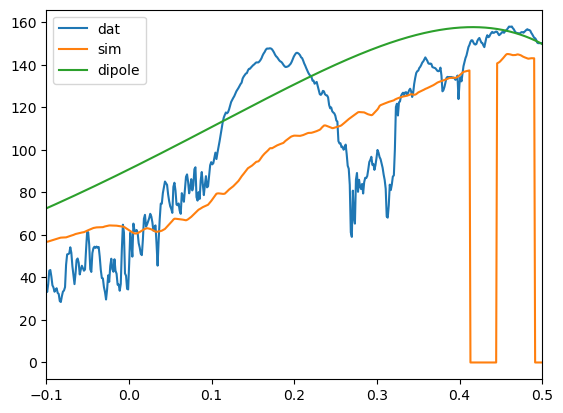

In [92]:
plt.plot(temp["Z"]/R_M,temp["B_z"],label='dat')
plt.plot(temp["Z"]/R_M,temp["B_z_sim"],label='sim')
plt.plot(temp["Z"]/R_M,Bz_dip(temp["X"]/R_M,temp["Y"]/R_M,temp["Z"]/R_M),label='dipole')
plt.legend()
plt.xlim(-0.1,0.5)

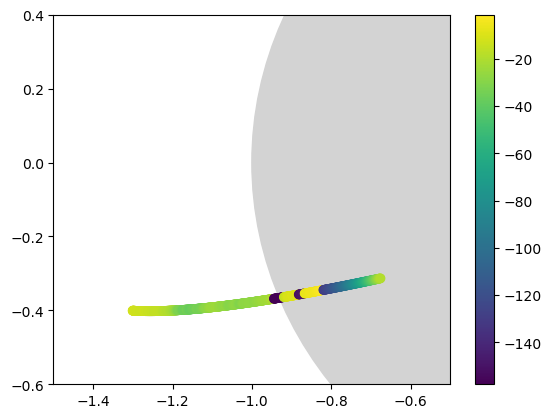

In [93]:
fig,ax = plt.subplots()
outer = plt.Circle((0, 0), 1, color='lightgray') 
ax.add_patch(outer)
plot=ax.scatter(temp["X"]/R_M,temp["Y"]/R_M,c=temp["B_z_sim"]-Bz_dip(temp["X"]/R_M,temp["Y"]/R_M,temp["Z"]/R_M))
ax.set_xlim(-1.5,-0.5)
ax.set_ylim(-0.6,0.4)
fig.colorbar(plot)

Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2014-12-23
Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2014-12-24
Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2014-12-25
Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2014-12-26
Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2014-12-27
Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2014-12-28
Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2014-12-29
Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2014-12-30
Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2014-12-31
Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2015-01-01
Reading lowres data: /Users/atcushen/Documents/MercuryModelling/MAG_lowres/2015-01-02
Reading lowres data: /Users/atcushen/Documents/Mercury

/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_38713/1734522727.py:355: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['local_time'][df['X']<0] = 24 - df['local_time'][df['X']<0]
/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T

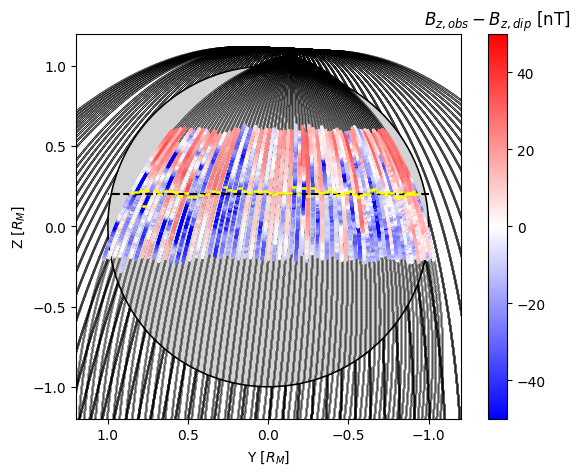

In [6]:
# Define directories for MAG data
dir = "/Users/atcushen/Documents/MercuryModelling/MAG_lowres/"
folder_ls = ["2014-9-30","2014-10-01","2014-10-02","2014-10-03","2014-10-04","2014-10-05","2014-10-06","2014-10-07",
            "2014-10-08","2014-10-09","2014-10-10","2014-10-11","2014-10-12","2014-10-13","2014-10-14","2014-10-15",
            "2014-10-16","2014-10-17"]

folder_ls = ["2014-12-23","2014-12-24","2014-12-25","2014-12-26","2014-12-27","2014-12-28","2014-12-29","2014-12-30",
             "2014-12-31","2015-01-01","2015-01-02","2015-01-03","2015-01-04","2015-01-05","2015-01-06","2015-01-07",
             "2015-01-08","2015-01-09","2015-01-10","2015-01-11","2015-01-12","2015-01-13","2015-01-14"]#,"2015-01-15",
             #"2015-01-16"]

#folder_ls = ["2015-03-20","2015-03-21","2015-03-22","2015-03-23","2015-03-23","2015-03-25",
#             "2015-03-26","2015-03-27","2015-03-28","2015-03-29","2015-03-30","2015-03-31",
#             "2015-04-01","2015-04-02","2015-04-03","2015-04-04","2015-04-05","2015-04-06",
#             "2015-04-07","2015-04-08","2015-04-09","2015-04-10","2015-04-11","2015-04-12"]
             
# Define "df", which is the dataframe storing all the MAG data
df = read_mag(str(dir+folder_ls[0]))
for day in folder_ls[1:]:
    df = pd.concat([df,read_mag(str(dir+day))], ignore_index=True)

# Define df_cs, which is just the data around the current sheet crossings
#df_cs = extract_cs(df,criteria = 'z', threshold = 0.5)
df_cs = extract_cs(df,criteria = 'Bx', threshold = 0.4).reset_index(drop=True)

# Compute derived terms for df_cs
df_cs = calculate_terms(df_cs,use_model_data=False)

# Show the orbits
plot_cs_passes4(df,df_cs)

In [8]:
# Load in GRS energetic electron data
# Define "GRS", which will store the GRS coincidence shield counts
dir = "/Users/atcushen/Documents/MercuryModelling/GRS/"
#GRS = read_GRS(str(dir),summing=1)
# Load pre-processed data
with open(dir+"GRS_data", 'rb') as f:
        GRS = pickle.load(f)

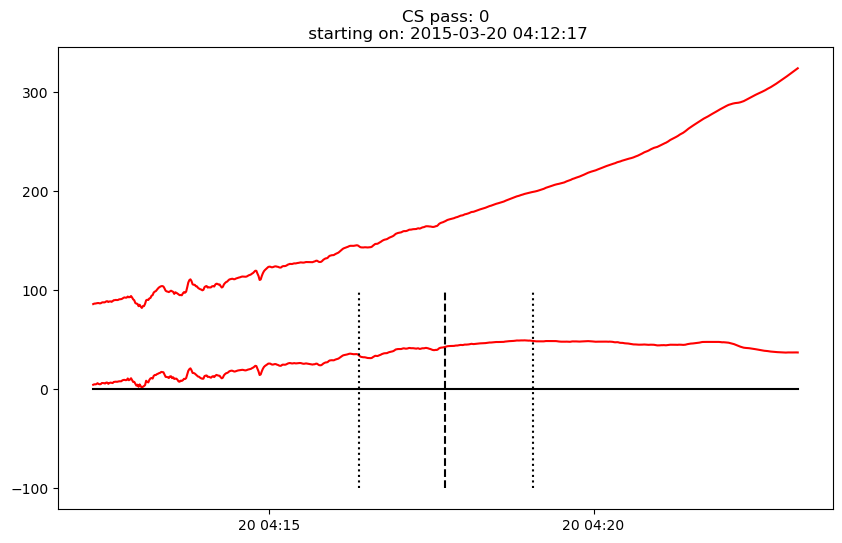

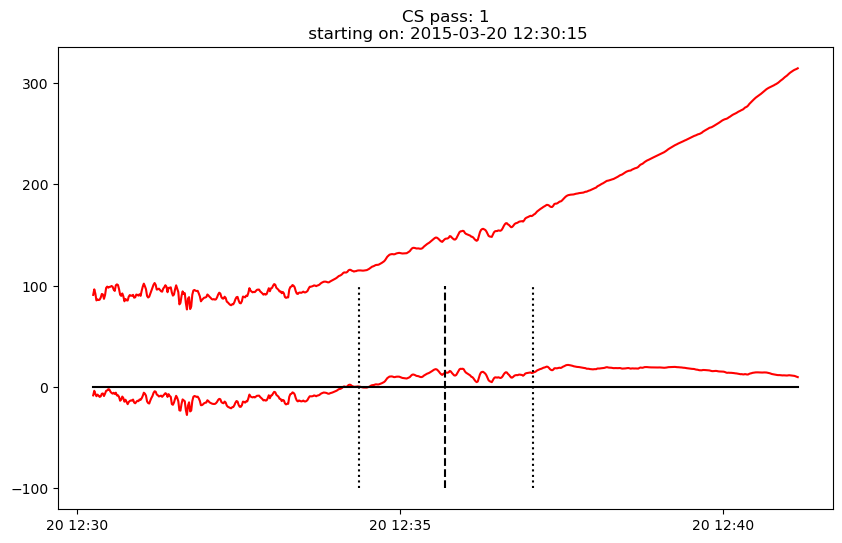

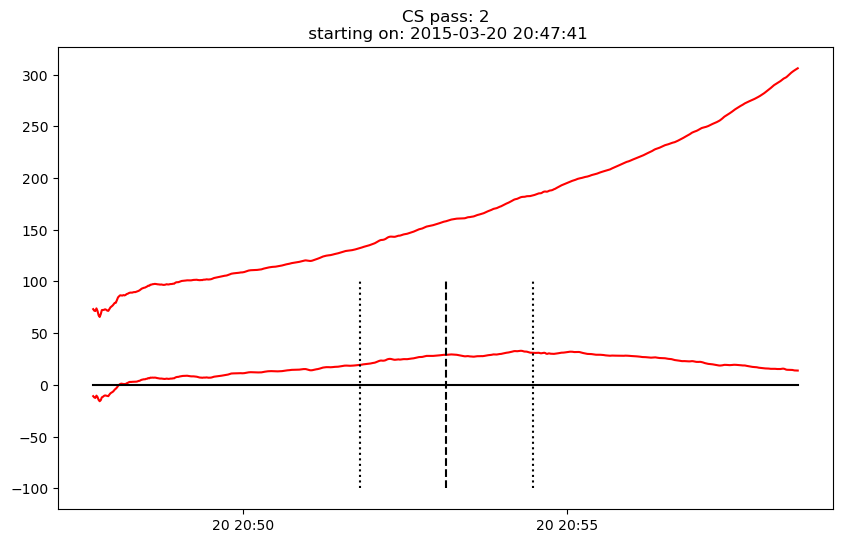

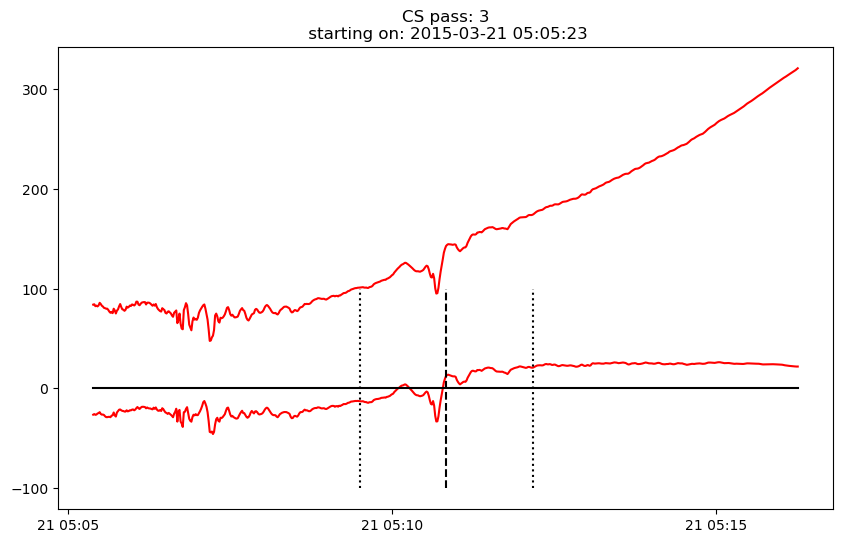

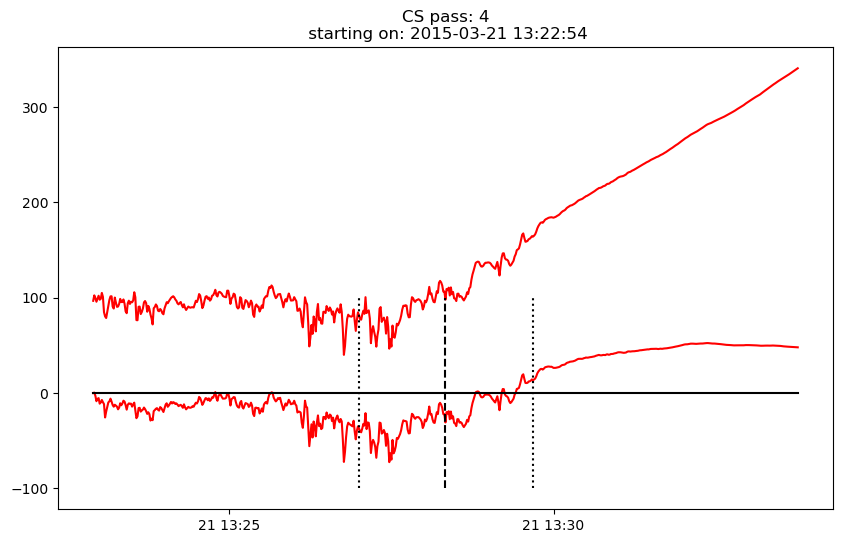

...

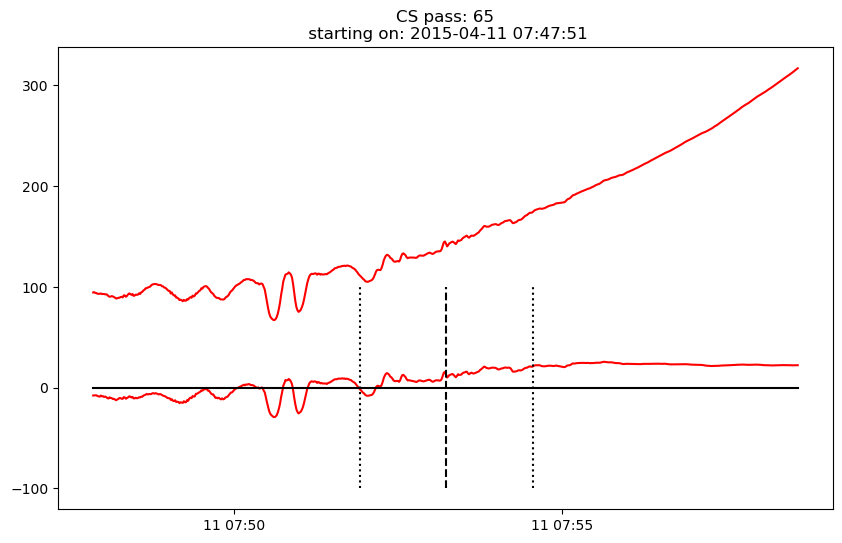

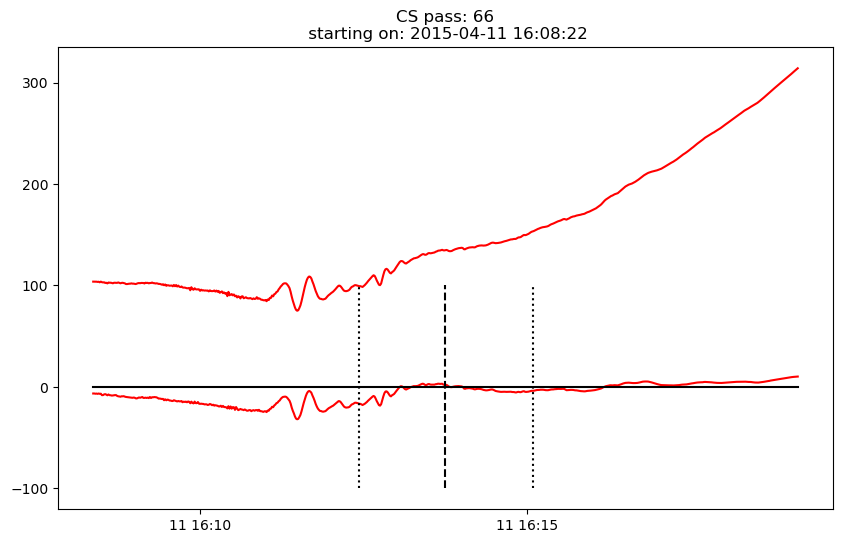

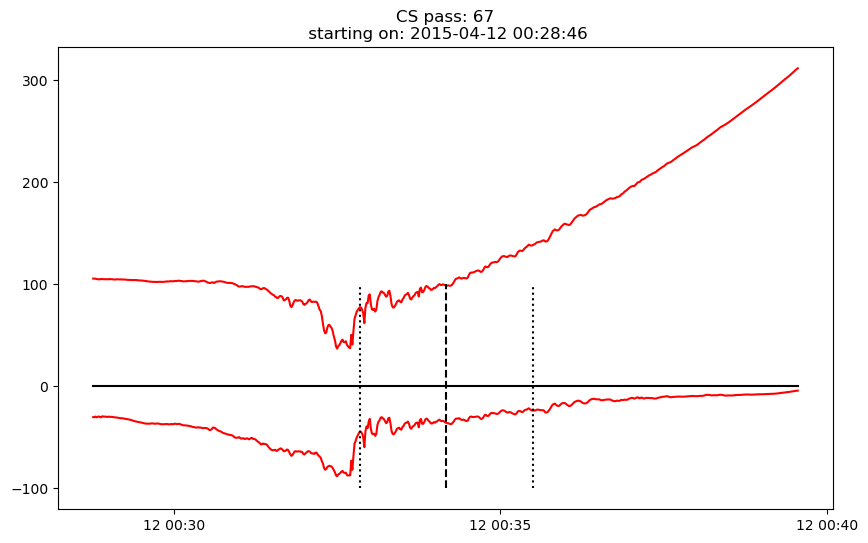

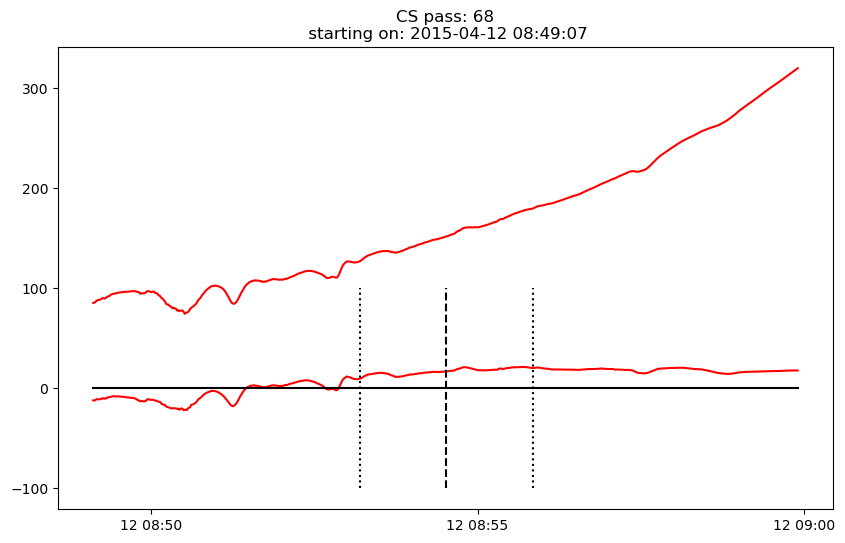

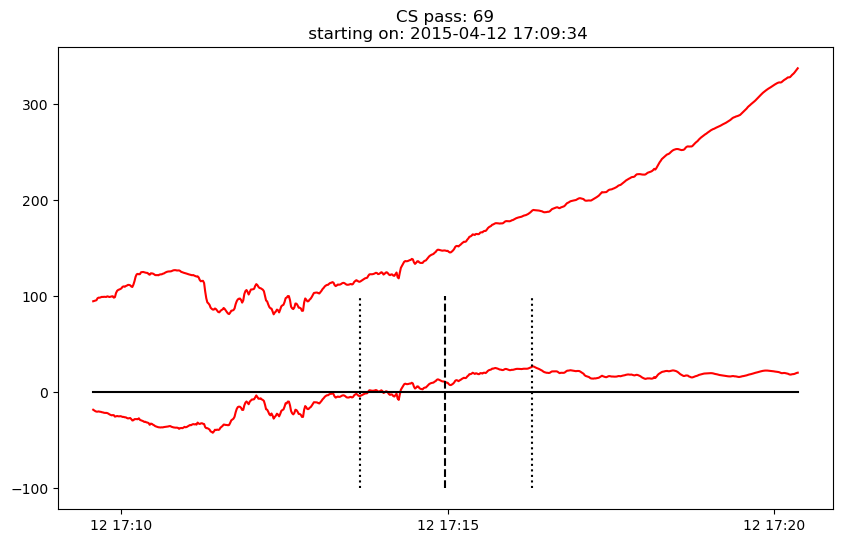

In [11]:
# Show all the cs passes
#plot_Bz_minus_Bzdip(df_cs)

# Determine the centered DR-type events (requires the 'Bx' fitting mode such that the cs center is the middle index of each cs pass)
DR_passes = extract_DR_passes(df_cs,max_DR_width=0.2)

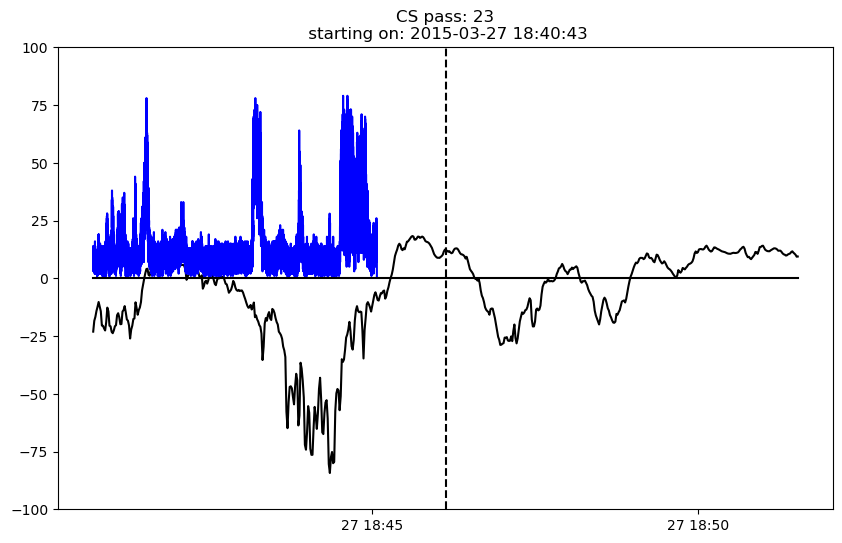

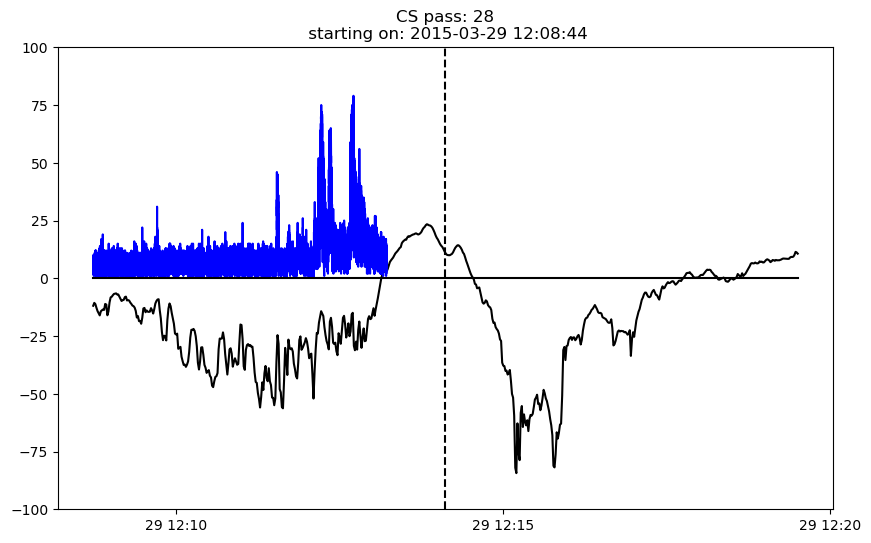

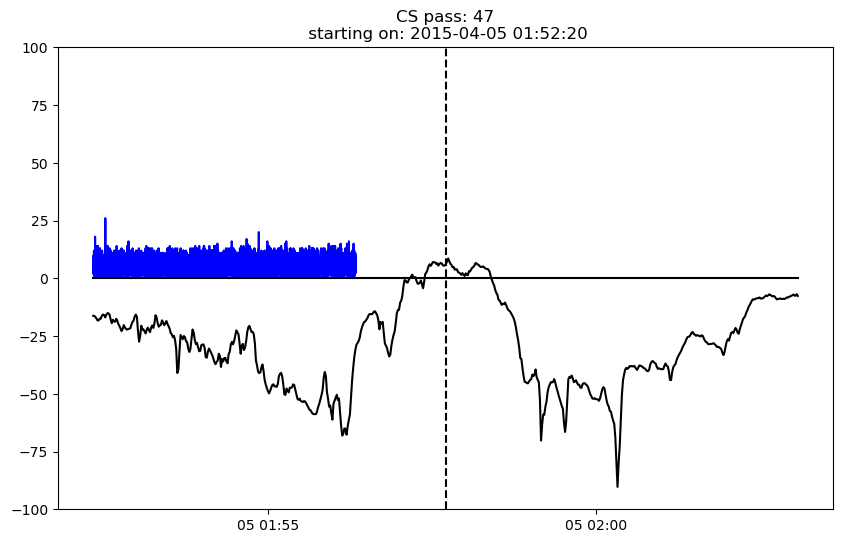

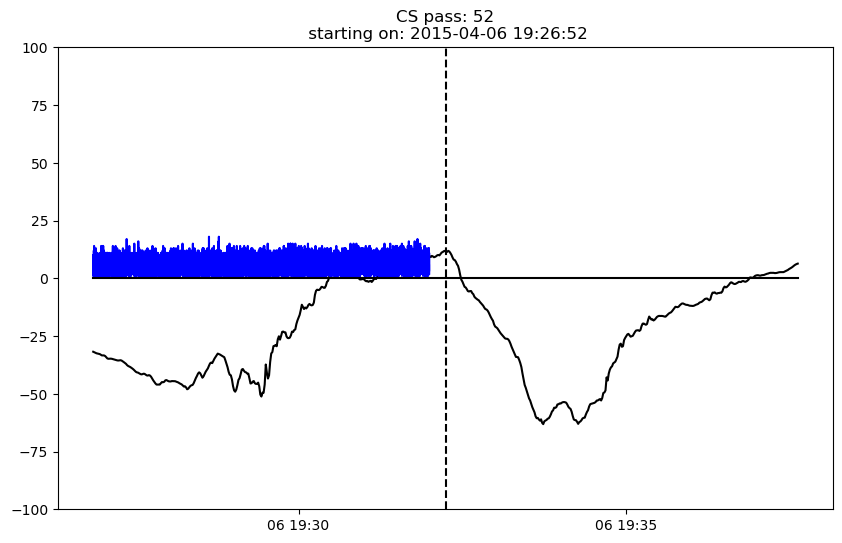

In [10]:
plot_GRS_and_DR(df_cs,GRS,DR_passes)

In [121]:
df_cs["timestamp"][DR_passes[47]]

30617   2015-04-05 01:52:20
30618   2015-04-05 01:52:21
30619   2015-04-05 01:52:22
30620   2015-04-05 01:52:23
30621   2015-04-05 01:52:24
                ...        
31258   2015-04-05 02:03:01
31259   2015-04-05 02:03:02
31260   2015-04-05 02:03:03
31261   2015-04-05 02:03:04
31262   2015-04-05 02:03:05
Name: timestamp, Length: 646, dtype: datetime64[ns]

In [539]:
###SAVE GRS DATA####
#pickle.dump(GRS, open(str(dir+"GRS_data"), 'wb') )
#print("data saved to:",str(dir+"GRS_data"))

data saved to: /Users/atcushen/Documents/MercuryModelling/GRS/GRS_data


Text(0.5, 0, 'Timestamp')

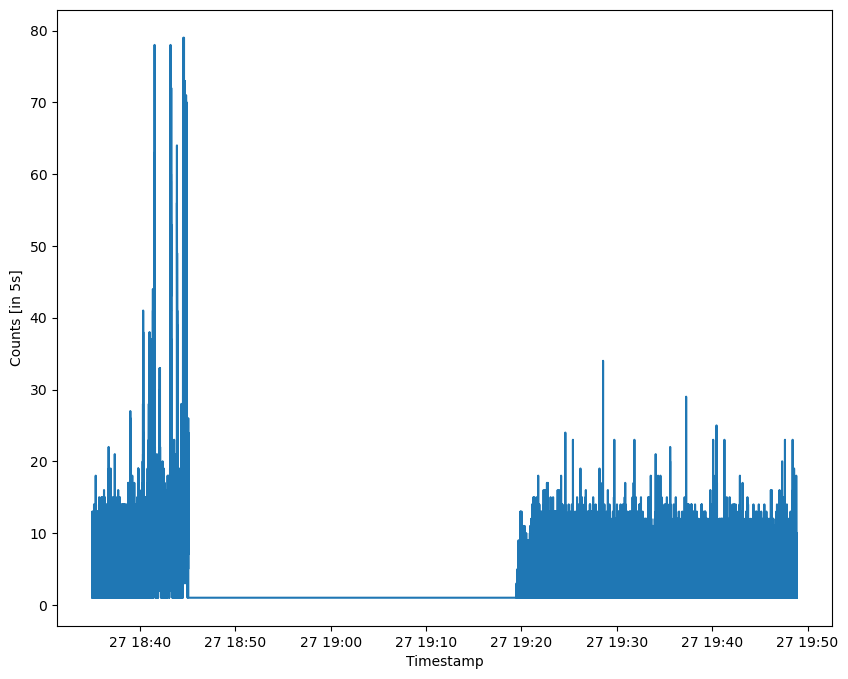

In [11]:
start_time = "2015-03-27 18:35:00"
stop_time = "2015-03-27 19:50:00"
indices = np.where((GRS["timestamp"]>start_time) & (GRS["timestamp"]<stop_time))[0]
fig,ax = plt.subplots(nrows=1,ncols=1,figsize=(10,8))
ax.plot(GRS['timestamp'][indices],GRS['counts'][indices])
ax.set_ylabel("Counts [in 5s]")
ax.set_xlabel("Timestamp")

In [7]:
# Load in full time-res magnetometer data
dir = "/Users/atcushen/Documents/MercuryModelling/MAG_highres/"
#folder_ls = ["2015-03-27","2015-03-29","2015-04-05","2015-04-06"] # Events of interest
folder_ls = ["2015-03-20","2015-03-21","2015-03-22","2015-03-23","2015-03-24","2015-03-25", # All final orbits
             "2015-03-26","2015-03-27","2015-03-28","2015-03-29","2015-03-30","2015-03-31",
             "2015-04-01","2015-04-02","2015-04-03","2015-04-04","2015-04-05","2015-04-06",
             "2015-04-07","2015-04-08","2015-04-09","2015-04-10","2015-04-11","2015-04-12"]
#folder_ls = ["2011-04-09"] # Event from Boardsen et al (2015)


df = read_mag(str(dir+folder_ls[0]),highres=True)
for day in folder_ls[1:]:
    #print(day)
    df = pd.concat([df,read_mag(str(dir+day),highres=True)], ignore_index=True)

df_cs = (extract_cs(df,criteria = 'Bx', threshold = 0.5)).reset_index() #threshold = 0.3
df_cs = calculate_terms(df_cs,use_model_data=False)

Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-20
Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-21
Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-22
Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-23
Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-24
Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-25
Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-26
Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-27
Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-28
Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-29
Reading highres data: /Users/atcushen/Documents/MercuryModelling/MAG_highres/2015-03-30
Reading highres data: /Users/atc

/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_38713/1734522727.py:355: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['local_time'][df['X']<0] = 24 - df['local_time'][df['X']<0]
/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T

UnboundLocalError: local variable 'plot2' referenced before assignment

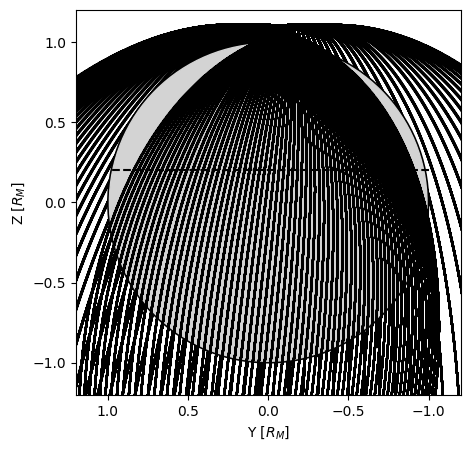

In [8]:
# Show the orbits
plot_cs_passes4(df,df_cs,colorbar="mag_elel")
#plot_cs_passes4(df,df_cs,colorbar="alt")

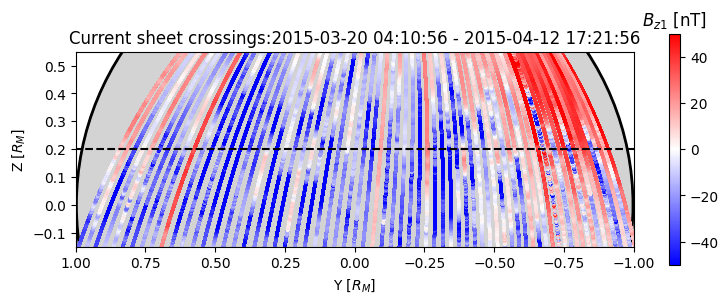

In [9]:
# Look for where the DRs are spread
 # Determine which paths are in front of the planet vs. behind
df_noview =df[(df['X']>0)]
df_inview =df[(df['X']<0)]# & (df['timestamp']>pd.to_datetime("2015-04-01 21:00:00")) & (df['timestamp']<pd.to_datetime("2015-04-03 13:00:00"))]

# Define figure and patches
fig, ax = plt.subplots(ncols=1,figsize=(9,3))
p0 = plt.Circle((0, 0), 1, color='black')
p1 = plt.Circle((0, 0), 0.99, color='lightgrey')

#plot0=ax.scatter(df_noview["Y"]/R_M,df_noview["Z"]/R_M,s=0.01,color='black',alpha=0.5)

# Put in the planet
ax.add_artist(p0)
ax.add_artist(p1)

# plot
#plot1=ax.scatter(df_inview["Y"]/R_M,df_inview["Z"]/R_M,s=0.01,color='black',alpha=0.5)#,c=list((df_inview['DAY_OF_YEAR']-np.min(df_inview['DAY_OF_YEAR']))),
ax.plot([-1,1],[0.2,0.2],linestyle="dashed",color="black")
for pass_num in range(np.max(df_cs['cs_pass'])+1):
    df_pass = df_cs[(df_cs['cs_pass']==pass_num)]
    midpoint = [df_pass["Y"][df_pass.index[len(df_pass.index)//2]]/R_M, df_pass["Z"][df_pass.index[len(df_pass.index)//2]]/R_M]
    plot2=ax.scatter(df_pass["Y"]/R_M,df_pass["Z"]/R_M,s=1.5,c = df_pass["B_z"]-df_pass["B_zdip"],vmin=-50,vmax=50,cmap='bwr')
    #mag_elev = np.arctan(np.abs(df_pass["B_z"] / np.sqrt(df_pass["B_x"]**2+df_pass["B_y"]**2))) * 180/np.pi
    #plot2=ax.scatter(df_pass["Y"]/R_M,df_pass["Z"]/R_M,s=1.5,c = mag_elev,vmin=45,vmax=90,cmap='plasma')
    #ax.plot([midpoint[0]-0.008,midpoint[0]+0.008],[midpoint[1],midpoint[1]],lw=1.8,color="yellow")
    
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(-1.0,1.0)
ax.set_ylim(-0.15,0.55)
ax.invert_xaxis()
ax.set_xlabel("Y [$R_M$]")
ax.set_ylabel("Z [$R_M$]")
clb1 = fig.colorbar(plot2, ax=ax)
clb1.ax.set_title("$B_{z1}$ [nT]")
ax.set_title(str("Current sheet crossings:"+str(df_cs['timestamp'][0])[:-7]+" - "+str(df_cs['timestamp'][len(df_cs)-1])[:-7]))
plt.savefig("DR_distribution.png",dpi=300)
plt.show()
plt.close()

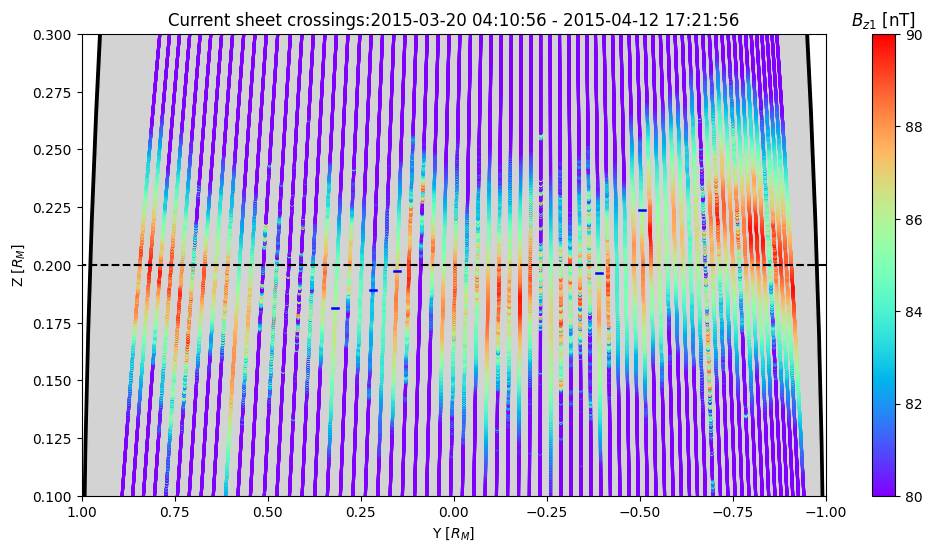

In [18]:
# Look for where the DRs are spread
 # Determine which paths are in front of the planet vs. behind
df_noview =df[(df['X']>0)]
df_inview =df[(df['X']<0)]# & (df['timestamp']>pd.to_datetime("2015-04-01 21:00:00")) & (df['timestamp']<pd.to_datetime("2015-04-03 13:00:00"))]

# Define figure and patches
fig, ax = plt.subplots(ncols=1,figsize=(12,6))
p0 = plt.Circle((0, 0), 1, color='black')
p1 = plt.Circle((0, 0), 0.99, color='lightgrey')

#plot0=ax.scatter(df_noview["Y"]/R_M,df_noview["Z"]/R_M,s=0.01,color='black',alpha=0.5)

# Put in the planet
ax.add_artist(p0)
ax.add_artist(p1)

# plot
#plot1=ax.scatter(df_inview["Y"]/R_M,df_inview["Z"]/R_M,s=0.01,color='black',alpha=0.5)#,c=list((df_inview['DAY_OF_YEAR']-np.min(df_inview['DAY_OF_YEAR']))),
ax.plot([-1,1],[0.2,0.2],linestyle="dashed",color="black")
for pass_num in range(np.max(df_cs['cs_pass'])+1):
    df_pass = df_cs[(df_cs['cs_pass']==pass_num)]
    midpoint = [df_pass["Y"][df_pass.index[len(df_pass.index)//2]]/R_M, df_pass["Z"][df_pass.index[len(df_pass.index)//2]]/R_M]
    #plot2=ax.scatter(df_pass["Y"]/R_M,df_pass["Z"]/R_M,s=1.5,c = df_pass["B_z"]-df_pass["B_zdip"],vmin=-50,vmax=50,cmap='bwr')
    mag_elev = np.arctan(np.abs(df_pass["B_z"] / np.sqrt(df_pass["B_x"]**2+df_pass["B_y"]**2))) * 180/np.pi
    plot2=ax.scatter(df_pass["Y"]/R_M,df_pass["Z"]/R_M,s=1.5,c = mag_elev,vmin=80,vmax=90,cmap='rainbow')
    if pass_num in [22,27,46,48,51]:
        ax.plot([midpoint[0]-0.008,midpoint[0]+0.008],[midpoint[1],midpoint[1]],lw=1.8,color="blue")
    
#ax.set_aspect('equal', adjustable='box')
ax.set_xlim(-1.0,1.0)
ax.set_ylim(0.1,0.3)
ax.invert_xaxis()
ax.set_xlabel("Y [$R_M$]")
ax.set_ylabel("Z [$R_M$]")
clb1 = fig.colorbar(plot2, ax=ax)
clb1.ax.set_title("$B_{z1}$ [nT]")
ax.set_title(str("Current sheet crossings:"+str(df_cs['timestamp'][0])[:-7]+" - "+str(df_cs['timestamp'][len(df_cs)-1])[:-7]))
plt.savefig("DR_distribution.png",dpi=300)
plt.show()
plt.close()

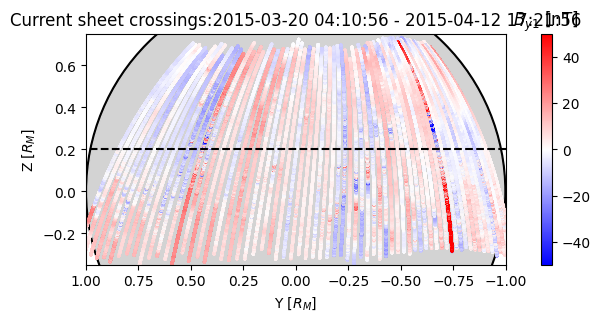

In [168]:
# Look for where the DRs are spread
 # Determine which paths are in front of the planet vs. behind
df_noview =df[(df['X']>0)]
df_inview =df[(df['X']<0)]# & (df['timestamp']>pd.to_datetime("2015-04-01 21:00:00")) & (df['timestamp']<pd.to_datetime("2015-04-03 13:00:00"))]

# Define figure and patches
fig, ax = plt.subplots(ncols=1,figsize=(9,3))
p0 = plt.Circle((0, 0), 1, color='black')
p1 = plt.Circle((0, 0), 0.99, color='lightgrey')

#plot0=ax.scatter(df_noview["Y"]/R_M,df_noview["Z"]/R_M,s=0.01,color='black',alpha=0.5)

# Put in the planet
ax.add_artist(p0)
ax.add_artist(p1)

# plot
#plot1=ax.scatter(df_inview["Y"]/R_M,df_inview["Z"]/R_M,s=0.01,color='black',alpha=0.5)#,c=list((df_inview['DAY_OF_YEAR']-np.min(df_inview['DAY_OF_YEAR']))),
ax.plot([-1,1],[0.2,0.2],linestyle="dashed",color="black")
for pass_num in range(np.max(df_cs['cs_pass'])+1):
    df_pass = df_cs[(df_cs['cs_pass']==pass_num)]
    midpoint = [df_pass["Y"][df_pass.index[len(df_pass.index)//2]]/R_M, df_pass["Z"][df_pass.index[len(df_pass.index)//2]]/R_M]
    plot2=ax.scatter(df_pass["Y"]/R_M,df_pass["Z"]/R_M,s=1.5,c = df_pass["B_y"]-df_pass["B_ydip"],vmin=-50,vmax=50,cmap='bwr')
    #ax.plot([midpoint[0]-0.008,midpoint[0]+0.008],[midpoint[1],midpoint[1]],lw=1.8,color="yellow")
    
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(-1.0,1.0)
ax.set_ylim(-0.35,0.75)
ax.invert_xaxis()
ax.set_xlabel("Y [$R_M$]")
ax.set_ylabel("Z [$R_M$]")
clb1 = fig.colorbar(plot2, ax=ax)
clb1.ax.set_title("$B_{y1}$ [nT]")
ax.set_title(str("Current sheet crossings:"+str(df_cs['timestamp'][0])[:-7]+" - "+str(df_cs['timestamp'][len(df_cs)-1])[:-7]))
plt.savefig("By1_distribution.png",dpi=300)
plt.show()
plt.close()

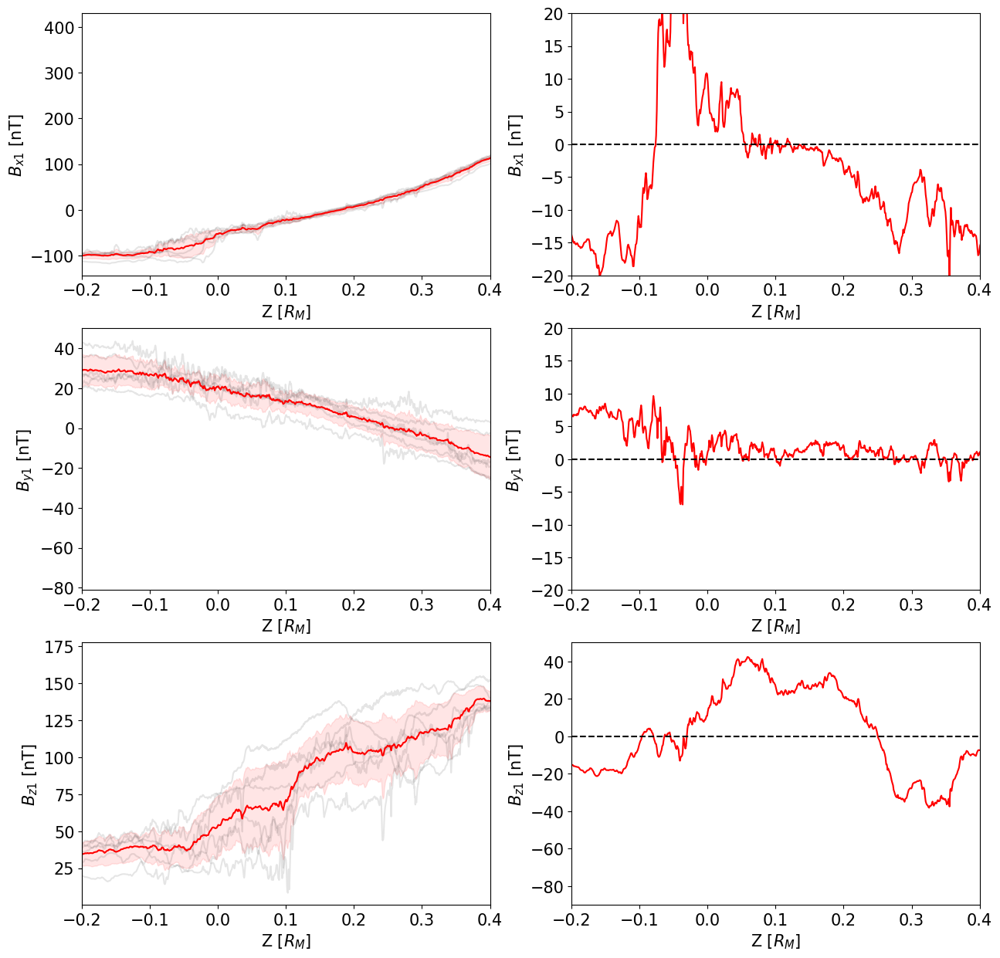

In [9]:
#DF averages of Bz1
#INPUT
time_average = 1*20 # how many time steps to average over (20 timesteps per sec * num of seconds)
DR_events = [51,]#[22,27,46,51]

def average_datasets_with_std(datasets, x_common=None, num_points=1000):
    # Flatten all x values from datasets to determine the common x range
    all_x = np.concatenate([x for x, z in datasets])
    min_x, max_x = np.min(all_x), np.max(all_x)

    # If a custom common x grid is not provided, generate it
    if x_common is None:
        x_common = np.linspace(min_x, max_x, num_points)

    # Initialize arrays for the accumulated sums and squared differences
    z_sum = np.zeros_like(x_common)
    z_squared_sum = np.zeros_like(x_common)
    valid_counts = np.zeros_like(x_common)

    # Interpolate each dataset to the common x values and accumulate results
    for x, z in datasets:
        interp_func = interp1d(x, z, kind='linear', bounds_error=False, fill_value=np.nan)
        z_interp = interp_func(x_common)

        valid_mask = ~np.isnan(z_interp)

        z_sum[valid_mask] += z_interp[valid_mask]
        z_squared_sum[valid_mask] += z_interp[valid_mask] ** 2
        valid_counts[valid_mask] += 1

    # Compute average
    with np.errstate(invalid='ignore', divide='ignore'):  # Suppress warnings
        z_average = z_sum / valid_counts

    # Compute variance and standard deviation
    with np.errstate(invalid='ignore', divide='ignore'):  # Suppress warnings
        z_variance = (z_squared_sum / valid_counts) - (z_average ** 2)
        z_std = np.sqrt(z_variance)

    return x_common, z_average, z_std

# Declare our figure
fig, axs = plt.subplots(ncols=2, nrows=3,figsize=(15,15))

# Declare an empty list to store our chosen data for each cs pass
B_x_data = []
B_y_data = []
B_z_data = []
B_x_DR_data = []
B_y_DR_data = []
B_z_DR_data = []

# Iterate through each pass
for event in np.unique(df_cs['cs_pass'])[DR_events[0]-3:DR_events[0]+3]:
    indices = np.where(df_cs['cs_pass']==event)[0]

    # Unpack data
    X = df_cs['X'][indices].to_numpy()
    Y = df_cs['Y'][indices].to_numpy()
    Z = df_cs['Z'][indices].to_numpy()
    B_x = uniform_filter1d(df_cs['B_x'][indices],size = time_average)
    B_y = uniform_filter1d(df_cs['B_y'][indices],size = time_average)
    B_z = uniform_filter1d(df_cs['B_z'][indices],size = time_average)
    B_xdip = calc_B_xdip(X,Y,Z)
    B_ydip = calc_B_ydip(X,Y,Z)
    B_zdip = calc_B_zdip(X,Y,Z)
    B_mag = np.sqrt(B_x**2+B_y**2+B_z**2)

    # Compute cs-centered position
    Zprime = (Z - (Z[-1] + Z[0])/2)
    
    # Compute dipole-difference terms
    B_x1 = B_x - B_xdip
    B_y1 = B_y - B_ydip
    B_z1 = B_z - B_zdip

    # Save an entry for Z' and Bz1 for each pass
    B_x_data.append([Z, B_x])
    B_y_data.append([Z, B_y])
    B_z_data.append([Z, B_z])
    if event in DR_events:
        B_x_DR_data.append([Z, B_x])
        B_y_DR_data.append([Z, B_y])
        B_z_DR_data.append([Z, B_z])
    axs[0,0].plot(Z/R_M,B_x,color='black',alpha= 0.1)
    axs[1,0].plot(Z/R_M,B_y,color='black',alpha= 0.1)
    axs[2,0].plot(Z/R_M,B_z,color='black',alpha= 0.1)

# Use interpolation to average over all events
Zprime, B_x_average, B_x_std = average_datasets_with_std(B_x_data)
Zprime, B_y_average, B_y_std = average_datasets_with_std(B_y_data)
Zprime, B_z_average, B_z_std = average_datasets_with_std(B_z_data)

# Show average pass
axs[0,0].plot(Zprime/R_M,B_x_average,color='red')
axs[1,0].plot(Zprime/R_M,B_y_average,color='red')
axs[2,0].plot(Zprime/R_M,B_z_average,color='red')

# Show standard variation
axs[0,0].fill_between(Zprime/R_M,B_x_average-B_x_std, B_x_average+B_x_std,color='red',alpha=0.1)
axs[1,0].fill_between(Zprime/R_M,B_y_average-B_y_std, B_y_average+B_y_std,color='red',alpha=0.1)
axs[2,0].fill_between(Zprime/R_M,B_z_average-B_z_std, B_z_average+B_z_std,color='red',alpha=0.1)

# Use interpolation to average over selected events
Zprime, B_x_averageDF, B_x_std = average_datasets_with_std(B_x_DR_data)
Zprime, B_y_averageDF, B_y_std = average_datasets_with_std(B_y_DR_data)
Zprime, B_z_averageDF, B_z_std = average_datasets_with_std(B_z_DR_data)

# Show average pass
axs[0,1].plot(Zprime/R_M,B_x_averageDF-B_x_average,color='red')
axs[1,1].plot(Zprime/R_M,B_y_averageDF-B_y_average,color='red')
axs[2,1].plot(Zprime/R_M,B_z_averageDF-B_z_average,color='red')

# Show standard variation
#axs[0,1].fill_between(Zprime/R_M,B_x_average-B_x_std, B_x_average+B_x_std,color='red',alpha=0.1)
#axs[1,1].fill_between(Zprime/R_M,B_y_average-B_y_std, B_y_average+B_y_std,color='red',alpha=0.1)
#axs[2,1].fill_between(Zprime/R_M,B_z_average-B_z_std, B_z_average+B_z_std,color='red',alpha=0.1)


# Clean up axes
for row in range(len(axs[:,0])):
    coord = ["x","y","z"][row]
    zlims = [[-20,20],[-20,20],[-90,50]][row]
    for column in range(len(axs[0,:])):
        ax = axs[row,column]
        # Trim slightly to remove edges
        ax.set_xlim(Zprime[5]/R_M,Zprime[-5]/R_M)
        if column==1:
            ax.set_ylim(*zlims)
        ax.set_xlim(-0.2,0.4)
    
        # Add 0 line
        if column == 1:
            ax.axhline(y=0,color='black',linestyle='dashed')
    
        # Add labels
        ax.set_xlabel("Z [$R_M$]",fontsize=15)
        ax.set_ylabel(str("$B_{"+coord+"1}$ [nT]"),fontsize=15)
    
        # Set font size
        ax.tick_params(axis='both',labelsize=15)

# Save
fig.savefig('DR_Bz1_overview.png',bbox_inches='tight', dpi=300)
plt.show()
#print(f'Common x: {x_common}')
#print(f'Average z: {z_average}')

Zprime_backup = Zprime

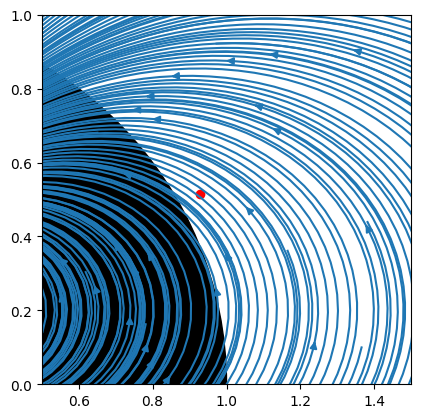

In [100]:
# TEST DIPOLE FIELD COMPUTATION

xx,zz = np.meshgrid(np.linspace(-2*R_M,2*R_M,2000),np.linspace(-2*R_M,2*R_M,2000))
yy = np.zeros_like(xx)
Bx = calc_B_xdip(xx,yy,zz)
Bz = calc_B_zdip(xx,yy,zz)

fig,ax = plt.subplots(nrows=1)
ax.streamplot(xx/R_M,zz/R_M,Bx,Bz,density=3, broken_streamlines=False)
ax.add_patch(plt.Circle((0, 0), 1, color='black'))
ax.set_aspect(1)

ax.set_xlim(0.5,1.5)
ax.set_ylim(0,1)

ax.scatter(np.sqrt(.92**2+.133**2),0.514,color='red')

/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_58759/1451549011.py:62: RuntimeWarning: divide by zero encountered in divide
  Cx2 = B_y*dB_x/dY
/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_58759/1451549011.py:65: RuntimeWarning: divide by zero encountered in divide
  Cy2 = B_y*dB_y/dY
/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_58759/1451549011.py:68: RuntimeWarning: divide by zero encountered in divide
  Cz2 = B_y*dB_z/dY
/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_58759/1451549011.py:106: RuntimeWarning: divide by zero encountered in divide
  P_mag_y = dB2 / dY / (2*mu_0) * (1e-9)**2 * (1e-3)
/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_58759/1451549011.py:62: RuntimeWarning: divide by zero encountered in divide
  Cx2 = B_y*dB_x/dY
/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_58759/1451549011.py:65: RuntimeWarning: divide by zero encountered in divide
  Cy2 = B_y*dB_y/dY
/var/folders/l9/dnt9qhfd1psfsm

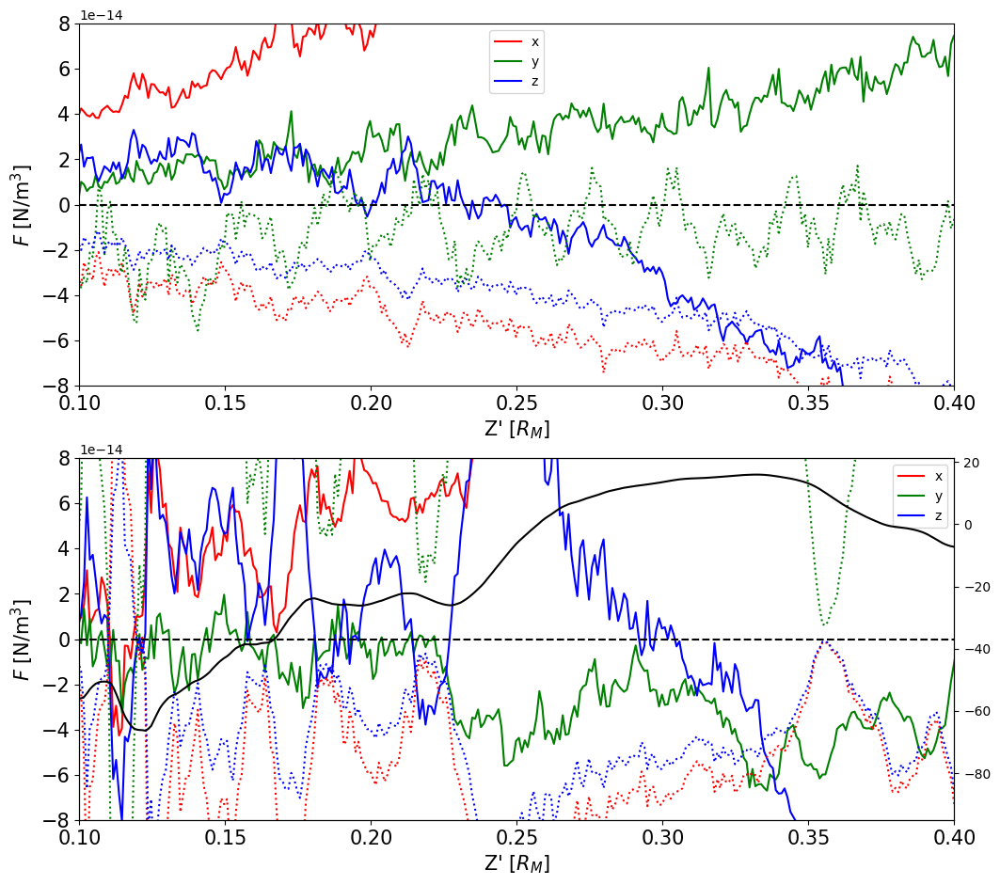

In [83]:
#DF averages of pressure and tension
#INPUT
time_average = 10*20 # how many time steps to average over (20 timesteps per sec * num of seconds)
DR_events = [48,]#[22,27,46,51]

# BEGIN COMPUTATION

# Declare our figure
fig, axs = plt.subplots(nrows=2,figsize=(12,11))

# Declare an empty list to store our chosen data for each cs pass
dataset_f_mag = []
dataset_f_x = []
dataset_f_y = []
dataset_f_z = []
dataset_P_mag_x = []
dataset_P_mag_y = []
dataset_P_mag_z = []

dataset_B_z_DR = []
dataset_f_mag_DR = []
dataset_f_x_DR = []
dataset_f_y_DR = []
dataset_f_z_DR = []
dataset_P_mag_x_DR = []
dataset_P_mag_y_DR = []
dataset_P_mag_z_DR = []

# Iterate through each pass
for event in np.unique(df_cs['cs_pass']):
    indices = np.where(df_cs['cs_pass']==event)[0]

    # Unpack the data
    X = df_cs['X'][indices]
    Y = df_cs['Y'][indices]
    Z = df_cs['Z'][indices]
    B_x = uniform_filter1d(df_cs['B_x'][indices],size = time_average)
    B_y = uniform_filter1d(df_cs['B_y'][indices],size = time_average)
    B_z = uniform_filter1d(df_cs['B_z'][indices],size = time_average)
    B_xdip = calc_B_xdip(X,Y,Z)
    B_ydip = calc_B_ydip(X,Y,Z)
    B_zdip = calc_B_zdip(X,Y,Z)
    B_mag = np.sqrt(B_x**2+B_y**2+B_z**2)

    # Compute differences
    dX = np.insert(np.diff(X),0,np.diff(X)[0])
    dY = np.insert(np.diff(Y),0,np.diff(Y)[0])
    dZ = np.insert(np.diff(Z),0,np.diff(Z)[0])
    dB_x = np.insert(np.diff(B_x),0,np.diff(B_x)[0]) # insert 0 at the front to fill the gap
    dB_y = np.insert(np.diff(B_y),0,np.diff(B_y)[0])
    dB_z = np.insert(np.diff(B_z),0,np.diff(B_z)[0])
    dB2 = np.insert(np.diff(B_mag**2),0,np.diff(B_mag**2)[0])
    #dB_xdip = np.insert(np.diff(B_xdip),0,np.diff(B_xdip)[0])
    #dB_ydip = np.insert(np.diff(B_ydip),0,np.diff(B_ydip)[0])
    #dB_zdip = np.insert(np.diff(B_zdip),0,np.diff(B_zdip)[0])

    # Fix the tiny dY using amask
    mask = np.abs(dY)<1e-2

    # Compute tension subcomponents
    Cx1 = B_x*dB_x/dX
    Cx2 = B_y*dB_x/dY
    Cx3 = B_z*dB_x/dZ
    Cy1 = B_x*dB_y/dX
    Cy2 = B_y*dB_y/dY
    Cy3 = B_z*dB_y/dZ
    Cz1 = B_x*dB_z/dX
    Cz2 = B_y*dB_z/dY
    Cz3 = B_z*dB_z/dZ
    #Cx1_dip = B_xdip*dB_xdip/dX
    #Cx2_dip = B_ydip*dB_xdip/dY
    #Cx3_dip = B_zdip*dB_xdip/dZ
    #Cy1_dip = B_xdip*dB_ydip/dX
    #Cy2_dip = B_ydip*dB_ydip/dY
    #Cy3_dip = B_zdip*dB_ydip/dZ
    #Cz1_dip = B_xdip*dB_zdip/dX
    #Cz2_dip = B_ydip*dB_zdip/dY
    #Cz3_dip = B_zdip*dB_zdip/dZ

    # Replace nans of all terms with 1/dY with 0
    Cx2[mask] = 0
    Cy2[mask] = 0
    Cz2[mask] = 0
    #Cx2_dip[mask] = 0
    #Cy2_dip[mask] = 0
    #Cz2_dip[mask] = 0

    # Smooth out the peaks
    Cx2 = gaussian_filter1d(Cx2,sigma = 3) 
    Cy2 = gaussian_filter1d(Cy2,sigma = 3) 
    Cz2 = gaussian_filter1d(Cz2,sigma = 3) 
    #Cx2_dip = uniform_filter1d(Cx2_dip,size = 20) 
    #Cy2_dip = uniform_filter1d(Cy2_dip,size = 20) 
    #Cz2_dip = uniform_filter1d(Cz2_dip,size = 20) 

    # Compute tension components, convert to SI (B in nT, dX in 1/km)
    f_x = 1/mu_0 * (Cx1+Cx2+Cx3) * (1e-9)**2 * 1e-3
    f_y = 1/mu_0 * (Cy1+Cy2+Cy3) * (1e-9)**2 * 1e-3
    f_z = 1/mu_0 * (Cz1+Cz2+Cz3) * (1e-9)**2 * 1e-3
    #f_xdip = 1/mu_0 * (Cx1_dip+Cx2_dip+Cx3_dip) * (1e-9)**2 * 1e-3
    #f_ydip = 1/mu_0 * (Cy1_dip+Cy2_dip+Cy3_dip) * (1e-9)**2 * 1e-3
    #f_zdip = 1/mu_0 * (Cz1_dip+Cz2_dip+Cz3_dip) * (1e-9)**2 * 1e-3

    # Compute pressure gradient, convert to SI
    P_mag_x = dB2 / dX / (2*mu_0) * (1e-9)**2 * (1e-3)
    P_mag_y = dB2 / dY / (2*mu_0) * (1e-9)**2 * (1e-3)
    P_mag_z = dB2 / dZ / (2*mu_0) * (1e-9)**2 * (1e-3)

    #if event == DR_events[0]:
    #    fig,ax = plt.subplots()
    #    ax.plot(-P_mag_z)
    #    ax.twinx().plot(B_z)
    #    plt.show()

    # Fix similar errors in these gradients
    P_mag_y[mask] = 0
    P_mag_y = gaussian_filter1d(P_mag_y, sigma = 3)

    # Project into cylindrical coords
    f_mag = np.sqrt(f_x**2+f_y**2+f_z**2)
    f_r = (f_x*X+f_y*Y+f_z*Z)/np.sqrt(X**2+Y**2+Z**2)
    f_perp = np.sqrt(f_x**2+f_y**2+f_z**2) - np.abs(f_r)
    #f_rdip = (f_xdip*X+f_ydip*Y+f_zdip*Z)/np.sqrt(X**2+Y**2+Z**2)
    #f_magdip = np.sqrt(f_xdip**2+f_ydip**2+f_zdip**2)
    #f_perpdip = np.sqrt(f_xdip**2+f_ydip**2+f_zdip**2) - np.abs(f_rdip)
    
    # Save an entry to the datasets
    Zprime = (df_cs["Z"][indices] - (df_cs["Z"][indices[-1]] + df_cs["Z"][indices[0]])/2).to_numpy()
    dataset_f_x.append([Zprime, f_x])
    dataset_f_y.append([Zprime, f_y])
    dataset_f_z.append([Zprime, f_z])
    dataset_P_mag_x.append([Zprime, P_mag_x])
    dataset_P_mag_y.append([Zprime, P_mag_y])
    dataset_P_mag_z.append([Zprime, P_mag_z])
    
    # If this is a DR, do the extra save:
    if event in DR_events:
        dataset_B_z_DR.append([Zprime, B_z-B_zdip])
        dataset_f_x_DR.append([Zprime, f_x])
        dataset_f_y_DR.append([Zprime, f_y])
        dataset_f_z_DR.append([Zprime, f_z])
        dataset_P_mag_x_DR.append([Zprime, P_mag_x])
        dataset_P_mag_y_DR.append([Zprime, P_mag_y])
        dataset_P_mag_z_DR.append([Zprime, P_mag_z])

        #fig,ax = plt.subplots(figsize=(12,8))
        #ax.plot(Zprime/R_M,Cz1,color='red')
        #ax.plot(Zprime/R_M,Cz2,color='green')
        #ax.plot(Zprime/R_M,Cz3,color='blue')
        #ax.set_xlim(-0.2,0.2)
        ##ax.set_ylim(-20,20)
        #ax.twinx().plot(Zprime,B_z,color='black')
        #plt.show()



# Use interpolation to average over all events
z_common, f_x_avg, f_x_std = average_datasets_with_std(dataset_f_x)
z_common, f_y_avg, f_y_std = average_datasets_with_std(dataset_f_y)
z_common, f_z_avg, f_z_std = average_datasets_with_std(dataset_f_z)
z_common, P_mag_x_avg, P_mag_x_std = average_datasets_with_std(dataset_P_mag_x)
z_common, P_mag_y_avg, P_mag_y_std = average_datasets_with_std(dataset_P_mag_y)
z_common, P_mag_z_avg, P_mag_z_std = average_datasets_with_std(dataset_P_mag_z)

# Show averages
axs[0].plot(z_common/R_M, f_x_avg, label = 'x',color='red')
axs[0].plot(z_common/R_M, f_y_avg, label = 'y',color='green')
axs[0].plot(z_common/R_M, f_z_avg, label = 'z',color='blue')
axs[0].plot(z_common/R_M, -P_mag_x_avg, linestyle = 'dotted', color='red')
axs[0].plot(z_common/R_M, -P_mag_y_avg, linestyle = 'dotted', color='green')
axs[0].plot(z_common/R_M, -P_mag_z_avg, linestyle = 'dotted', color='blue')

axs[0].legend()

z_common, B_z_avg_DR, B_z_std_DR = average_datasets_with_std(dataset_B_z_DR)
z_common, f_x_avg_DR, f_x_std_DR = average_datasets_with_std(dataset_f_x_DR)
z_common, f_y_avg_DR, f_y_std_DR = average_datasets_with_std(dataset_f_y_DR)
z_common, f_z_avg_DR, f_z_std_DR = average_datasets_with_std(dataset_f_z_DR)
z_common, P_mag_x_avg_DR, P_mag_x_std_DR = average_datasets_with_std(dataset_P_mag_x_DR)
z_common, P_mag_y_avg_DR, P_mag_y_std_DR = average_datasets_with_std(dataset_P_mag_y_DR)
z_common, P_mag_z_avg_DR, P_mag_z_std_DR = average_datasets_with_std(dataset_P_mag_z_DR)

# Show averages
axs[1].plot(z_common/R_M, f_x_avg_DR, label = 'x',color='red')
axs[1].plot(z_common/R_M, f_y_avg_DR, label = 'y',color='green')
axs[1].plot(z_common/R_M, f_z_avg_DR, label = 'z',color='blue')
axs[1].plot(z_common/R_M, -P_mag_x_avg_DR, linestyle = 'dotted',color='red')
axs[1].plot(z_common/R_M, -P_mag_y_avg_DR, linestyle = 'dotted',color='green')
axs[1].plot(z_common/R_M, -P_mag_z_avg_DR, linestyle = 'dotted',color='blue')
#axs[1].plot(z_common/R_M, f_x_avg_DR-P_mag_x_avg_DR, linestyle = 'solid',color='red')
#axs[1].plot(z_common/R_M, f_y_avg_DR-P_mag_y_avg_DR, linestyle = 'solid',color='green')
#axs[1].plot(z_common/R_M, f_z_avg_DR-P_mag_z_avg_DR, linestyle = 'solid',color='blue')
axs[1].twinx().plot(z_common/R_M,B_z_avg_DR,color='black')

# 


# Clean up axes
for ax in axs:
    # Trim slightly to remove edges
    ax.set_xlim(0.1,0.4)
    ax.set_ylim(-0.8e-13,0.8e-13)

    # Add 0 line
    ax.axhline(y=0,color='black',linestyle='dashed')

    # Add labels
    ax.set_xlabel("Z' [$R_M$]",fontsize=15)
    ax.set_ylabel("$F$ [N/m$^3$]",fontsize=15)

    # Set font size
    ax.tick_params(axis='both',labelsize=15)

axs[1].legend()
fig.savefig('DR_forces.png',bbox_inches='tight', dpi=300)
plt.show()

/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_76510/3801023428.py:38: RuntimeWarning: divide by zero encountered in divide
  Cx2 = B_y*dB_x/dY
/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_76510/3801023428.py:41: RuntimeWarning: divide by zero encountered in divide
  Cy2 = B_y*dB_y/dY
/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_76510/3801023428.py:44: RuntimeWarning: divide by zero encountered in divide
  Cz2 = B_y*dB_z/dY
/var/folders/l9/dnt9qhfd1psfsmj9t5zfr0j00000gq/T/ipykernel_76510/3801023428.py:59: RuntimeWarning: divide by zero encountered in divide
  P_grad_y = -dB2 / dY / (2*mu_0) * (1e-9)**2 * (1e-3)


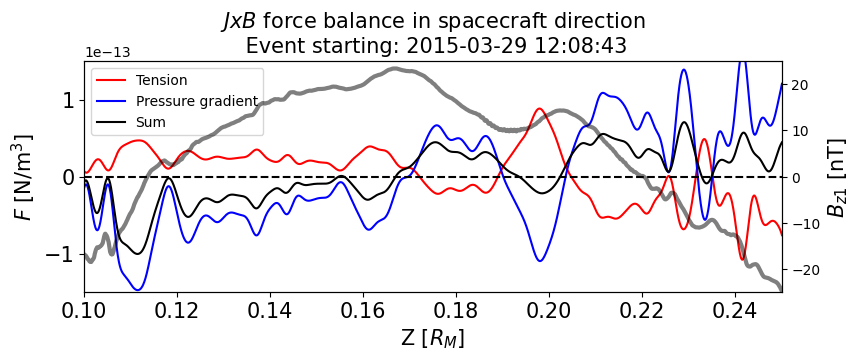

In [550]:
# Show force balance along spacecraft trajectory
#INPUT
time_average = 1*20 # how many time steps to average over (20 timesteps per sec * num of seconds)
DR_event = 27 #[22,27,46,51]

# Declare our figure
fig, ax = plt.subplots(nrows=1,figsize=(9,3))

# Find the data for this event
indices = np.where(df_cs['cs_pass']==DR_event)[0]

# Unpack the data
X = df_cs['X'][indices]
Y = df_cs['Y'][indices]
Z = df_cs['Z'][indices]
B_x = uniform_filter1d(df_cs['B_x'][indices],size = time_average)
B_y = uniform_filter1d(df_cs['B_y'][indices],size = time_average)
B_z = uniform_filter1d(df_cs['B_z'][indices],size = time_average)
B_xdip = calc_B_xdip(X,Y,Z)
B_ydip = calc_B_ydip(X,Y,Z)
B_zdip = calc_B_zdip(X,Y,Z)
B_mag = np.sqrt(B_x**2+B_y**2+B_z**2)

# Compute differences
dX = np.insert(np.diff(X),0,np.diff(X)[0])
dY = np.insert(np.diff(Y),0,np.diff(Y)[0])
dZ = np.insert(np.diff(Z),0,np.diff(Z)[0])
dB_x = np.insert(np.diff(B_x),0,np.diff(B_x)[0]) # insert 0 at the front to fill the gap
dB_y = np.insert(np.diff(B_y),0,np.diff(B_y)[0])
dB_z = np.insert(np.diff(B_z),0,np.diff(B_z)[0])
dB2 = np.insert(np.diff(B_mag**2),0,np.diff(B_mag**2)[0])

# Fix the tiny dY using a mask to remove values where dY is very small
mask = np.abs(dY)<1e-2

# Compute tension subcomponents
Cx1 = B_x*dB_x/dX
Cx2 = B_y*dB_x/dY
Cx3 = B_z*dB_x/dZ
Cy1 = B_x*dB_y/dX
Cy2 = B_y*dB_y/dY
Cy3 = B_z*dB_y/dZ
Cz1 = B_x*dB_z/dX
Cz2 = B_y*dB_z/dY
Cz3 = B_z*dB_z/dZ

# Replace nans of all terms with 1/dY with 0
Cx2[mask] = 0
Cy2[mask] = 0
Cz2[mask] = 0

# Compute tension components, convert to SI (B in nT, dX in 1/km)
T_x = 1/mu_0 * (Cx1+Cx2+Cx3) * (1e-9)**2 * 1e-3
T_y = 1/mu_0 * (Cy1+Cy2+Cy3) * (1e-9)**2 * 1e-3
T_z = 1/mu_0 * (Cz1+Cz2+Cz3) * (1e-9)**2 * 1e-3

# Compute pressure gradient, convert to SI
P_grad_x = -dB2 / dX / (2*mu_0) * (1e-9)**2 * (1e-3)
P_grad_y = -dB2 / dY / (2*mu_0) * (1e-9)**2 * (1e-3)
P_grad_z = -dB2 / dZ / (2*mu_0) * (1e-9)**2 * (1e-3)

P_grad_y[mask] = 0

# Project into spacecraft motion vector
T_tot = gaussian_filter1d((T_x*dX+T_y*dY+T_z*dZ)/np.sqrt(dX**2+dY**2+dZ**2), sigma = time_average)
P_tot = gaussian_filter1d((P_grad_x*dX+P_grad_y*dY+P_grad_z*dZ)/np.sqrt(dX**2+dY**2+dZ**2), sigma = time_average)


# Show averages
ax.plot(Z/R_M, T_tot, label = 'Tension',color='red')
ax.plot(Z/R_M, P_tot, label = 'Pressure gradient',color='blue')
ax.plot(Z/R_M, T_tot+P_tot, label = 'Sum',color='black')

ax2 = ax.twinx()
ax2.plot(Z/R_M,B_z-B_zdip,color='black',lw=3,alpha=0.5)

# 


# Clean up axes
# Trim slightly to remove edges
ax.set_xlim(0.1,0.25)
ax.set_ylim(-1.5e-13,1.5e-13)
ax2.set_ylim(-25,25)

# Add 0 line
ax.axhline(y=0,color='black',linestyle='dashed')

# Add labels
ax.set_xlabel("Z [$R_M$]",fontsize=15)
ax.set_ylabel("$F$ [N/m$^3$]",fontsize=15)
ax2.set_ylabel("$B_{z1}$ [nT]", fontsize=15)

# Set font size
ax.tick_params(axis='both',labelsize=15)

# Set title
ax.set_title(str("$JxB$ force balance in spacecraft direction\n Event starting: "+str(df_cs['timestamp'][indices[0]])[:-7]),fontsize=15)

ax.legend()
fig.savefig(str('DR_'+str(DR_event)+'_force_balance.png'),bbox_inches='tight', dpi=300)
plt.show()

NameError: name 'wavelet_coef' is not defined

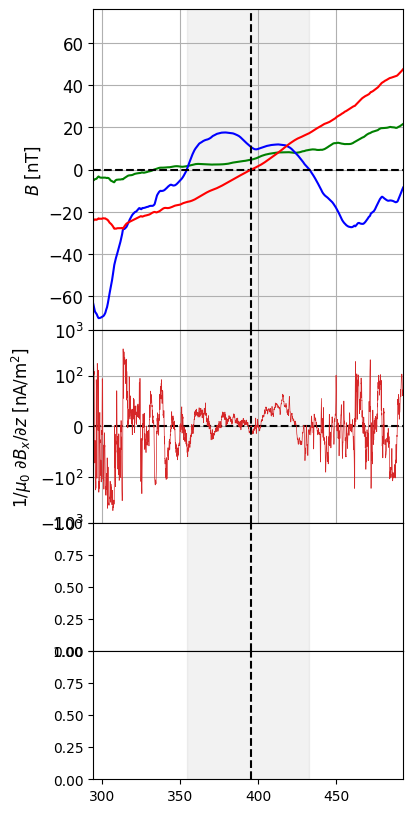

In [23]:
# Overview plots for paper
#INPUT
time_average = 10*20 # how many time steps to average over (20 timesteps per sec * num of seconds)
DR_event = 22#[22,27,46,48,51]

# First, compute average By for the orbits before and after
B_y_data = []

# Declare our figure
#fig, axs = plt.subplots(ncols=1, nrows=3,figsize=(12,15))

# Iterate through each pass
for event in np.unique(df_cs['cs_pass'])[DR_event-5:DR_event+5]:
    indices = np.where(df_cs['cs_pass']==event)[0]

    # Unpack data
    Z = df_cs['Z'][indices].to_numpy()
    t = df_cs['TIME_TAG'][indices].to_numpy()
    t = t - t[0]
    B_y = uniform_filter1d(df_cs['B_y'][indices],size = time_average)

    # Save an entry for Z and Bz1 for each pass
    B_y_data.append([t, B_y])
    #axs[0].plot(t, B_y, color='black')

# Compute terms for the dr event chosen
indices = np.where(df_cs['cs_pass']==DR_event)[0]

# Unpack the data
X = df_cs['X'][indices].to_numpy() #[km]
Y = df_cs['Y'][indices].to_numpy()
Z = df_cs['Z'][indices].to_numpy()
timestamp = df_cs['timestamp'][indices].to_numpy()
t = df_cs['TIME_TAG'][indices].to_numpy()
t = t - t[0]
B_x = uniform_filter1d(df_cs['B_x'][indices],size = time_average) #[nT]
B_y = uniform_filter1d(df_cs['B_y'][indices],size = time_average)
B_z = uniform_filter1d(df_cs['B_z'][indices],size = time_average)
B_xdip = calc_B_xdip(X,Y,Z)
B_ydip = calc_B_ydip(X,Y,Z)
B_zdip = calc_B_zdip(X,Y,Z)
B_mag = np.sqrt(B_x**2+B_y**2+B_z**2)

# Compute dipole-difference terms
B_x1 = B_x - B_xdip
B_y1 = B_y - B_ydip
B_z1 = B_z - B_zdip

# Compute differences
dX = np.insert(np.diff(X),0,np.diff(X)[0]) #np.gradient(dX)
dY = np.insert(np.diff(Y),0,np.diff(Y)[0]) #np.gradient(dY)
dZ = np.insert(np.diff(Z),0,np.diff(Z)[0]) #np.gradient(dZ)
dB_x = np.insert(np.diff(B_x),0,np.diff(B_x)[0]) # insert 0 at the front to fill the gap
dB_y = np.insert(np.diff(B_y),0,np.diff(B_y)[0])
dB_z = np.insert(np.diff(B_z),0,np.diff(B_z)[0])
dB2 = np.insert(np.diff(B_mag**2),0,np.diff(B_mag**2)[0])

# Fix the tiny dY using a mask to remove values where dY is very small
mask = np.abs(dY)<1e-2

# Compute tension subcomponents
Cx1 = B_x*dB_x/dX
Cx2 = B_y*dB_x/dY
Cx3 = B_z*dB_x/dZ
Cy1 = B_x*dB_y/dX
Cy2 = B_y*dB_y/dY
Cy3 = B_z*dB_y/dZ
Cz1 = B_x*dB_z/dX
Cz2 = B_y*dB_z/dY
Cz3 = B_z*dB_z/dZ

# Replace nans of all terms with 1/dY with 0
Cx2[mask] = 0
Cy2[mask] = 0
Cz2[mask] = 0

# Compute tension components, convert to SI (B in nT, dX in 1/km)
T_x = 1/mu_0 * (Cx1+Cx2+Cx3) * (1e-9)**2 * 1e-3
T_y = 1/mu_0 * (Cy1+Cy2+Cy3) * (1e-9)**2 * 1e-3
T_z = 1/mu_0 * (Cz1+Cz2+Cz3) * (1e-9)**2 * 1e-3

# Compute pressure gradient, convert to SI
P_grad_x = -dB2 / dX / (2*mu_0) * (1e-9)**2 * (1e-3)
P_grad_y = -dB2 / dY / (2*mu_0) * (1e-9)**2 * (1e-3)
P_grad_z = -dB2 / dZ / (2*mu_0) * (1e-9)**2 * (1e-3)

P_grad_y[mask] = 0

# Project into spacecraft motion vector
T_tot = uniform_filter1d((T_x*dX + T_y*dY + T_z*dZ)/np.sqrt(dX**2+dY**2+dZ**2), size = time_average)
P_tot = uniform_filter1d((P_grad_x*dX+P_grad_y*dY+P_grad_z*dZ)/np.sqrt(dX**2+dY**2+dZ**2), size = time_average)

# Compute Jy terms
J_ydX = (-1/mu_0)*np.gradient(B_z,X) * 1e-9 * 1e-3 
J_ydZ = (1/mu_0)*np.gradient(B_x,Z) * 1e-9 * 1e-3 
J_ydipdX = (-1/mu_0)*np.gradient(B_zdip,X) * 1e-9 * 1e-3 #- dB_z1/dX
J_ydipdZ = (1/mu_0)*np.gradient(B_xdip,Z) * 1e-9 * 1e-3 #- dB_z1/dX

# Weight terms based on our direction of motion
J_y = (J_ydX*dX + J_ydZ*dZ)/np.sqrt(dX**2+dZ**2)
J_ydip = (J_ydipdX*dX + J_ydipdZ*dZ)/np.sqrt(dX**2+dZ**2)
J_y_smooth = uniform_filter1d(J_y, size = time_average)
J_ydip_smooth = uniform_filter1d(J_ydip, size = time_average)

# Use interpolation to average over all events neighbouring the DR
t_common, B_y_average, B_y_std = average_datasets_with_std(B_y_data, x_common = t)

# Declare our figure
fig, axs = plt.subplots(ncols=1, nrows=4,figsize=(4,10), sharex=True, height_ratios=[5,3,2,2])

# Remove space between 
plt.subplots_adjust(hspace=0)

# Plot magnetic field components
#axs[0].plot(t, B_x, c = 'red', label='$B_x$')
axs[0].plot(t, B_y, c = 'green', label = '$\delta B_y$')
axs[0].plot(t, B_z1, c = 'blue', label = '$B_{z1}$')
axs[0].axhline(y=0, c = 'black', linestyle = 'dashed')

# Tidy up axs[0]
axs[0].grid('on')

# Show B_x on separate axis if it's too different
if DR_event in [48]:
    #axs0_1 = axs[0].twinx()
    #axs0_1.plot(t, B_x, c = 'red', label='$B_x$')
    #axs0_1.set_ylabel("$B_x$ [nT]", fontsize = 12, color='red')
    #axs0_1.tick_params(axis='both',labelsize=12)
    #axs0_1.tick_params(axis='y',color='red')
    #axs0_1.set_ylim(0,325)
    #axs[0].plot([-1e5,-1e5], [-1e5,-1e5], c = 'red', label='$B_x$')
    print("not showing Bx")
else:
    axs[0].plot(t, B_x, c = 'red', label='$B_x$')
axs[0].set_ylim(-76,76)
axs[0].set_ylabel("$B$ [nT]", fontsize = 12)
#axs[0].legend(loc = 'lower right', fontsize = 12, ncol=3)
axs[0].tick_params(axis='both',labelsize=12)

# Show force balance and Jy in second panel
#axs[1].plot(t, T_tot*1e12, label = '$T_{mag}$',color='tab:blue')
#axs[1].plot(t, P_tot*1e12, label = '$-grad(p_{mag})$',color='tab:orange')
#axs[1].plot(t, (T_tot+P_tot)*1e12, label = 'Total',color='black')
axs[1].axhline(y=0, c = 'black', linestyle = 'dashed')
#axs[1].plot(0,1e10, color = 'tab:green', label = '$J_y$')
#axs1_2 = axs[1].twinx()
#axs1_2.plot(t, (J_y_smooth-J_ydip_smooth)*1e9, color = 'tab:green')
#axs[1].plot(t, (J_ydX-J_ydipdX)*1e9, color = 'tab:blue', label='$∂B_z/∂x$')
axs[1].plot(t, (J_ydZ-J_ydipdZ)*1e9, color = 'tab:red', label='$∂B_x/∂z$',alpha = 1,lw=0.5)
#axs[1].plot(t, gaussian_filter1d((J_ydZ-J_ydipdZ)*1e9, sigma=time_average), color = 'tab:red', linestyle='dashed')
#axs[1].plot(t, (J_y_smooth-J_ydip_smooth)*1e9, color = 'black', label = 'weighted sum')
#axs1_2.plot(t, J_ydip_smooth*1e9, color = 'tab:green', linestyle = 'dashed')

# Tidy up axs[1]
axs[1].grid('on')
#axs[1].set_ylim(-0.4,0.4)
axs[1].set_ylim(-1e3,1e3)
#axs1_2.set_ylim(-500,500)
#axs[1].set_ylabel("Force [pN/m$^3$]", fontsize = 12)
#axs1_2.set_ylabel("Current density [nA/m$^2$]", fontsize = 12)
axs[1].set_ylabel("$1/ \mu _0$ $∂B_x/∂z$ [nA/m$^2$]", fontsize = 12)
axs[1].set_yscale('symlog', linthresh=1e2,linscale=1e0)
#axs[1].legend(loc = 'lower right', fontsize = 12, ncol=4)
axs[1].tick_params(axis='both',labelsize=12)
#axs1_2.tick_params(axis='both',labelsize=12)

# Denote start / end of DF:
if DR_event in [47,48,60]:
    t_start_guess = 200
    t_stop_guess = 700 
elif DR_event in [28,44]:
    t_start_guess = 100
    t_stop_guess = 600 
else:
    t_start_guess = 200 # when after this time does Bz1>0
    t_stop_guess = 500 # when before this time does Bz1<0

# Find the index of start/stop
i_start = np.where((B_z1 > 0) & (t > t_start_guess))[0][0]
i_stop = np.where((B_z1 > 0) & (t < t_stop_guess))[0][-1]

# Highlight DR region
for ax in axs:
    ax.axvspan(t[i_start],t[i_stop],color='black',alpha = 0.05)

# Guess lower bound for cs crossing time
t_cs_start_guess = 100

# Find index of cs crossing
i_cs = np.where((B_x > 0) & (t > t_cs_start_guess))[0][0]

# Show cs crossing
for ax in axs:
    ax.axvline(t[i_cs],color='black', linestyle='dashed')

# Set time range
total_plot_time = 120 + (t[i_stop] - t[i_start]) # Total length of time to plot
t_before = 60 * 1 # How much time before DR starts to show
i_plot_start = np.where(t > t[i_start]-t_before)[0][0]
i_plot_stop = np.where(t < t[i_start]-t_before+total_plot_time)[0][-1]
for ax in axs:
    ax.set_xlim(t[i_plot_start], t[i_plot_stop])

############## COMPUTE WAVE CHARACTERISTICS #############

# SET PLOTTING THRESHOLD
_psd_threshold = 0.5e-1#1e0

# Relabel data
mag_ut = df_cs["timestamp"][indices]
mag_t = df_cs["TIME_TAG"][indices] - df_cs["TIME_TAG"][indices[0]]
mag_bx = df_cs["B_x"][indices]
mag_by = df_cs["B_y"][indices]
mag_bz = df_cs["B_z"][indices]
mag_bt = mag_bt = np.sqrt(mag_bx**2+mag_by**2+mag_bz**2)
mag_bz1 = mag_bz - calc_B_zdip(df_cs["X"][indices],df_cs["Y"][indices],df_cs["Z"][indices])

#start_ut = np.datetime64('2015-03-29T12:12:00')
#end_ut = np.datetime64('2015-03-29T12:16:00')

# Convert from np index to pd index for start/stop times
start_idx = np.searchsorted(mag_ut, timestamp[0])
end_idx = np.searchsorted(mag_ut, timestamp[-1])


B = 6.0
C = 1.0
wavelet = 'cmor%.1f-%.1f' % (B, C)

scales_1 = np.arange(1,20)*10
scales_1 = np.power(2,np.linspace(1,7,100))

sig_t = np.copy(mag_t[start_idx:end_idx])
sig_ut = np.copy(mag_ut[start_idx:end_idx])
sig_bx = np.copy(mag_bx[start_idx:end_idx])
sig_by = np.copy(mag_by[start_idx:end_idx])
sig_bz = np.copy(mag_bz[start_idx:end_idx])
sig_bt = np.copy(mag_bt[start_idx:end_idx])
sig_bz1 = np.copy(mag_bz1[start_idx:end_idx])

import scipy.signal
sos = scipy.signal.butter(10, 0.1, 'hp', fs=20, output='sos')

filtered_sig_bx = scipy.signal.sosfiltfilt(sos, sig_bx)
filtered_sig_by = scipy.signal.sosfiltfilt(sos, sig_by)
filtered_sig_bz = scipy.signal.sosfiltfilt(sos, sig_bz)
filtered_sig_bt = scipy.signal.sosfiltfilt(sos, sig_bt)

_, frequencies, coef_bx = wavelet_coef(sig_ut, sig_bx, scales_1, B, C)
_, _, coef_by = wavelet_coef(sig_ut, sig_by, scales_1, B, C)
_, _, coef_bz = wavelet_coef(sig_ut, sig_bz, scales_1, B, C)
_, _, coef_bt = wavelet_coef(sig_ut, sig_bt, scales_1, B, C)

_, _, psd_bx = wavelet_psd(sig_ut, sig_bx, scales_1, B, C)
_, _, psd_by = wavelet_psd(sig_ut, sig_by, scales_1, B, C)
_, _, psd_bz = wavelet_psd(sig_ut, sig_bz, scales_1, B, C)
_, _, psd_bt = wavelet_psd(sig_ut, sig_bt, scales_1, B, C)


compressibility = (psd_bt) / (psd_bx + psd_by + psd_bz)

psd = psd_bx + psd_by + psd_bz

pc2 = axs[2].pcolormesh(sig_t, frequencies, np.log10(psd), cmap='jet', shading='auto', vmax = 1.0, vmin = -3)

axs[2].grid('on')
axs[2].set_yscale('log')
axs[2].set_ylim(0.2, 5.0)


planarity, ellipticity, coherence, vh = svd_analysis(np.array([coef_bx, coef_by, coef_bz]).transpose(1, 2, 0), frequency_window = 5, time_window = 5)

magf_direction = (np.array([sig_bx, sig_by, sig_bz]) / sig_bt).T
wna = np.rad2deg(np.arccos(np.abs(np.sum(magf_direction * vh[:, :, 2, :], axis = -1))))

#_psd_threshold = 1e-1#1e0
_mask_idx = np.where(psd < _psd_threshold)
compressibility[_mask_idx] = np.nan
ellipticity[_mask_idx] = np.nan
planarity[_mask_idx] = np.nan

# Be Cautious with the calculation of coherence and WNA, I haven't debugged it yet
# Both of them should be very senstive to the smoothing window size (frequency_window and time_window)
# It is suggested to adjust the window size and compare the result from MVA

coherence[_mask_idx] = np.nan
wna[_mask_idx] = np.nan


pc3 = axs[3].pcolormesh(sig_t, frequencies, compressibility, cmap='jet', vmax = 1.0, vmin = 0)
axs[3].grid('on')
axs[3].set_yscale('log')
axs[3].set_ylim(0.2, 5.0)

# Add colorbars
cbar_ax2 = fig.add_axes(
    [axs[2].get_position().x1 + 0.01, axs[2].get_position().y0 + 0.01, 0.02, axs[2].get_position().y1 - axs[2].get_position().y0 - 0.02])
cbar2 = fig.colorbar(pc2, cax=cbar_ax2)
# cbar2.set_label('$\mathrm{log_{10}(PSD)}$\n($\mathrm{nT^2/Hz}$)')
cbar2.ax.tick_params(which='major', length=4, direction='in', pad=3)
cbar2.set_label("PSD", rotation=90,fontsize = 12)

cbar_ax3 = fig.add_axes(
    [axs[3].get_position().x1 + 0.01, axs[3].get_position().y0 + 0.01, 0.02, axs[3].get_position().y1 - axs[3].get_position().y0 - 0.02])
cbar3 = fig.colorbar(pc3, cax=cbar_ax3)
# cbar3.set_label('Compre\n-ssibility')
cbar3.ax.tick_params(which='major', length=4, direction='in', pad=3)
cbar3.set_label("Compressibility", rotation=90,fontsize = 12)

# Add axes labels
axs[2].set_ylabel("Freq. [Hz]",fontsize=12)
axs[3].set_ylabel("Freq. [Hz]",fontsize=12)

############

# Fix Horizontal axis ticks:
# Find nearest minute to start time
# Timestamp is always 29 characters long, so we can use a string method:
tick_indices = []#[i_plot_start]
tick_positions = []#[t[i_plot_start]]
tick_labels = []#["HH:MM:SS   \n$X_{MSM}$ [$R_M$]   \n$Y_{MSM}$ [$R_M$]   \n$Z_{MSM}$ [$R_M$]   "]

for i in np.arange(i_plot_start,i_plot_stop):
    if str(timestamp[i])[-12:-7] == '00.04' or str(timestamp[i])[-12:-7] == '00.03' or str(timestamp[i])[-12:-7] == '00.02' or str(timestamp[i])[-12:-7] == '00.01' or str(timestamp[i])[-12:-7] == '00.00':
        tick_indices.append(i)
        tick_positions.append(t[i])
        tick_labels.append(str(str(timestamp[i])[11:-10]+'\n'+str(round(X[i]/R_M,3))+'\n'+str(round(Y[i]/R_M,3))+'\n'+str(round(Z[i]/R_M-0.2,3))))

# Show major ticks
axs[3].set_xticks(tick_positions, tick_labels, fontsize=12)

# Show minor ticks
minor_ticks = np.arange(t[tick_indices[1]-20*60], np.max(t), 15)
minor_locator = FixedLocator(minor_ticks)
axs[3].xaxis.set_minor_locator(minor_locator)

# Set title:
axs[0].set_title(str("DR#5, starting: "+str(timestamp[i_plot_start])[:10]+' '+str(timestamp[i_plot_start])[11:-10]),fontsize=12)

fig.savefig(str('DR_'+str(DR_event)+'_overview.png'),bbox_inches='tight', dpi=300)
plt.show()
#print(f'Common x: {x_common}')
#print(f'Average z: {z_average}')


DR start: 2015-03-27T18:44:56.091000000 DR stop: 2015-03-27T18:46:56.091000000


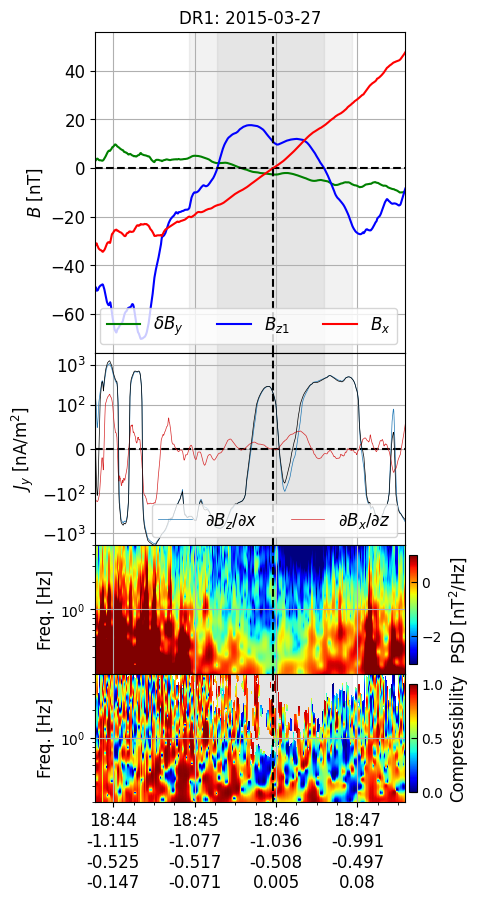

In [44]:
# Overview plots for paper, using wavelet code v2
#INPUT
time_average = 10*20 # how many time steps to average over (20 timesteps per sec * num of seconds)
DR_event = 22#[22,27,46,48,51]

psd_threshold = 1e-2

show_legend = True
DR_title_number = '1'

# First, compute average By for the orbits before and after
B_y_data = []

# Declare our figure
#fig, axs = plt.subplots(ncols=1, nrows=3,figsize=(12,15))

# Iterate through each pass
for event in np.unique(df_cs['cs_pass'])[DR_event-5:DR_event+5]:
    indices = np.where(df_cs['cs_pass']==event)[0]

    # Unpack data
    Z = df_cs['Z'][indices].to_numpy()
    t = df_cs['TIME_TAG'][indices].to_numpy()
    t = t - t[0]
    B_y = uniform_filter1d(df_cs['B_y'][indices],size = time_average)

    # Save an entry for Z and Bz1 for each pass
    B_y_data.append([t, B_y])
    #axs[0].plot(t, B_y, color='black')

# Compute terms for the dr event chosen
indices = np.where(df_cs['cs_pass']==DR_event)[0]

# Unpack the data
X = df_cs['X'][indices].to_numpy() #[km]
Y = df_cs['Y'][indices].to_numpy()
Z = df_cs['Z'][indices].to_numpy()
timestamp = df_cs['timestamp'][indices].to_numpy()
t = df_cs['TIME_TAG'][indices].to_numpy()
t = t - t[0]
B_x = uniform_filter1d(df_cs['B_x'][indices],size = time_average) #[nT]
B_y = uniform_filter1d(df_cs['B_y'][indices],size = time_average)
B_z = uniform_filter1d(df_cs['B_z'][indices],size = time_average)
B_xdip = calc_B_xdip(X,Y,Z)
B_ydip = calc_B_ydip(X,Y,Z)
B_zdip = calc_B_zdip(X,Y,Z)
B_mag = np.sqrt(B_x**2+B_y**2+B_z**2)
B_magdip = np.sqrt(B_xdip**2+B_ydip**2+B_zdip**2)

# Compute dipole-difference terms
B_x1 = B_x - B_xdip
B_y1 = B_y - B_ydip
B_z1 = B_z - B_zdip

# Compute differences
dX = np.insert(np.diff(X),0,np.diff(X)[0]) #np.gradient(dX)
dY = np.insert(np.diff(Y),0,np.diff(Y)[0]) #np.gradient(dY)
dZ = np.insert(np.diff(Z),0,np.diff(Z)[0]) #np.gradient(dZ)
dB_x = np.insert(np.diff(B_x),0,np.diff(B_x)[0]) # insert 0 at the front to fill the gap
dB_y = np.insert(np.diff(B_y),0,np.diff(B_y)[0])
dB_z = np.insert(np.diff(B_z),0,np.diff(B_z)[0])
dB2 = np.insert(np.diff(B_mag**2),0,np.diff(B_mag**2)[0])

# Fix the tiny dY using a mask to remove values where dY is very small
mask = np.abs(dY)<1e-2

# Compute tension subcomponents
Cx1 = B_x*dB_x/dX
Cx2 = B_y*dB_x/dY
Cx3 = B_z*dB_x/dZ
Cy1 = B_x*dB_y/dX
Cy2 = B_y*dB_y/dY
Cy3 = B_z*dB_y/dZ
Cz1 = B_x*dB_z/dX
Cz2 = B_y*dB_z/dY
Cz3 = B_z*dB_z/dZ

# Replace nans of all terms with 1/dY with 0
Cx2[mask] = 0
Cy2[mask] = 0
Cz2[mask] = 0

# Compute tension components, convert to SI (B in nT, dX in 1/km)
T_x = 1/mu_0 * (Cx1+Cx2+Cx3) * (1e-9)**2 * 1e-3
T_y = 1/mu_0 * (Cy1+Cy2+Cy3) * (1e-9)**2 * 1e-3
T_z = 1/mu_0 * (Cz1+Cz2+Cz3) * (1e-9)**2 * 1e-3

# Compute pressure gradient, convert to SI
P_grad_x = -dB2 / dX / (2*mu_0) * (1e-9)**2 * (1e-3)
P_grad_y = -dB2 / dY / (2*mu_0) * (1e-9)**2 * (1e-3)
P_grad_z = -dB2 / dZ / (2*mu_0) * (1e-9)**2 * (1e-3)

P_grad_y[mask] = 0

# Project into spacecraft motion vector
T_tot = uniform_filter1d((T_x*dX + T_y*dY + T_z*dZ)/np.sqrt(dX**2+dY**2+dZ**2), size = time_average)
P_tot = uniform_filter1d((P_grad_x*dX+P_grad_y*dY+P_grad_z*dZ)/np.sqrt(dX**2+dY**2+dZ**2), size = time_average)

# Compute Jy terms
J_ydX = (-1/mu_0)*np.gradient(B_z,X) * 1e-9 * 1e-3 
J_ydZ = (1/mu_0)*np.gradient(B_x,Z) * 1e-9 * 1e-3 
J_ydipdX = (-1/mu_0)*np.gradient(B_zdip,X) * 1e-9 * 1e-3 #- dB_z1/dX
J_ydipdZ = (1/mu_0)*np.gradient(B_xdip,Z) * 1e-9 * 1e-3 #- dB_z1/dX

# Weight terms based on our direction of motion
J_y = (J_ydX*dX + J_ydZ*dZ)/np.sqrt(dX**2+dZ**2)
J_ydip = (J_ydipdX*dX + J_ydipdZ*dZ)/np.sqrt(dX**2+dZ**2)
J_y_smooth = uniform_filter1d(J_y, size = time_average)
J_ydip_smooth = uniform_filter1d(J_ydip, size = time_average)

# Use interpolation to average over all events neighbouring the DR
t_common, B_y_average, B_y_std = average_datasets_with_std(B_y_data, x_common = t)

# Declare our figure
fig, axs = plt.subplots(ncols=1, nrows=4,figsize=(4,10), sharex=True, height_ratios=[5,3,2,2])

# Remove space between 
plt.subplots_adjust(hspace=0)

# Plot magnetic field components
#axs[0].plot(t, B_x, c = 'red', label='$B_x$')
axs[0].plot(t, B_y - B_y_average, c = 'green', label = '$\delta B_y$')
axs[0].plot(t, B_z1, c = 'blue', label = '$B_{z1}$')
axs[0].axhline(y=0, c = 'black', linestyle = 'dashed')

# Tidy up axs[0]
axs[0].grid('on')

# Show B_x on separate axis if it's too different
if DR_event in [48]:
    #axs0_1 = axs[0].twinx()
    #axs0_1.plot(t, B_x, c = 'red', label='$B_x$')
    #axs0_1.set_ylabel("$B_x$ [nT]", fontsize = 12, color='red')
    #axs0_1.tick_params(axis='both',labelsize=12)
    #axs0_1.tick_params(axis='y',color='red')
    #axs0_1.set_ylim(0,325)
    #axs[0].plot([-1e5,-1e5], [-1e5,-1e5], c = 'red', label='$B_x$')
    print("not showing Bx")
else:
    axs[0].plot(t, B_x, c = 'red', label='$B_x$')
axs[0].set_ylim(-76,56)
axs[0].set_ylabel("$B$ [nT]", fontsize = 12)
if show_legend:
    axs[0].legend(loc = 'lower right', fontsize = 12, ncol=3)
axs[0].tick_params(axis='both',labelsize=12)

# Show force balance and Jy in second panel
#axs[1].plot(t, T_tot*1e12, label = '$T_{mag}$',color='tab:blue')
#axs[1].plot(t, P_tot*1e12, label = '$-grad(p_{mag})$',color='tab:orange')
#axs[1].plot(t, (T_tot+P_tot)*1e12, label = 'Total',color='black')
axs[1].axhline(y=0, c = 'black', linestyle = 'dashed')
#axs[1].plot(0,1e10, color = 'tab:green', label = '$J_y$')
#axs1_2 = axs[1].twinx()
#axs1_2.plot(t, (J_y_smooth-J_ydip_smooth)*1e9, color = 'tab:green')
axs[1].plot(t, uniform_filter1d((J_ydX-J_ydipdX)*1e9,size = time_average), color = 'tab:blue', label='$∂B_z/∂x$',lw=0.5)
axs[1].plot(t, uniform_filter1d((J_ydZ-J_ydipdZ)*1e9,size = time_average), color = 'tab:red', label='$∂B_x/∂z$',lw=0.5)
axs[1].plot(t, uniform_filter1d((J_ydX-J_ydipdX)*1e9+(J_ydZ-J_ydipdZ)*1e9,size = time_average), color = 'black',alpha = 1,lw=0.5)
#axs[1].plot(t, gaussian_filter1d((J_ydZ-J_ydipdZ)*1e9, sigma=time_average), color = 'tab:red', linestyle='dashed')
#axs[1].plot(t, (J_y_smooth-J_ydip_smooth)*1e9, color = 'black', label = 'weighted sum')
#axs1_2.plot(t, J_ydip_smooth*1e9, color = 'tab:green', linestyle = 'dashed')

# Tidy up axs[1]
axs[1].grid('on')
#axs[1].set_ylim(-0.4,0.4)
axs[1].set_ylim(-2e3,2e3)
#axs1_2.set_ylim(-500,500)
#axs[1].set_ylabel("Force [pN/m$^3$]", fontsize = 12)
#axs1_2.set_ylabel("Current density [nA/m$^2$]", fontsize = 12)
axs[1].set_ylabel("$J_y$ [nA/m$^2$]", fontsize = 12)
axs[1].set_yscale('symlog', linthresh=1e2,linscale=1e0)
axs[1].tick_params(axis='both',labelsize=12)
if show_legend:
    axs[1].legend(loc = 'lower right', fontsize = 12, ncol=2)
#axs1_2.tick_params(axis='both',labelsize=12)

# Denote start / end of DF:
if DR_event in [47,48,60]:
    t_start_guess = 200
    t_stop_guess = 700 
elif DR_event in [28,44]:
    t_start_guess = 100
    t_stop_guess = 600 
else:
    t_start_guess = 200 # when after this time does Bz1>0
    t_stop_guess = 500 # when before this time does Bz1<0

# Find the index of start/stop
i_start = np.where((B_z1 > 0) & (t > t_start_guess))[0][0]
i_stop = np.where((B_z1 > 0) & (t < t_stop_guess))[0][-1]

# Highlight DR region
i_middle = int((i_stop + i_start) / 2)
for ax in axs:
    ax.axvspan(t[i_start],t[i_stop],color='black',alpha = 0.05) # Bz1>0 region
    ax.axvspan(t[i_middle - 60*20],t[i_middle + 60*20],color='black',alpha = 0.05) # FIPS sampling time
    ax.axvline(t[i_cs],color='black', linestyle='dashed') # equator crossing
print("DR start:",timestamp[i_middle - 60*20],"DR stop:",timestamp[i_middle + 60*20])

# Guess lower bound for cs crossing time
t_cs_start_guess = 100

# Find index of cs crossing
i_cs = np.where((B_x > 0) & (t > t_cs_start_guess))[0][0]


# Set time range
total_plot_time = 150 + (t[i_stop] - t[i_start]) # Total length of time to plot
t_before = 60 * 1.5 # How much time before DR starts to show
i_plot_start = np.where(t > t[i_start]-t_before)[0][0]
i_plot_stop = np.where(t < t[i_start]-t_before+total_plot_time)[0][-1]
for ax in axs:
    ax.set_xlim(t[i_plot_start], t[i_plot_stop])

############## COMPUTE WAVE CHARACTERISTICS #############

# Relabel data
mag_ut = df_cs["timestamp"][indices]
mag_t = df_cs["TIME_TAG"][indices] - df_cs["TIME_TAG"][indices[0]]
mag_bx = df_cs["B_x"][indices]
mag_by = df_cs["B_y"][indices]
mag_bz = df_cs["B_z"][indices]
mag_bt = mag_bt = np.sqrt(mag_bx**2+mag_by**2+mag_bz**2)
mag_bz1 = mag_bz - calc_B_zdip(df_cs["X"][indices],df_cs["Y"][indices],df_cs["Z"][indices])

#start_ut = np.datetime64('2015-03-29T12:12:00')
#end_ut = np.datetime64('2015-03-29T12:16:00')

# Convert from np index to pd index for start/stop times
start_idx = np.searchsorted(mag_ut, timestamp[0])
end_idx = np.searchsorted(mag_ut, timestamp[-1])


sig_t = np.copy(mag_t[start_idx:end_idx])
sig_ut = np.copy(mag_ut[start_idx:end_idx])
sig_bx = np.copy(mag_bx[start_idx:end_idx])
sig_by = np.copy(mag_by[start_idx:end_idx])
sig_bz = np.copy(mag_bz[start_idx:end_idx])
sig_bt = np.copy(mag_bt[start_idx:end_idx])
sig_bz1 = np.copy(mag_bz1[start_idx:end_idx])

sig_ut = np.copy(mag_ut[start_idx:end_idx])
sig_bx = np.copy(mag_bx[start_idx:end_idx])
sig_by = np.copy(mag_by[start_idx:end_idx])
sig_bz = np.copy(mag_bz[start_idx:end_idx])
sig_bt = np.copy(mag_bt[start_idx:end_idx])
sig_bz1 = np.copy(mag_bz1[start_idx:end_idx])

import scipy.signal
sos = scipy.signal.butter(10, 0.1, 'hp', fs=20, output='sos')

filtered_sig_bx = scipy.signal.sosfiltfilt(sos, sig_bx)
filtered_sig_by = scipy.signal.sosfiltfilt(sos, sig_by)
filtered_sig_bz = scipy.signal.sosfiltfilt(sos, sig_bz)
filtered_sig_bt = scipy.signal.sosfiltfilt(sos, sig_bt)

use_wavelet = True

if use_wavelet:
    bandwidth = 6.0
    # log-scale
    scales = np.power(2, np.linspace(1, 7, 1000))
    # linear-scale (for comparing with the windowed FFT)
    #scales = np.arange(2, 400)
    downsample = 1 # For comparing with the windowed FFT with a step of 50
    freq_window = 3
    time_window = 7
    downsample_signal = False # Downsample the signal before computing wavelet coefficients (True) or Downsample the coefficients after computing (False)

    time, frequency, coef_bx, psd_bx, avg_bx = wavelet_coef_psd(sig_ut, sig_bx, scales, bandwidth, downsample = downsample, downsample_signal = downsample_signal)
    _, _, coef_by, psd_by, avg_by = wavelet_coef_psd(sig_ut, sig_by, scales, bandwidth, downsample = downsample, downsample_signal = downsample_signal)
    _, _, coef_bz, psd_bz, avg_bz = wavelet_coef_psd(sig_ut, sig_bz, scales, bandwidth, downsample = downsample, downsample_signal = downsample_signal)
    _, _, coef_bt, psd_bt, avg_bt = wavelet_coef_psd(sig_ut, sig_bt, scales, bandwidth, downsample = downsample, downsample_signal = downsample_signal)
    coi = (np.sqrt(2) * bandwidth / (2 * np.pi) / frequency).astype(float)
    if isinstance(sig_ut[0], np.datetime64):
        coi = (1e9 * coi).astype('timedelta64[ns]')

else: # Use windowed FFT
    step = 1
    window = 400
    
    freq_window = 3
    time_window = 7

    time, frequency, coef_bx, psd_bx, avg_bx = wfft_coef_psd(sig_ut, sig_bx, step = step, window = window)
    _, _, coef_by, psd_by, avg_by = wfft_coef_psd(sig_ut, sig_by, step = step, window = window)
    _, _, coef_bz, psd_bz, avg_bz = wfft_coef_psd(sig_ut, sig_bz, step = step, window = window)
    _, _, coef_bt, psd_bt, _ = wfft_coef_psd(sig_ut, sig_bt, step = step, window = window)
    

coef = np.array([coef_bx, coef_by, coef_bz]).transpose(1, 2, 0)
avg = np.array([avg_bx, avg_by, avg_bz]).T
magf_direction = ((avg.T) / np.linalg.norm(avg, axis = 1)).T

psd = (psd_bx + psd_by + psd_bz)

compressibility = (psd_bt) / psd

compressibility, ellipticity_along_b = fac_wave_analysis(coef, magf_direction)

_mask_idx = np.where(psd < psd_threshold)
compressibility[_mask_idx] = np.nan
ellipticity_along_b[_mask_idx] = np.nan

# Convert to time [s] for plotting
ts = np.array((time-time[0])/1e9,dtype = 'float')

pc2 = axs[2].pcolormesh(ts, frequency, np.log10(psd), cmap='jet', shading='auto', vmax = 1.0, vmin = -3)

axs[2].grid('on')
axs[2].set_yscale('log')
axs[2].set_ylim(0.2, 5.0)


pc3 = axs[3].pcolormesh(ts, frequency, compressibility, cmap='jet', vmax = 1.0, vmin = 0)
axs[3].grid('on')
axs[3].set_yscale('log')
axs[3].set_ylim(0.2, 5.0)

#pc4 = axs[4].pcolormesh(ts, frequency, ellipticity_along_b, cmap='coolwarm', vmax = 1.0, vmin = -1.0)
#axs[4].grid('on')
#axs[4].set_yscale('log')
#axs[4].set_ylim(0.2, 5.0)

# Add colorbars
cbar_ax2 = fig.add_axes(
    [axs[2].get_position().x1 + 0.01, axs[2].get_position().y0 + 0.01, 0.02, axs[2].get_position().y1 - axs[2].get_position().y0 - 0.02])
cbar2 = fig.colorbar(pc2, cax=cbar_ax2)
# cbar2.set_label('$\mathrm{log_{10}(PSD)}$\n($\mathrm{nT^2/Hz}$)')
cbar2.ax.tick_params(which='major', length=4, direction='in', pad=3)
cbar2.set_label("PSD [nT$^2$/Hz]", rotation=90,fontsize = 12)

cbar_ax3 = fig.add_axes(
    [axs[3].get_position().x1 + 0.01, axs[3].get_position().y0 + 0.01, 0.02, axs[3].get_position().y1 - axs[3].get_position().y0 - 0.02])
cbar3 = fig.colorbar(pc3, cax=cbar_ax3)
# cbar3.set_label('Compre\n-ssibility')
cbar3.ax.tick_params(which='major', length=4, direction='in', pad=3)
cbar3.set_label("Compressibility", rotation=90,fontsize = 12)

#cbar_ax4 = fig.add_axes(
#    [axs[4].get_position().x1 + 0.01, axs[4].get_position().y0 + 0.01, 0.02, axs[4].get_position().y1 - axs[4].get_position().y0 - 0.02])
#cbar4 = fig.colorbar(pc4, cax=cbar_ax4)
## cbar3.set_label('Compre\n-ssibility')
#cbar4.ax.tick_params(which='major', length=4, direction='in', pad=3)
#cbar4.set_label("Ellipticity", rotation=90,fontsize = 12)

# Add axes labels
axs[2].set_ylabel("Freq. [Hz]",fontsize=12)
axs[3].set_ylabel("Freq. [Hz]",fontsize=12)
#axs[4].set_ylabel("Freq. [Hz]",fontsize=12)

############

# Fix Horizontal axis ticks:
# Find nearest minute to start time
# Timestamp is always 29 characters long, so we can use a string method:
tick_indices = []#[i_plot_start]
tick_positions = []#[t[i_plot_start]]
tick_labels = []#["HH:MM:SS   \n$X_{MSM}$ [$R_M$]   \n$Y_{MSM}$ [$R_M$]   \n$Z_{MSM}$ [$R_M$]   "]

for i in np.arange(i_plot_start,i_plot_stop):
    if str(timestamp[i])[-12:-7] == '00.04' or str(timestamp[i])[-12:-7] == '00.03' or str(timestamp[i])[-12:-7] == '00.02' or str(timestamp[i])[-12:-7] == '00.01' or str(timestamp[i])[-12:-7] == '00.00':
        tick_indices.append(i)
        tick_positions.append(t[i])
        tick_labels.append(str(str(timestamp[i])[11:-13]+'\n'+str(round(X[i]/R_M,3))+'\n'+str(round(Y[i]/R_M,3))+'\n'+str(round(Z[i]/R_M-0.2,3))))

# Show major ticks
axs[3].set_xticks(tick_positions, tick_labels, fontsize=12)

# Show minor ticks
minor_ticks = np.arange(t[tick_indices[1]-20*60], np.max(t), 15)
minor_locator = FixedLocator(minor_ticks)
axs[3].xaxis.set_minor_locator(minor_locator)

# Set title:
axs[0].set_title(str("DR"+DR_title_number+": "+str(timestamp[i_plot_start])[:10]),fontsize=12)

fig.savefig(str('DR_'+str(DR_event)+'_overview.png'),bbox_inches='tight', dpi=300)
plt.show()
#print(f'Common x: {x_common}')
#print(f'Average z: {z_average}')


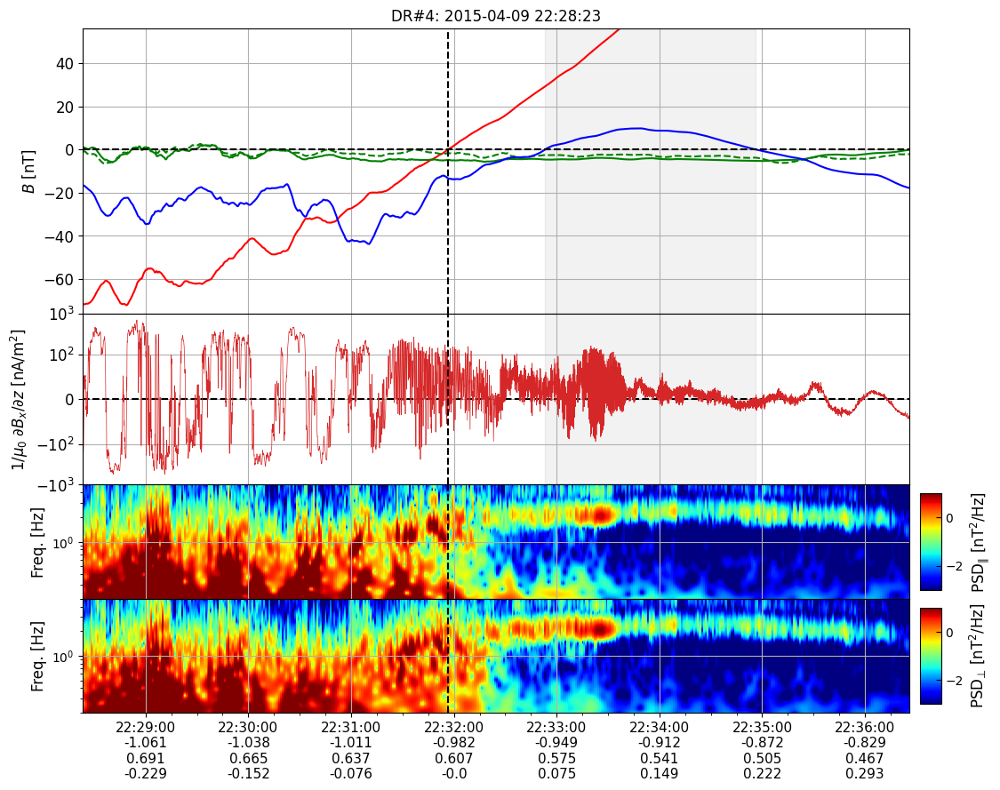

In [191]:
# Overview plots for paper, using wavelet code v2, showing delta b_para and delta B_perp
#INPUT
time_average = 10*20 # how many time steps to average over (20 timesteps per sec * num of seconds)
DR_event = 60#[22,27,46,48,51]


# First, compute average By for the orbits before and after
B_y_data = []

# Declare our figure
#fig, axs = plt.subplots(ncols=1, nrows=3,figsize=(12,15))

# Iterate through each pass
for event in np.unique(df_cs['cs_pass'])[DR_event-3:DR_event+3]:
    indices = np.where(df_cs['cs_pass']==event)[0]

    # Unpack data
    Z = df_cs['Z'][indices].to_numpy()
    t = df_cs['TIME_TAG'][indices].to_numpy()
    t = t - t[0]
    B_y = uniform_filter1d(df_cs['B_y'][indices],size = time_average)

    # Save an entry for Z and Bz1 for each pass
    B_y_data.append([t, B_y])
    #axs[0].plot(t, B_y, color='black')

# Compute terms for the dr event chosen
indices = np.where(df_cs['cs_pass']==DR_event)[0]

# Unpack the data
X = df_cs['X'][indices].to_numpy() #[km]
Y = df_cs['Y'][indices].to_numpy()
Z = df_cs['Z'][indices].to_numpy()
timestamp = df_cs['timestamp'][indices].to_numpy()
t = df_cs['TIME_TAG'][indices].to_numpy()
t = t - t[0]
B_x = uniform_filter1d(df_cs['B_x'][indices],size = time_average) #[nT]
B_y = uniform_filter1d(df_cs['B_y'][indices],size = time_average)
B_z = uniform_filter1d(df_cs['B_z'][indices],size = time_average)
B_xdip = calc_B_xdip(X,Y,Z)
B_ydip = calc_B_ydip(X,Y,Z)
B_zdip = calc_B_zdip(X,Y,Z)
B_mag = np.sqrt(B_x**2+B_y**2+B_z**2)
B_magdip = np.sqrt(B_xdip**2+B_ydip**2+B_zdip**2)

# Compute dipole-difference terms
B_x1 = B_x - B_xdip
B_y1 = B_y - B_ydip
B_z1 = B_z - B_zdip

# Compute differences
dX = np.insert(np.diff(X),0,np.diff(X)[0]) #np.gradient(dX)
dY = np.insert(np.diff(Y),0,np.diff(Y)[0]) #np.gradient(dY)
dZ = np.insert(np.diff(Z),0,np.diff(Z)[0]) #np.gradient(dZ)
dB_x = np.insert(np.diff(B_x),0,np.diff(B_x)[0]) # insert 0 at the front to fill the gap
dB_y = np.insert(np.diff(B_y),0,np.diff(B_y)[0])
dB_z = np.insert(np.diff(B_z),0,np.diff(B_z)[0])
dB2 = np.insert(np.diff(B_mag**2),0,np.diff(B_mag**2)[0])

# Fix the tiny dY using a mask to remove values where dY is very small
mask = np.abs(dY)<1e-2

# Compute tension subcomponents
Cx1 = B_x*dB_x/dX
Cx2 = B_y*dB_x/dY
Cx3 = B_z*dB_x/dZ
Cy1 = B_x*dB_y/dX
Cy2 = B_y*dB_y/dY
Cy3 = B_z*dB_y/dZ
Cz1 = B_x*dB_z/dX
Cz2 = B_y*dB_z/dY
Cz3 = B_z*dB_z/dZ

# Replace nans of all terms with 1/dY with 0
Cx2[mask] = 0
Cy2[mask] = 0
Cz2[mask] = 0

# Compute tension components, convert to SI (B in nT, dX in 1/km)
T_x = 1/mu_0 * (Cx1+Cx2+Cx3) * (1e-9)**2 * 1e-3
T_y = 1/mu_0 * (Cy1+Cy2+Cy3) * (1e-9)**2 * 1e-3
T_z = 1/mu_0 * (Cz1+Cz2+Cz3) * (1e-9)**2 * 1e-3

# Compute pressure gradient, convert to SI
P_grad_x = -dB2 / dX / (2*mu_0) * (1e-9)**2 * (1e-3)
P_grad_y = -dB2 / dY / (2*mu_0) * (1e-9)**2 * (1e-3)
P_grad_z = -dB2 / dZ / (2*mu_0) * (1e-9)**2 * (1e-3)

P_grad_y[mask] = 0

# Project into spacecraft motion vector
T_tot = uniform_filter1d((T_x*dX + T_y*dY + T_z*dZ)/np.sqrt(dX**2+dY**2+dZ**2), size = time_average)
P_tot = uniform_filter1d((P_grad_x*dX+P_grad_y*dY+P_grad_z*dZ)/np.sqrt(dX**2+dY**2+dZ**2), size = time_average)

# Compute Jy terms
J_ydX = (-1/mu_0)*np.gradient(B_z,X) * 1e-9 * 1e-3 
J_ydZ = (1/mu_0)*np.gradient(B_x,Z) * 1e-9 * 1e-3 
J_ydipdX = (-1/mu_0)*np.gradient(B_zdip,X) * 1e-9 * 1e-3 #- dB_z1/dX
J_ydipdZ = (1/mu_0)*np.gradient(B_xdip,Z) * 1e-9 * 1e-3 #- dB_z1/dX

# Weight terms based on our direction of motion [NOT USED]
J_y = (J_ydX*dX + J_ydZ*dZ)/np.sqrt(dX**2+dZ**2)
J_ydip = (J_ydipdX*dX + J_ydipdZ*dZ)/np.sqrt(dX**2+dZ**2)
J_y_smooth = uniform_filter1d(J_y, size = time_average)
J_ydip_smooth = uniform_filter1d(J_ydip, size = time_average)

# Estimated tailward pressure gradient
dp_dx = (J_ydZ-J_ydipdZ) * (B_mag*1e-9)**2 / (B_z*1e-9) * 1e9 * R_M * 1e3 # nPa/R_M

# Use interpolation to average over all events neighbouring the DR
t_common, B_y_average, B_y_std = average_datasets_with_std(B_y_data, x_common = t)

# Declare our figure
fig, axs = plt.subplots(ncols=1, nrows=4,figsize=(12,10), sharex=True, height_ratios=[5,3,2,2])

# Remove space between 
plt.subplots_adjust(hspace=0)

# Plot magnetic field components

# Show B_x on separate axis if it's too different
if DR_event in [48]:
    #axs0_1 = axs[0].twinx()
    #axs0_1.plot(t, B_x, c = 'red', label='$B_x$')
    #axs0_1.set_ylabel("$B_x$ [nT]", fontsize = 12, color='red')
    #axs0_1.tick_params(axis='both',labelsize=12)
    #axs0_1.tick_params(axis='y',color='red')
    #axs0_1.set_ylim(0,325)
    #axs[0].plot([-1e5,-1e5], [-1e5,-1e5], c = 'red', label='$B_x$')
    print("not showing Bx")
else:
    axs[0].plot(t, B_x, c = 'red', label='$B_x$')

axs[0].plot(t, B_y1, c = 'green', label = '$B_{y1}$')
axs[0].plot(t, B_y - B_y_average, c = 'green', linestyle = 'dashed', label = '$B_{y1}$')
axs[0].plot(t, B_z1, c = 'blue', label = '$B_{z1}$')
axs[0].axhline(y=0, c = 'black', linestyle = 'dashed')

# Tidy up axs[0]
axs[0].grid('on')
axs[0].set_ylim(-76,56)
axs[0].set_ylabel("$B$ [nT]", fontsize = 12)
#axs[0].legend(loc = 'lower right', fontsize = 12, ncol=3)
axs[0].tick_params(axis='both',labelsize=12)

# Show Jy and dp_dx in second panel
axs[1].axhline(y=0, c = 'black', linestyle = 'dashed')
axs[1].plot(t, (J_ydZ-J_ydipdZ)*1e9, color = 'tab:red', label='$∂B_x/∂z$',alpha = 1,lw=0.5)
#axs1_2 = axs[1].twinx()
#axs1_2.plot(t, dp_dx, color='tab:blue', label = '$∂p/∂x$', alpha = 1, lw = 0.5)


# Tidy up axs[1]
axs[1].grid('on')
#axs[1].set_ylim(-0.4,0.4)
axs[1].set_ylim(-1e3,1e3)
#axs1_2.set_ylim(-10,10)
#axs[1].set_ylabel("Force [pN/m$^3$]", fontsize = 12)
#axs1_2.set_ylabel("Current density [nA/m$^2$]", fontsize = 12)
axs[1].set_ylabel("$1/ \mu _0$ $∂B_x/∂z$ [nA/m$^2$]", fontsize = 12)
axs[1].set_yscale('symlog', linthresh=1e2,linscale=1e0)
#axs[1].legend(loc = 'lower right', fontsize = 12, ncol=4)
axs[1].tick_params(axis='both',labelsize=12)
#axs1_2.tick_params(axis='both',labelsize=12)

# Denote start / end of DF:
if DR_event in [47,48,60]:
    t_start_guess = 200
    t_stop_guess = 700 
elif DR_event in [28,44]:
    t_start_guess = 100
    t_stop_guess = 600 
else:
    t_start_guess = 200 # when after this time does Bz1>0
    t_stop_guess = 500 # when before this time does Bz1<0

# Find the index of start/stop
i_start = np.where((B_z1 > 0) & (t > t_start_guess))[0][0]
i_stop = np.where((B_z1 > 0) & (t < t_stop_guess))[0][-1]

# Highlight DR region
for ax in axs:
    ax.axvspan(t[i_start],t[i_stop],color='black',alpha = 0.05)

# Guess lower bound for cs crossing time
t_cs_start_guess = 100

# Find index of cs crossing
i_cs = np.where((B_x > 0) & (t > t_cs_start_guess))[0][0]

# Show cs crossing
for ax in axs:
    ax.axvline(t[i_cs],color='black', linestyle='dashed')

# Set time range
total_plot_time = 360 + (t[i_stop] - t[i_start]) # Total length of time to plot
t_before = 60 * 4.5 # How much time before DR starts to show
i_plot_start = np.where(t > t[i_start]-t_before)[0][0]
i_plot_stop = np.where(t < t[i_start]-t_before+total_plot_time)[0][-1]
for ax in axs:
    ax.set_xlim(t[i_plot_start], t[i_plot_stop])

############## COMPUTE WAVE CHARACTERISTICS #############

# Relabel data
mag_ut = df_cs["timestamp"][indices]
mag_t = df_cs["TIME_TAG"][indices] - df_cs["TIME_TAG"][indices[0]]
mag_bx = df_cs["B_x"][indices]
mag_by = df_cs["B_y"][indices]
mag_bz = df_cs["B_z"][indices]
mag_bt = mag_bt = np.sqrt(mag_bx**2+mag_by**2+mag_bz**2)
mag_bz1 = mag_bz - calc_B_zdip(df_cs["X"][indices],df_cs["Y"][indices],df_cs["Z"][indices])

#start_ut = np.datetime64('2015-03-29T12:12:00')
#end_ut = np.datetime64('2015-03-29T12:16:00')

# Convert from np index to pd index for start/stop times
start_idx = np.searchsorted(mag_ut, timestamp[0])
end_idx = np.searchsorted(mag_ut, timestamp[-1])


sig_t = np.copy(mag_t[start_idx:end_idx])
sig_ut = np.copy(mag_ut[start_idx:end_idx])
sig_bx = np.copy(mag_bx[start_idx:end_idx])
sig_by = np.copy(mag_by[start_idx:end_idx])
sig_bz = np.copy(mag_bz[start_idx:end_idx])
sig_bt = np.copy(mag_bt[start_idx:end_idx])
sig_bz1 = np.copy(mag_bz1[start_idx:end_idx])

sig_ut = np.copy(mag_ut[start_idx:end_idx])
sig_bx = np.copy(mag_bx[start_idx:end_idx])
sig_by = np.copy(mag_by[start_idx:end_idx])
sig_bz = np.copy(mag_bz[start_idx:end_idx])
sig_bt = np.copy(mag_bt[start_idx:end_idx])
sig_bz1 = np.copy(mag_bz1[start_idx:end_idx])

import scipy.signal
sos = scipy.signal.butter(10, 0.1, 'hp', fs=20, output='sos')

filtered_sig_bx = scipy.signal.sosfiltfilt(sos, sig_bx)
filtered_sig_by = scipy.signal.sosfiltfilt(sos, sig_by)
filtered_sig_bz = scipy.signal.sosfiltfilt(sos, sig_bz)
filtered_sig_bt = scipy.signal.sosfiltfilt(sos, sig_bt)

use_wavelet = True

if use_wavelet:
    bandwidth = 6.0
    # log-scale
    scales = np.power(2, np.linspace(1, 7, 1000))
    # linear-scale (for comparing with the windowed FFT)
    #scales = np.arange(2, 400)
    downsample = 1 # For comparing with the windowed FFT with a step of 50
    freq_window = 3
    time_window = 7
    downsample_signal = False # Downsample the signal before computing wavelet coefficients (True) or Downsample the coefficients after computing (False)

    time, frequency, coef_bx, psd_bx, avg_bx = wavelet_coef_psd(sig_ut, sig_bx, scales, bandwidth, downsample = downsample, downsample_signal = downsample_signal)
    _, _, coef_by, psd_by, avg_by = wavelet_coef_psd(sig_ut, sig_by, scales, bandwidth, downsample = downsample, downsample_signal = downsample_signal)
    _, _, coef_bz, psd_bz, avg_bz = wavelet_coef_psd(sig_ut, sig_bz, scales, bandwidth, downsample = downsample, downsample_signal = downsample_signal)
    _, _, coef_bt, psd_bt, avg_bt = wavelet_coef_psd(sig_ut, sig_bt, scales, bandwidth, downsample = downsample, downsample_signal = downsample_signal)
    coi = (np.sqrt(2) * bandwidth / (2 * np.pi) / frequency).astype(float)
    if isinstance(sig_ut[0], np.datetime64):
        coi = (1e9 * coi).astype('timedelta64[ns]')

else: # Use windowed FFT
    step = 1
    window = 400
    
    freq_window = 3
    time_window = 7

    time, frequency, coef_bx, psd_bx, avg_bx = wfft_coef_psd(sig_ut, sig_bx, step = step, window = window)
    _, _, coef_by, psd_by, avg_by = wfft_coef_psd(sig_ut, sig_by, step = step, window = window)
    _, _, coef_bz, psd_bz, avg_bz = wfft_coef_psd(sig_ut, sig_bz, step = step, window = window)
    _, _, coef_bt, psd_bt, _ = wfft_coef_psd(sig_ut, sig_bt, step = step, window = window)
    

coef = np.array([coef_bx, coef_by, coef_bz]).transpose(1, 2, 0)
avg = np.array([avg_bx, avg_by, avg_bz]).T
magf_direction = ((avg.T) / np.linalg.norm(avg, axis = 1)).T

psd = (psd_bx + psd_by + psd_bz)

psd_bpara =  psd_bx*np.abs(magf_direction[:,0]) + psd_by*np.abs(magf_direction[:,1]) + psd_bz*np.abs(magf_direction[:,2])
psd_bperp = psd - psd_bpara

# Convert to time [s] for plotting
ts = np.array((time-time[0])/1e9,dtype = 'float')

pc2 = axs[2].pcolormesh(ts, frequency, np.log10(psd_bpara), cmap='jet', shading='auto', vmax = 1.0, vmin = -3)

axs[2].grid('on')
axs[2].set_yscale('log')
axs[2].set_ylim(0.2, 5.0)


pc3 = axs[3].pcolormesh(ts, frequency, np.log10(psd_bperp), cmap='jet', shading='auto', vmax = 1.0, vmin = -3)

axs[3].grid('on')
axs[3].set_yscale('log')
axs[3].set_ylim(0.2, 5.0)

# Add colorbars
cbar_ax2 = fig.add_axes(
    [axs[2].get_position().x1 + 0.01, axs[2].get_position().y0 + 0.01, 0.02, axs[2].get_position().y1 - axs[2].get_position().y0 - 0.02])
cbar2 = fig.colorbar(pc2, cax=cbar_ax2)
# cbar2.set_label('$\mathrm{log_{10}(PSD)}$\n($\mathrm{nT^2/Hz}$)')
cbar2.ax.tick_params(which='major', length=4, direction='in', pad=3)
cbar2.set_label("PSD$_∥$ [nT$^2$/Hz]", rotation=90,fontsize = 12)

cbar_ax3 = fig.add_axes(
    [axs[3].get_position().x1 + 0.01, axs[3].get_position().y0 + 0.01, 0.02, axs[3].get_position().y1 - axs[3].get_position().y0 - 0.02])
cbar3 = fig.colorbar(pc3, cax=cbar_ax3)
# cbar3.set_label('Compre\n-ssibility')
cbar3.ax.tick_params(which='major', length=4, direction='in', pad=3)
cbar3.set_label("PSD$_⊥$ [nT$^2$/Hz]", rotation=90,fontsize = 12)

# Add axes labels
axs[2].set_ylabel("Freq. [Hz]",fontsize=12)
axs[3].set_ylabel("Freq. [Hz]",fontsize=12)

############

# Fix Horizontal axis ticks:
# Find nearest minute to start time
# Timestamp is always 29 characters long, so we can use a string method:
tick_indices = []#[i_plot_start]
tick_positions = []#[t[i_plot_start]]
tick_labels = []#["HH:MM:SS   \n$X_{MSM}$ [$R_M$]   \n$Y_{MSM}$ [$R_M$]   \n$Z_{MSM}$ [$R_M$]   "]

for i in np.arange(i_plot_start,i_plot_stop):
    if str(timestamp[i])[-12:-7] == '00.04' or str(timestamp[i])[-12:-7] == '00.03' or str(timestamp[i])[-12:-7] == '00.02' or str(timestamp[i])[-12:-7] == '00.01' or str(timestamp[i])[-12:-7] == '00.00':
        tick_indices.append(i)
        tick_positions.append(t[i])
        tick_labels.append(str(str(timestamp[i])[11:-10]+'\n'+str(round(X[i]/R_M,3))+'\n'+str(round(Y[i]/R_M,3))+'\n'+str(round(Z[i]/R_M-0.2,3))))

# Show major ticks
axs[3].set_xticks(tick_positions, tick_labels, fontsize=11)

# Show minor ticks
minor_ticks = np.arange(t[tick_indices[1]-20*60], np.max(t), 15)
minor_locator = FixedLocator(minor_ticks)
axs[3].xaxis.set_minor_locator(minor_locator)

# Set title:
axs[0].set_title(str("DR#4: "+str(timestamp[i_plot_start])[:10]+' '+str(timestamp[i_plot_start])[11:-10]),fontsize=12)

fig.savefig(str('DR_'+str(DR_event)+'_overview.png'),bbox_inches='tight', dpi=300)
plt.show()
#print(f'Common x: {x_common}')
#print(f'Average z: {z_average}')


(-50.0, 50.0)

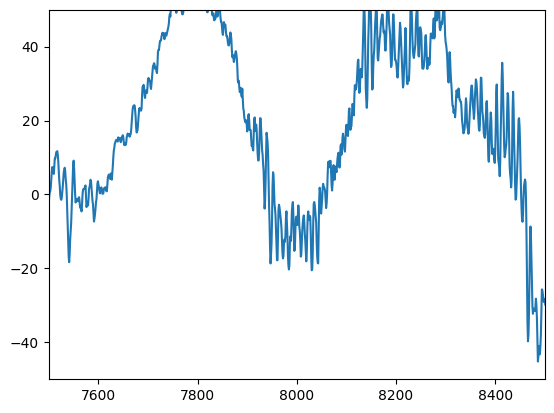

In [154]:
plt.plot((J_ydZ-J_ydipdZ)*1e9)
plt.xlim(7500,8500)
plt.ylim(-50,50)

(100.0, 150.0)

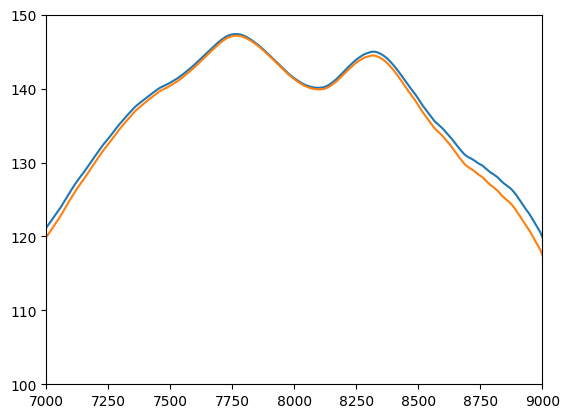

In [161]:
plt.plot(np.sqrt(B_x**2+B_y**2+B_z**2))
plt.plot(B_z)
plt.xlim(7000,9000)
plt.ylim(100,150)

(6500.0, 9000.0)

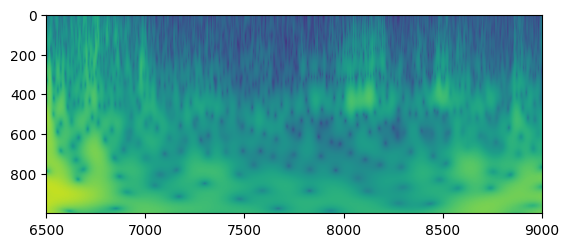

In [136]:
plt.imshow(np.log10(psd_bpara))
plt.xlim(6500,9000)

(6500.0, 9000.0)

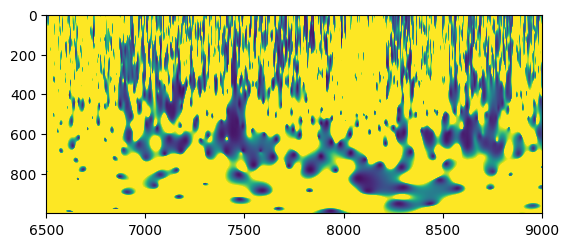

In [139]:
plt.imshow(psd_bpara / psd_bperp,vmin=0,vmax=1)
plt.xlim(6500,9000)

In [510]:
indices = np.where(df_cs['cs_pass']==22)[0]

# Unpack the data
X = df_cs['X'][indices]
Y = df_cs['Y'][indices]
Z = df_cs['Z'][indices]
B_x = df_cs['B_x'][indices]
B_y = df_cs['B_y'][indices]
B_z = df_cs['B_z'][indices]
B_xdip = calc_B_xdip(X,Y,Z)
B_ydip = calc_B_ydip(X,Y,Z)
B_zdip = calc_B_zdip(X,Y,Z)
B_mag = np.sqrt(B_x**2+B_y**2+B_z**2)
B_magdip = np.sqrt(B_xdip**2+B_ydip**2+B_zdip**2)

# Compute differences
dX = np.gradient(X)
dY = np.gradient(Y)
dZ = np.gradient(Z)
dl = np.sqrt(dX**2+dY**2+dZ**2)
dB_x = np.gradient(B_x) # insert 0 at the front to fill the gap
dB_y = np.gradient(B_y)
dB_z = np.gradient(B_z)
dB_xdip = np.gradient(B_xdip)
dB_ydip = np.gradient(B_ydip)
dB_zdip = np.gradient(B_zdip)

J_x = (1/mu_0)*(np.gradient(B_zdip,Y) - np.gradient(B_ydip,Z)) 
J_y = (1/mu_0)*(np.gradient(B_xdip,Z) - np.gradient(B_zdip,X))
J_z = (1/mu_0)*(np.gradient(B_ydip,X) - np.gradient(B_xdip,Y))

#J_mag = np.sqrt(J_x**2+J_y**2+J_z**2)
#J_para = (J_x*dX + J_y*dY + J_z*dZ)/np.sqrt(dX**2+dY**2+dZ**2)
#J_perp = np.sqrt(J_mag**2 - J_para**2)
#plt.plot(dB_zdip/dX)

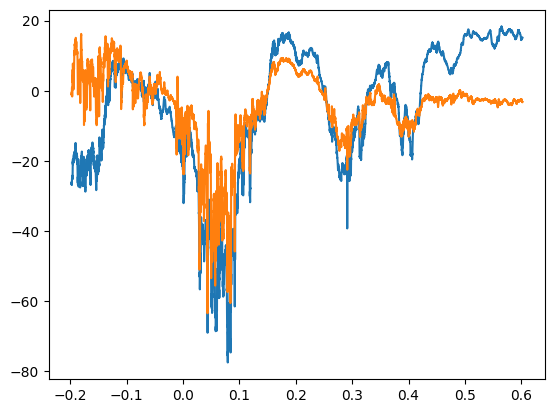

In [514]:
# First translate into spacecraft coords
B_paradip = (B_xdip*dX + B_ydip*dY + B_zdip*dZ)/dl
B_perpdip = np.sqrt(B_magdip**2 - B_paradip**2)

B_para = (B_x*dX + B_y*dY + B_z*dZ)/dl
B_perp = np.sqrt(B_mag**2 - B_para**2)

#plt.plot(Z/R_M, B_paradip, color='tab:blue', linestyle = 'dashed')
#plt.plot(Z/R_M, B_perpdip, color='tab:orange', linestyle = 'dashed')
#plt.plot(Z/R_M, B_magdip,color='black', linestyle = 'dashed')

plt.plot(Z/R_M, B_para-B_paradip, color='tab:blue')
plt.plot(Z/R_M, B_perp-B_perpdip, color='tab:orange')
#plt.plot(Z/R_M, B_mag-B_magdip,color='black')

(0.1, 0.3)

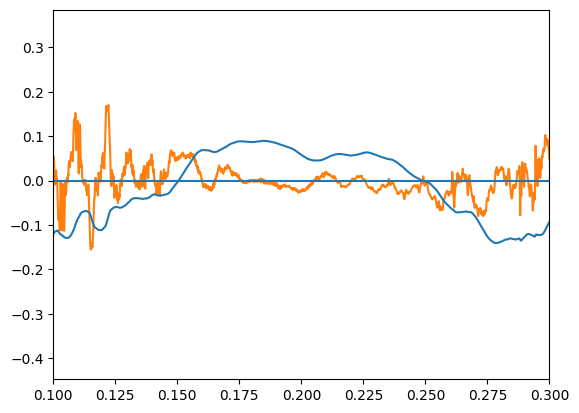

In [525]:
#plt.plot(Z/R_M, uniform_filter1d(np.gradient(B_para)-np.gradient(B_paradip),size=100), color='tab:blue')
plt.plot(Z/R_M, uniform_filter1d(np.gradient(B_perp)-np.gradient(B_perpdip),size=100), color='tab:orange')
plt.plot(Z/R_M, uniform_filter1d(B_z-B_zdip,size=100)*5e-3, color='tab:blue')
plt.axhline(y=0)
plt.xlim(0.1,0.3)

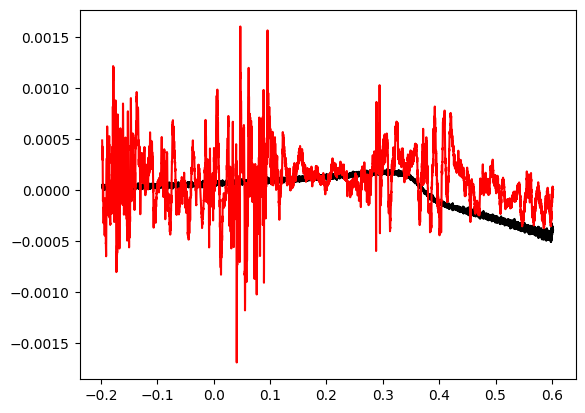

In [433]:
smoothing = 5*20
J_perpdip = (np.gradient(B_paradip)/dl - np.gradient(B_perpdip)/dl)*1e-3
J_perp = (np.gradient(B_para)/dl - np.gradient(B_perp)/dl)*1e-3
plt.plot(Z/R_M,uniform_filter1d(J_perpdip,size=smoothing), color='black')
plt.plot(Z/R_M,uniform_filter1d(J_perp,size=smoothing), color='red')

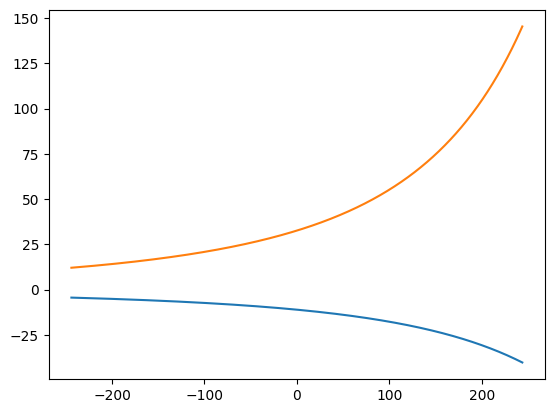

In [465]:
Z = np.linspace(-0.1,0.1,1000) * R_M
X = np.linspace(-2.5,-1.1,1000) * R_M
Y = np.zeros_like(Z)

B_xdip = calc_B_xdip(X,Y,Z)
B_ydip = calc_B_ydip(X,Y,Z)
B_zdip = calc_B_zdip(X,Y,Z)

plt.plot(Z,B_xdip)
plt.plot(Z,B_zdip)

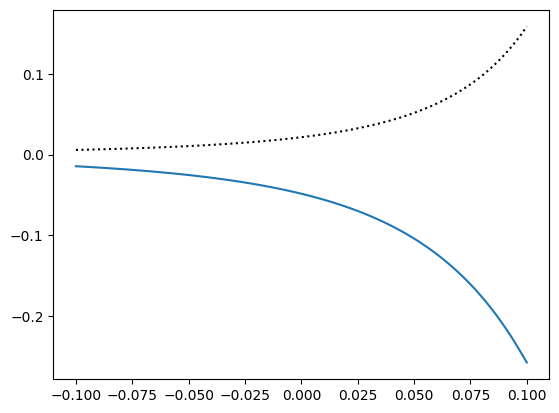

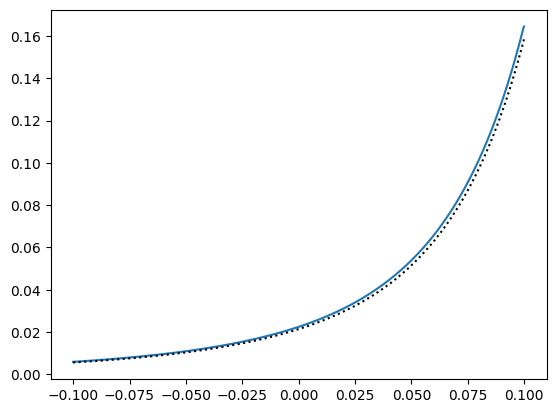

In [466]:
plt.plot(Z/R_M,np.gradient(B_xdip,Z))
R = np.sqrt((X)**2+(Y)**2+(Z - 0.2*R_M)**2)
plt.plot(Z/R_M,3*M_M*(X)*(R**-5 - 5*(Z - 0.2*R_M)**2/R**7)*R_M**3,color='black',linestyle='dotted')

plt.show()
plt.plot(Z/R_M,np.gradient(B_zdip,X))
plt.plot(Z/R_M,3*M_M*(X)*(R**-5 - 5*(Z - 0.2*R_M)**2/R**7)*R_M**3,color='black',linestyle='dotted')

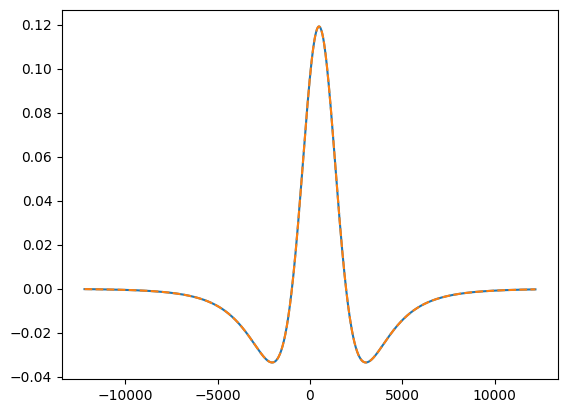

In [420]:
Z_MSO = np.linspace(-5*R_M,5*R_M,1000) #[km]
Z_MSM = Z_MSO - 0.2*R_M
X = np.zeros_like(Z) - 1.2 * R_M
Y = np.zeros_like(Z)
R = np.sqrt(X**2+Y**2+Z_MSM**2)

B_x = calc_B_xdip(X,Y,Z_MSM)#3*(M_M)*X*Z_MSM/R**5 
plt.plot(Z,np.gradient(B_x,Z))
plt.plot(Z,3*(M_M)*(X)*(R**-5 - 5*Z_MSM**2/R**7)*R_M**3,color='tab:orange',linestyle='dashed')
#plt.plot(B_x)
#plt.plot(calc_B_xdip(X,Y,Z))

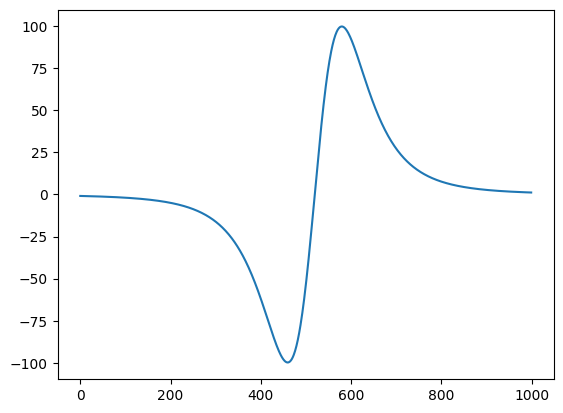

In [415]:
plt.plot(B_x)

In [426]:
def calc_B_xdip(X,Y,Z_MSM):
    # COORDINATES IN KM, AS READ IN FROM DATA
    # Z SHOULD BE IN Z_MSM = Z_MSO - 0.2*R_M
    # OUTPUT IN NT
    R = np.sqrt(X**2+Y**2+Z_MSM**2)
    return 3*M_M * X * Z_MSM/R**5 * (R_M**3)

def calc_B_ydip(X,Y,Z_MSM):
    # COORDINATES IN KM, AS READ IN FROM DATA
    # COORDINATES IN KM, AS READ IN FROM DATA
    # Z SHOULD BE IN Z_MSM = Z_MSO - 0.2*R_M
    # OUTPUT IN NT
    R = np.sqrt(X**2+Y**2+Z_MSM**2)
    return 3*M_M * Y * Z_MSM/R**5 * (R_M**3)

def calc_B_zdip(X,Y,Z_MSM):
    # COORDINATES IN KM, AS READ IN FROM DATA
    # COORDINATES IN KM, AS READ IN FROM DATA
    # Z SHOULD BE IN Z_MSM = Z_MSO - 0.2*R_M
    # OUTPUT IN NT
    R = np.sqrt(X**2+Y**2+Z_MSM**2)
    return M_M * (3*Z**2 - R**2) / R**5 * (R_M**3)

Resonance at 0.18: 75.62545682609179 amu
Resonance at 0.18: 73.66658514652173 amu


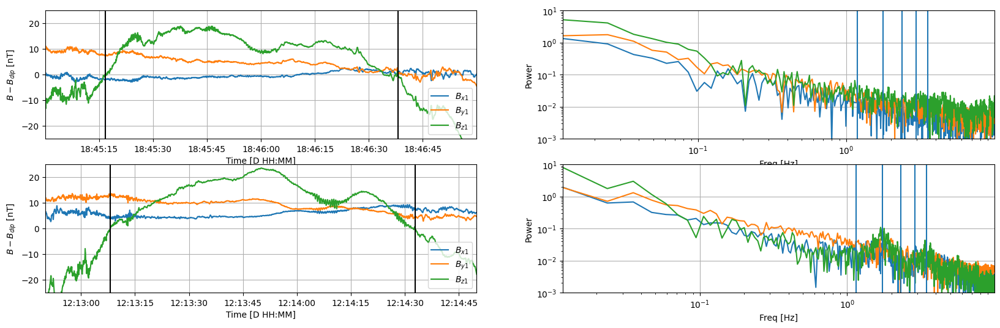

In [34]:
# WAVE ANALYSIS
# Compare all events:
# Store start/stop timestamps for CS pass

event_start_times = ["2015-03-27 18:45:00","2015-03-29 12:12:50"]#,"2015-04-05 01:57:00", "2015-04-06 19:29:50"]
event_stop_times = ["2015-03-27 18:47:00","2015-03-29 12:14:50"]#,"2015-04-05 01:59:00", "2015-04-06 19:32:50"]

# Store start/stop times for flank wave period
wave_start_times = ["2015-03-27 18:45:30","2015-03-29 12:13:20"]#,"2015-04-05 01:57:30","2015-04-06 19:31:20"]
wave_stop_times =  ["2015-03-27 18:46:30","2015-03-29 12:14:20"]#,"2015-04-05 01:58:30","2015-04-06 19:32:20"]


fig,ax = plt.subplots(nrows=len(event_start_times),ncols=2,figsize=(20,3*len(event_start_times)))
for i in range(len(event_start_times)):
    # Slice out the data
    indices = np.where((df_cs["timestamp"]>event_start_times[i]) & (df_cs["timestamp"]<event_stop_times[i]))[0]
    wave_start = np.where((df_cs["timestamp"]>event_start_times[i]) & (df_cs["B_z"]-df_cs["B_zdip"]>0))[0][0]
    wave_stop = np.where((df_cs["timestamp"]<event_stop_times[i]) & (df_cs["B_z"]-df_cs["B_zdip"]>0))[0][-1]
    Bx = df_cs["B_x"][indices].to_numpy()
    By = df_cs["B_y"][indices].to_numpy()
    Bz = df_cs["B_z"][indices].to_numpy()
    Bmag = df_cs["B_mag"][indices].to_numpy()

    # Plot the mag field data
    #start = pd.to_datetime(wave_start_times[i])
    #stop = pd.to_datetime(wave_stop_times[i])
    start = df_cs["timestamp"][wave_start]
    stop = df_cs["timestamp"][wave_stop]
    #ax[i,0].plot(df_cs["timestamp"][indices],df_cs["B_z"][indices]-df_cs["B_zdip"][indices])
    ax[i,0].plot(df_cs["timestamp"][indices],Bx-df_cs["B_xdip"][indices].to_numpy(),label='$B_{x1}$')
    ax[i,0].plot(df_cs["timestamp"][indices],By-df_cs["B_ydip"][indices].to_numpy(),label='$B_{y1}$')
    ax[i,0].plot(df_cs["timestamp"][indices],Bz-df_cs["B_zdip"][indices].to_numpy(),label='$B_{z1}$')
    #ax[i,0].plot(df_cs["timestamp"][indices],Bmag,label='Bmag')
    #ax[i,0].plot(df_cs["timestamp"][indices],df_cs["B_xdip"][indices],color='tab:blue',linestyle='dashed')
    #ax[i,0].plot(df_cs["timestamp"][indices],df_cs["B_ydip"][indices],color='tab:orange',linestyle='dashed')
    #ax[i,0].plot(df_cs["timestamp"][indices],df_cs["B_zdip"][indices],color='tab:green',linestyle='dashed')
    ax[i,0].plot([start,start],[-1000,1000],color='black')
    ax[i,0].plot([stop,stop],[-1000,1000],color='black')
    ax[i,0].grid()
    ax[i,0].set_xlabel("Time [D HH:MM]")
    ax[i,0].set_ylabel("$B-B_{dip}$ [nT]")
    ax[i,0].set_ylim(-25,25)
    ax[i,0].set_xlim(pd.to_datetime(df_cs["timestamp"][indices[0]]),pd.to_datetime(df_cs["timestamp"][indices[-1]]))
    ax[i,0].legend(loc='lower right')


    # Fourier
    Bx = df_cs["B_x"][wave_start:wave_stop].to_numpy()
    By = df_cs["B_y"][wave_start:wave_stop].to_numpy()
    Bz = df_cs["B_z"][wave_start:wave_stop].to_numpy()
    dt = df_cs["TIME_TAG"][wave_start:wave_stop].to_numpy()[1] - df_cs["TIME_TAG"][wave_start:wave_stop].to_numpy()[0]
    time = df_cs["timestamp"][wave_start:wave_stop].to_numpy()
    sec = np.linspace(0,dt*len(time),len(time))
    N = len(sec)
    freq = fftfreq(N,dt)[:N//2]
    f_x = fft(Bx-df_cs["B_xdip"][wave_start:wave_stop].to_numpy())
    f_y = fft(By-df_cs["B_ydip"][wave_start:wave_stop].to_numpy())
    f_z = fft(Bz-df_cs["B_zdip"][wave_start:wave_stop].to_numpy())
    #f_a = fft(Bmag)

    # Plot fourier
    ax[i,1].plot(freq,2.0/N * np.abs(f_x[0:N//2]))
    ax[i,1].plot(freq,2.0/N * np.abs(f_y[0:N//2]))
    ax[i,1].plot(freq,2.0/N * np.abs(f_z[0:N//2]))
    #ax[i,1].plot(freq,2.0/N * np.abs(f_a[0:N//2]))
    ax[i,1].set_ylim(0.001,10)
    ax[i,1].set_xlim(freq[1],freq[-1])
    ax[i,1].set_ylabel("Power")
    ax[i,1].set_xlabel("Freq [Hz]")
    ax[i,1].set_xscale("log")
    ax[i,1].set_yscale("log")
    ax[i,1].grid()

    # Add peaks for elements
    Bmag = np.mean(np.sqrt(Bx**2+By**2+Bz**2)*1e-9)
    Bmags = np.array([np.min(np.sqrt(Bx**2+By**2+Bz**2)*1e-9),np.mean(np.sqrt(Bx**2+By**2+Bz**2)*1e-9),np.max(np.sqrt(Bx**2+By**2+Bz**2)*1e-9)])
    H_plus = e*Bmags/(1*amu)
    He_plus = e*Bmags/(4*amu)
    O_plus = e*Bmags/(16*amu)
    Na_plus = e*Bmags/(23*amu)
    Mg_plus = e*Bmags/(24.3*amu)
    Si_plus = e*Bmags/(28*amu)
    K_plus = e*Bmags/(39*amu)
    Ca_plus = e*Bmags/(40*amu)
    Sr_plus = e*Bmags/(87*amu)
    #ax[i,1].plot([H_plus,H_plus],[0,1e5],label="$H^+$")
    #ax[i,1].plot([O_plus,O_plus],[0,1e5],label="$O^+$")
    #ax[i,1].plot([Na_plus,Na_plus],[0,1e5],label="$Na^+$")
    #ax[i,1].plot([Mg_plus,Mg_plus],[0,1e5],label="$Mg^+$")
    #ax[i,1].plot([Si_plus,Si_plus],[0,1e5],label="$Si^+$")
    #ax[i,1].plot([K_plus,K_plus],[0,1e5],label="$K^+$")
    #ax[i,1].plot([Sr_plus,Sr_plus],[0,1e5],label="$Sr^+$")

    # Plot sodium ion cyclotron harmonics
    #ax[i,1].axvspan(Na_plus[0],Na_plus[2],label="$Na^+_1$",alpha=0.5)
    #ax[i,1].axvspan(2*Na_plus[0],2*Na_plus[2],label="$Na^+_2$",alpha=0.5)
    #ax[i,1].axvspan(3*Na_plus[0],3*Na_plus[2],label="$Na^+_3$",alpha=0.5)
    #ax[i,1].axvspan(4*Na_plus[0],4*Na_plus[2],label="$Na^+_4$",alpha=0.5)
    #ax[i,1].axvspan(5*Na_plus[0],5*Na_plus[2],label="$Na^+_5$",alpha=0.5)
    #ax[i,1].axvline(Na_plus[1],label="$Na^+_1$")
    ax[i,1].axvline(Na_plus[1]*2,label="$Na^+_2$")
    ax[i,1].axvline(Na_plus[1]*3,label="$Na^+_3$")
    ax[i,1].axvline(Na_plus[1]*4,label="$Na^+_4$")
    ax[i,1].axvline(Na_plus[1]*5,label="$Na^+_5$")
    ax[i,1].axvline(Na_plus[1]*6,label="$Na^+_6$")
    
    # Plot field line standing wave; assuming rho = 1 amu/cc
    V_A = Bmag/np.sqrt(mu_0*1e6*m_p*0.3) 
    L = 1.3*R_M*1e3
    f1 = V_A / (L)
    f2 = V_A / (1/2*L)
    f3 = V_A / (1/3*L)
    f4 = V_A / (1/4*L)
    #ax[i,1].plot([f1,f1],[0,1e5],label="$f_1$")
    #ax[i,1].plot([f2,f2],[0,1e5],label="$f_2$")
    #ax[i,1].plot([f2,f3],[0,1e5],label="$f_3$")
    #ax[i,1].plot([f4,f4],[0,1e5],label="$f_4$")
#
    #ax[i,1].legend()

    print("Resonance at 0.18:",(e*Bmag/(0.18))/amu,"amu")

plt.savefig(str("fourier.png"), dpi=300, bbox_inches='tight')


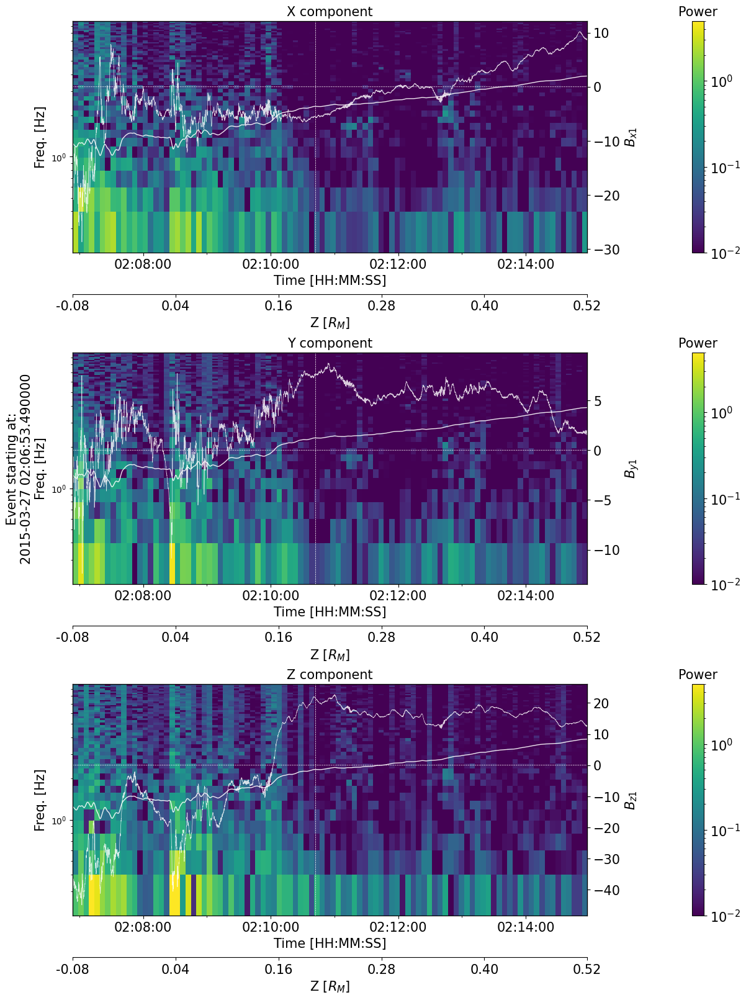

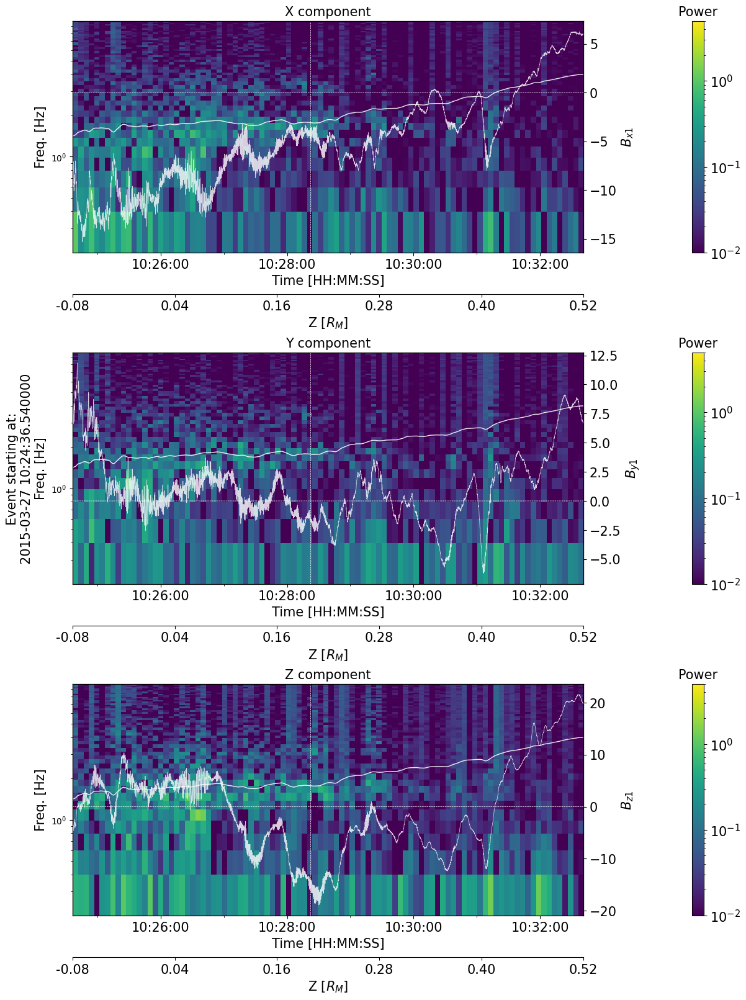

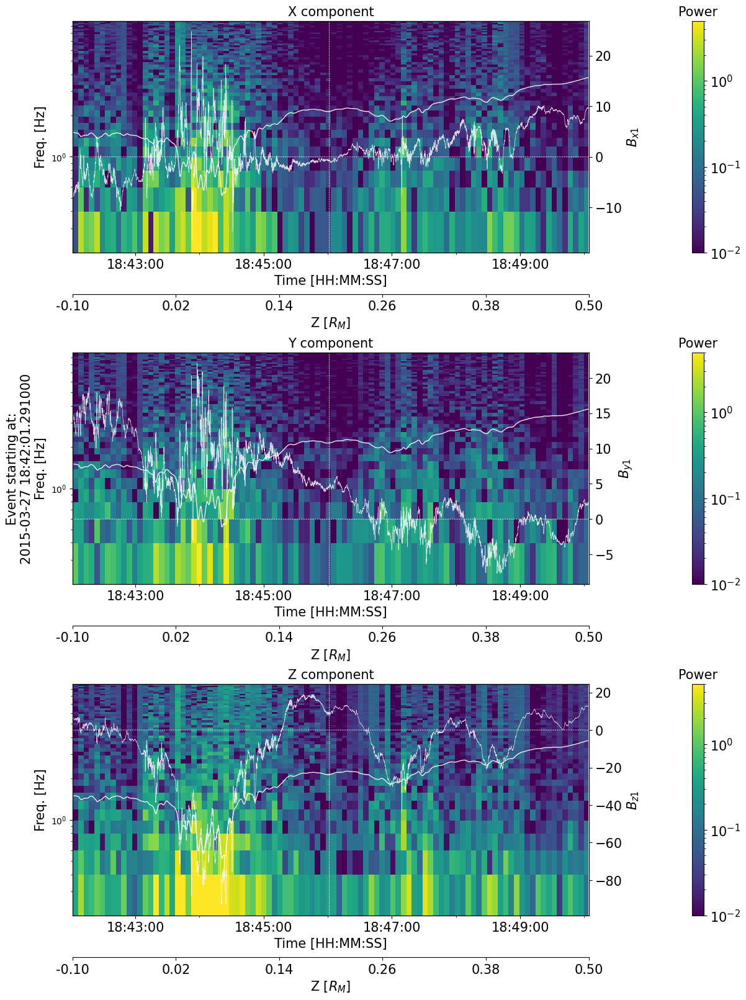

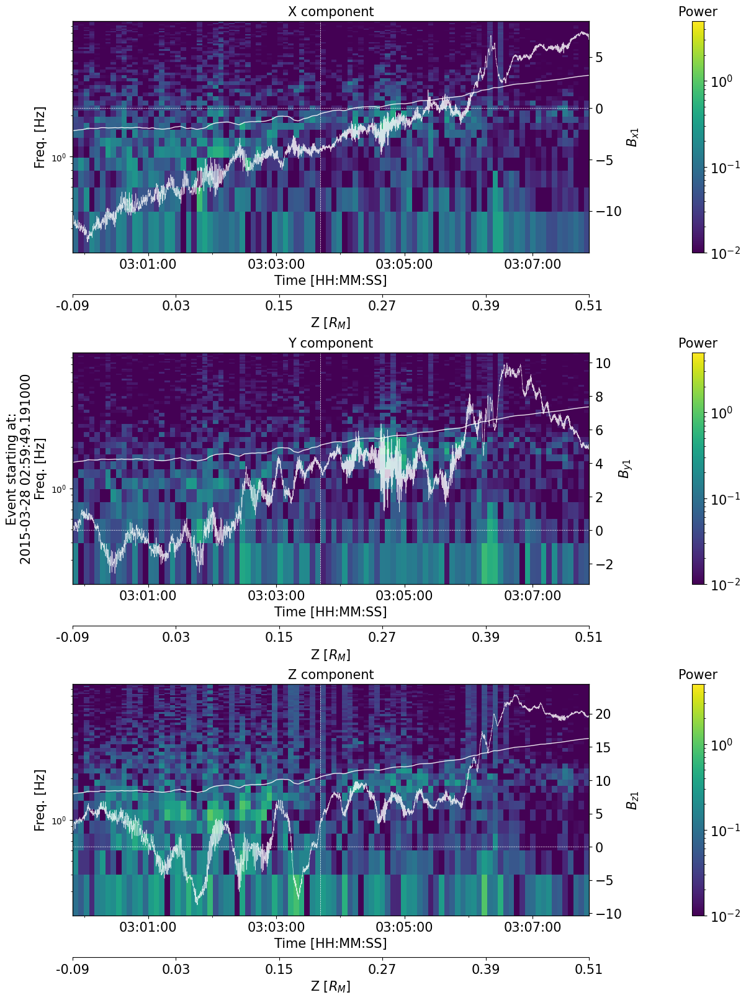

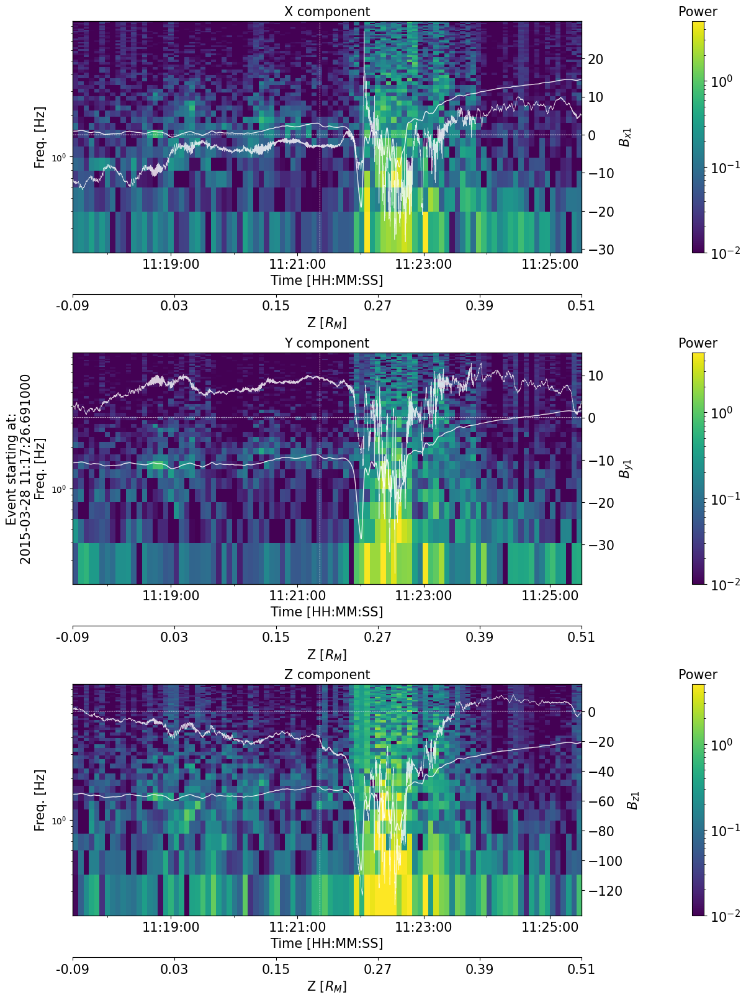

KeyboardInterrupt: 

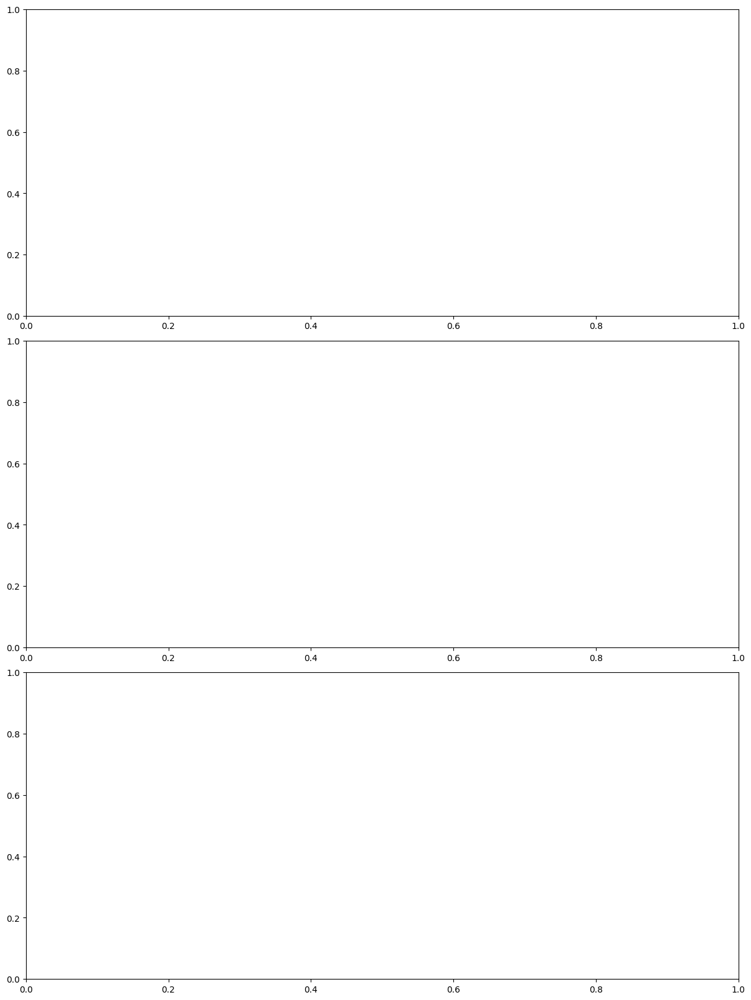

In [9]:
# Attempt a time-dependent frequency spectrum

event_start_times = ["2015-03-27 18:45:00","2015-03-29 12:12:50","2015-04-05 01:57:00", "2015-04-06 19:29:50"]
event_stop_times = ["2015-03-27 18:47:00","2015-03-29 12:14:50","2015-04-05 01:59:00", "2015-04-06 19:32:50"]

#DRS
#event_cs_passes = [23,28,47,52]
#ALL EVENTS
event_cs_passes = np.arange(20,30)

tbin = 5 # Time sampling window
itbin = int(tbin/dt) # Number of indices representing this window

# Declare lists to store all the results
Bx_data_ls = [] # Fourier wave data
By_data_ls = []
Bz_data_ls = []
Bx_val_ls = [] # Direct Bz data
By_val_ls = []
Bz_val_ls = []

#for i in range(len(event_start_times)):
for i in event_cs_passes:
    fig,ax = plt.subplots(nrows=3,figsize=(12,16),constrained_layout=True)
    # Slice out the data
    #indices = np.where((df_cs["timestamp"]>event_start_times[i]) & (df_cs["timestamp"]<event_stop_times[i]))[0]
    #print(df_cs['cs_pass'][indices[0]],df_cs['cs_pass'][indices[-1]])
    indices = np.where(df_cs['cs_pass']==i)[0]
    B_x = df_cs["B_x"][indices].to_numpy()
    B_y = df_cs["B_y"][indices].to_numpy()
    B_z = df_cs["B_z"][indices].to_numpy()

    # Loop over the 
    for j in indices[:-itbin:itbin]:
        # Fourier
        Bx = df_cs["B_x"][j:j+itbin].to_numpy()
        By = df_cs["B_y"][j:j+itbin].to_numpy()
        Bz = df_cs["B_z"][j:j+itbin].to_numpy()
        dt = df_cs["TIME_TAG"][j:j+itbin].to_numpy()[1] - df_cs["TIME_TAG"][j:j+itbin].to_numpy()[0]
        time = df_cs["timestamp"][j:j+itbin].to_numpy()
        sec = np.linspace(0,dt*len(time),len(time))
        N = len(sec)
        freq = fftfreq(N,dt)[:N//2]
        f_x = fft(Bx-df_cs["B_xdip"][j:j+itbin].to_numpy()).real
        f_y = fft(By-df_cs["B_ydip"][j:j+itbin].to_numpy()).real
        f_z = fft(Bz-df_cs["B_zdip"][j:j+itbin].to_numpy()).real

        # Save results to arrays
        if j==indices[0]:
            Bx_data = np.array(2.0/N * np.abs(f_x[0:N//2]))
            By_data = np.array(2.0/N * np.abs(f_y[0:N//2]))
            Bz_data = np.array(2.0/N * np.abs(f_z[0:N//2]))
        else:
            if len(f_x) == itbin: # Sometimes it crashes if we are hitting the end of the timeseries, this should stop it
                Bx_data = np.vstack([Bx_data,2.0/N * np.abs(f_x[0:N//2])])
                By_data = np.vstack([By_data,2.0/N * np.abs(f_y[0:N//2])])
                Bz_data = np.vstack([Bz_data,2.0/N * np.abs(f_z[0:N//2])])
        #ax[i,1].plot(freq,2.0/N * np.abs(f_x[0:N//2]))
    Bx_data_ls.append(Bx_data)
    By_data_ls.append(By_data)
    Bz_data_ls.append(Bz_data)
    Bx_val_ls.append(B_x-df_cs["B_xdip"][indices].to_numpy())
    By_val_ls.append(B_y-df_cs["B_ydip"][indices].to_numpy())
    Bz_val_ls.append(B_z-df_cs["B_zdip"][indices].to_numpy())

    # Plot fourier data
    cmap = 'viridis'#'nipy_spectral'
    interpolation = 'none'#'bilinear'
    vmin = 1e-2
    vmax = 5
    plotx=ax[0].imshow(Bx_data[:,1:].T,origin='lower',norm=LogNorm(vmin=vmin, vmax=vmax), aspect='auto',interpolation=interpolation,
          extent=[df_cs['timestamp'][indices[0]],df_cs['timestamp'][indices[-1]],freq[1],freq[-1]],cmap=cmap)
    ploty=ax[1].imshow(By_data[:,1:].T,origin='lower',norm=LogNorm(vmin=vmin, vmax=vmax), aspect='auto',interpolation=interpolation,
          extent=[df_cs['timestamp'][indices[0]],df_cs['timestamp'][indices[-1]],freq[1],freq[-1]],cmap=cmap)
    plotz=ax[2].imshow(Bz_data[:,1:].T,origin='lower',norm=LogNorm(vmin=vmin, vmax=vmax), aspect='auto',interpolation=interpolation,
          extent=[df_cs['timestamp'][indices[0]],df_cs['timestamp'][indices[-1]],freq[1],freq[-1]],cmap=cmap)

    # Overlay B field
    ax2_ls=[]
    ax2_ls.append(ax[0].twinx())
    ax2_ls.append(ax[1].twinx())
    ax2_ls.append(ax[2].twinx())

    ax2_ls[0].plot(df_cs["timestamp"][indices],B_x-df_cs["B_xdip"][indices].to_numpy(),label='$B_{x1}$',lw=0.5,c='white',alpha=0.8)
    ax2_ls[1].plot(df_cs["timestamp"][indices],B_y-df_cs["B_ydip"][indices].to_numpy(),label='$B_{x1}$',lw=0.5,c='white',alpha=0.8)
    ax2_ls[2].plot(df_cs["timestamp"][indices],B_z-df_cs["B_zdip"][indices].to_numpy(),label='$B_{x1}$',lw=0.5,c='white',alpha=0.8)
    ax2_ls[0].plot(df_cs["timestamp"][indices],B_x*0,label='$B_{x1}$',lw=0.5,c='white',linestyle='dashed')
    ax2_ls[1].plot(df_cs["timestamp"][indices],B_y*0,label='$B_{x1}$',lw=0.5,c='white',linestyle='dashed')
    ax2_ls[2].plot(df_cs["timestamp"][indices],B_z*0,label='$B_{x1}$',lw=0.5,c='white',linestyle='dashed')

    # Compute ion cyclotron frequencies
    smoothing = 20
    B_mag = gaussian_filter1d(np.sqrt(B_x**2+B_y**2+B_z**2)*1e-9,sigma=smoothing) # [T]
    H1_freq = e * B_mag/(2*np.pi*m_p)
    H2_freq = 2*H1_freq
    H3_freq = 3*H1_freq

    # Plot them
    for axi in [0,1,2]:
        ax[axi].plot(df_cs["timestamp"][indices],H1_freq,label='H-1 gyrofreq',lw=1,c='white',alpha=0.9)
        #ax[axi].plot(df_cs["timestamp"][indices],H1_freq/2,label='H-2 gyrofreq',lw=1,c='white',alpha=0.9)
        #ax[axi].plot(df_cs["timestamp"][indices],H1_freq/4,label='H-3 gyrofreq',lw=1,c='white',alpha=0.9)
    
    # Add Z position data
    # Create a twin x-axis that shares the same y-axis
    ax3_ls=[]
    for axi in [0,1,2]:

        # Set number of ticks and format for primary x (time) axis
        #xfmt = md.DateFormatter('%H:%M:%S')
        #ax[axi].xaxis.set_major_formatter(xfmt)
        #ax[axi].xaxis.set_major_locator(plt.MaxNLocator(4))
        ax[axi].xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
        ax[axi].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
        ax[axi].xaxis.set_minor_locator(mdates.MinuteLocator(interval=1))

        # Make frequency a log scale
        ax[axi].set_yscale("log")
        ax[axi].set_ylim(freq[1],freq[-1])
        
        # Set the position of the secondary x-axis
        ax3_ls.append(ax[axi].twiny())
        ax3_ls[axi].spines['bottom'].set_position(('axes', -0.18))
        ax3_ls[axi].xaxis.set_ticks_position('bottom')
        ax3_ls[axi].xaxis.set_label_position('bottom')
        
        # Align x-axes by setting the correct limits and ticks
        x = df_cs["Z"][indices]/R_M
        ax3_ls[axi].set_xlim(x.min(), x.max())
        ax3_ls[axi].set_xlabel('Z [$R_M$]',fontsize=15)  # Secondary x-axis label
        
        # Set ticks and labels on the secondary axis
        ticks = np.linspace(x.min(), x.max(), num=6)
        ax3_ls[axi].set_xticks(ticks)
        ax3_ls[axi].set_xticklabels(['{:.2f}'.format(val) for val in ticks])

        # Show magnetic equator
        ax3_ls[axi].axvline(x = 0.2,lw=0.5,c='white',linestyle='dashed')

        # Set labels
        ax[axi].set_xlabel("Time [HH:MM:SS]",fontsize=15)
        ax[axi].set_ylabel('Freq. [Hz]',fontsize=15)

        # Set tick sizes
        ax[axi].tick_params(axis='x',labelsize=15)
        ax2_ls[axi].tick_params(axis='y',labelsize=15)
        ax3_ls[axi].tick_params(axis='x',labelsize=15)
        ax3_ls[axi].tick_params(axis='y',labelsize=15)

        # Add colorbar
        cbar = plt.colorbar(plotx, ax=ax[axi], norm=LogNorm(),pad=0.1)
        cbar.ax.tick_params(labelsize=15)
        cbar.ax.set_title('Power',fontsize=15)
        cbar.locator = LogLocator()
        cbar.formatter = LogFormatterSciNotation()  
    
    # Add labels
    ax[1].set_ylabel(str('Event starting at:\n'+str(df_cs["timestamp"][indices[0]])+'\nFreq. [Hz]'),fontsize=15)
    ax2_ls[0].set_ylabel("$B_{x1}$",fontsize=15)
    ax2_ls[1].set_ylabel("$B_{y1}$",fontsize=15)
    ax2_ls[2].set_ylabel("$B_{z1}$",fontsize=15)
    ax[0].set_title("X component",fontsize=15)
    ax[1].set_title("Y component",fontsize=15)
    ax[2].set_title("Z component",fontsize=15)
    
    plt.savefig(str("spectra/wave_spectra_"+str(i)+".png"), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

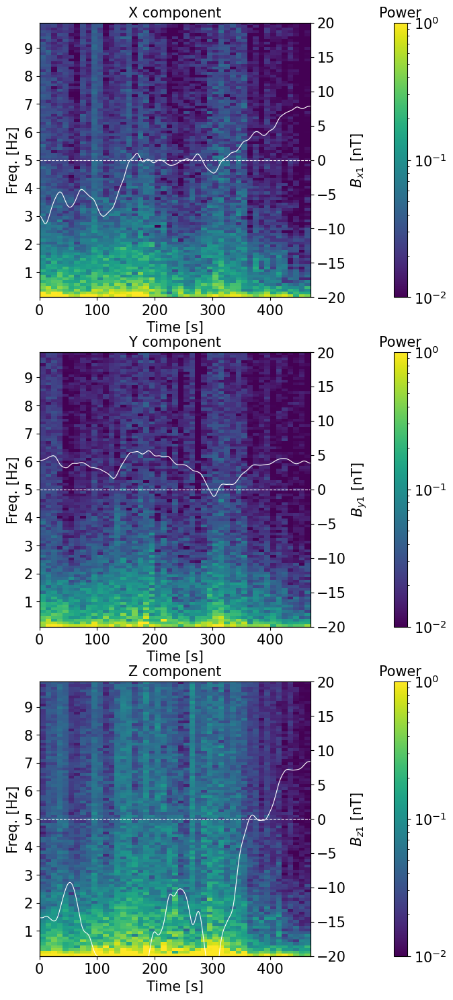

In [196]:
#Plot the difference from the average for the wave power spectra
# Compute average wave spectrum
# First, find the shortest dataseries
min = 1e5
min2 = 1e5
for i in range(len(Bx_data_ls)):
    if len(Bx_data_ls[i])<min:
        min=len(Bx_data_ls[i])
    if len(Bz_val_ls[i])<min2:
        min2=len(Bz_val_ls[i])
    
min-=1
avg_bx_data = np.zeros_like(Bx_data_ls[0][0:min,:])
avg_by_data = np.zeros_like(By_data_ls[0][0:min,:])
avg_bz_data = np.zeros_like(Bz_data_ls[0][0:min,:])
avg_bx_val = np.zeros_like(Bx_val_ls[0][0:min2])
avg_by_val = np.zeros_like(By_val_ls[0][0:min2])
avg_bz_val = np.zeros_like(Bz_val_ls[0][0:min2])
for i in range(len(Bx_data_ls)):
    avg_bx_data+=Bx_data_ls[i][0:min,:]
    avg_by_data+=By_data_ls[i][0:min,:]
    avg_bz_data+=Bz_data_ls[i][0:min,:]
    avg_bx_val+=Bx_val_ls[i][0:min2]
    avg_by_val+=By_val_ls[i][0:min2]
    avg_bz_val+=Bz_val_ls[i][0:min2]
avg_bx_data = avg_bx_data/(i+1)
avg_by_data = avg_by_data/(i+1)
avg_bz_data = avg_bz_data/(i+1)
avg_bx_val = avg_bx_val/(i+1)
avg_by_val = avg_by_val/(i+1)
avg_bz_val = avg_bz_val/(i+1)

# Show average
vmin=1e-2
vmax=1
fig,ax = plt.subplots(nrows=3,figsize=(8,18))
plotx=ax[0].imshow(avg_bx_data[:,1:].T,origin='lower',norm=LogNorm(vmin=vmin, vmax=vmax), aspect='auto',
        extent=[0,min*tbin,freq[1],freq[-1]])
ploty=ax[1].imshow(avg_by_data[:,1:].T,origin='lower',norm=LogNorm(vmin=vmin, vmax=vmax), aspect='auto',
        extent=[0,min*tbin,freq[1],freq[-1]])
plotz=ax[2].imshow(avg_bz_data[:,1:].T,origin='lower',norm=LogNorm(vmin=vmin, vmax=vmax), aspect='auto',
        extent=[0,min*tbin,freq[1],freq[-1]])

# Show average MAG value
ax0_2 = ax[0].twinx()
ax1_2 = ax[1].twinx()
ax2_2 = ax[2].twinx()
ax0_2.plot(np.linspace(0,min*tbin,len(avg_bz_val)),gaussian_filter1d(avg_bx_val,sigma=100),lw=0.8,c='white')
ax0_2.axhline(y = 0,lw=0.8,c='white',linestyle='dashed')
ax1_2.plot(np.linspace(0,min*tbin,len(avg_bz_val)),gaussian_filter1d(avg_by_val,sigma=100),lw=0.8,c='white')
ax1_2.axhline(y = 0,lw=0.8,c='white',linestyle='dashed')
ax2_2.plot(np.linspace(0,min*tbin,len(avg_bz_val)),gaussian_filter1d(avg_bz_val,sigma=100),lw=0.8,c='white')
ax2_2.axhline(y = 0,lw=0.8,c='white',linestyle='dashed')

# Add labels
for axi in ax:
    axi.set_yticks(np.arange(1,10))
    axi.set_ylabel(str('Freq. [Hz]'),fontsize=15)
    axi.set_xlabel("Time [s]",fontsize=15)
    axi.tick_params(axis='x', labelsize=15)
    axi.tick_params(axis='y', labelsize=15)
    cbar = plt.colorbar(plotx, ax=axi, pad=0.2)
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.set_title('Power',fontsize=15)
ax[0].set_title("X component",fontsize=15)
ax[1].set_title("Y component",fontsize=15)
ax[2].set_title("Z component",fontsize=15)
for axi in [ax0_2,ax1_2,ax2_2]:
    axi.set_ylim(-20,20)
    axi.tick_params(axis='y', labelsize=15)
ax0_2.set_ylabel("$B_{x1}$ [nT]",fontsize=15)
ax1_2.set_ylabel("$B_{y1}$ [nT]",fontsize=15)
ax2_2.set_ylabel("$B_{z1}$ [nT]",fontsize=15)


plt.savefig(str("avg_wave_spectra.png"), dpi=300, bbox_inches='tight')
plt.show()
plt.close()



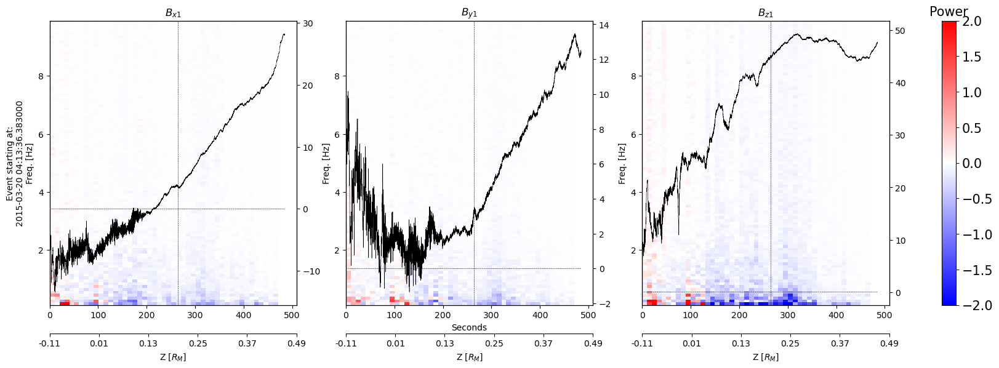

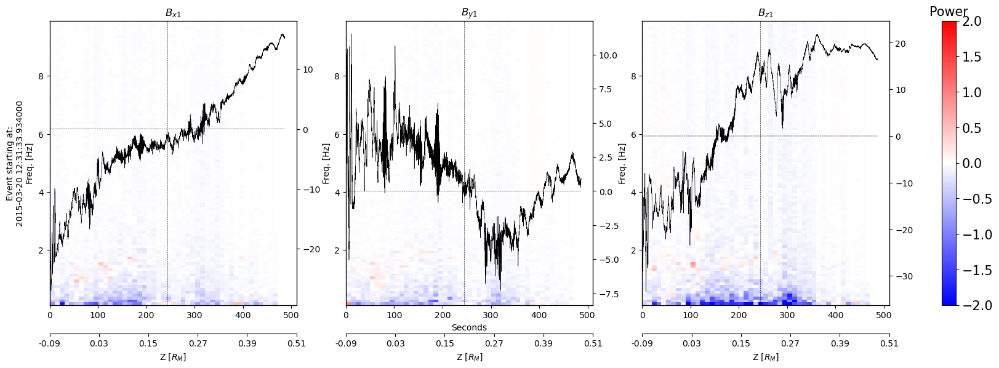

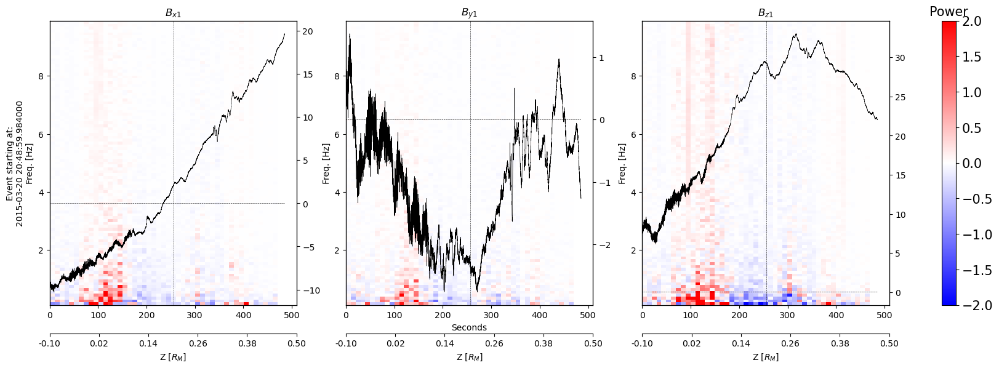

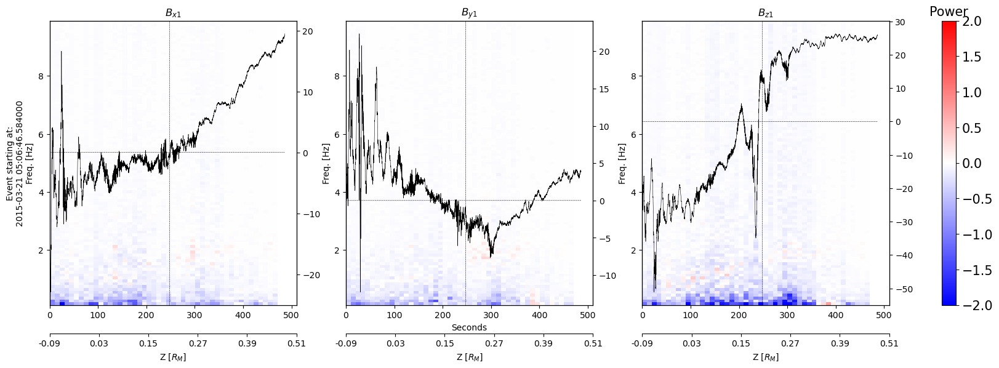

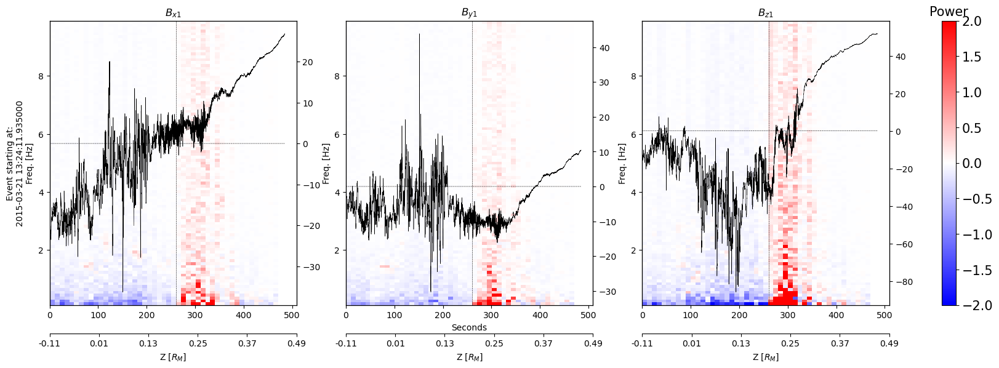

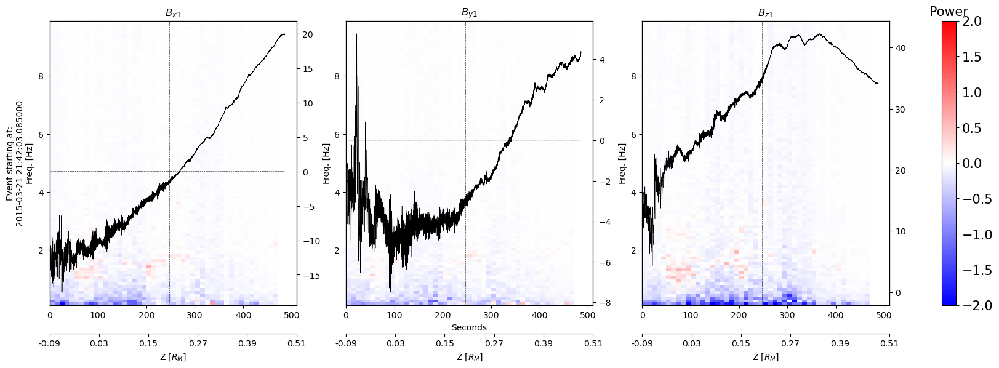

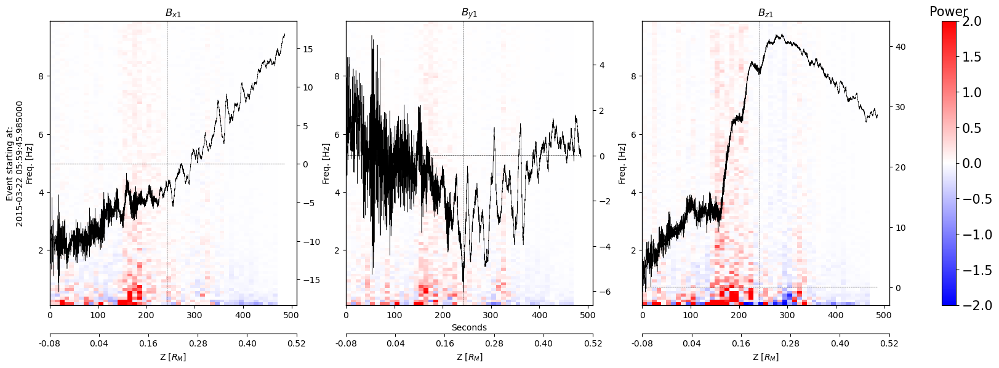

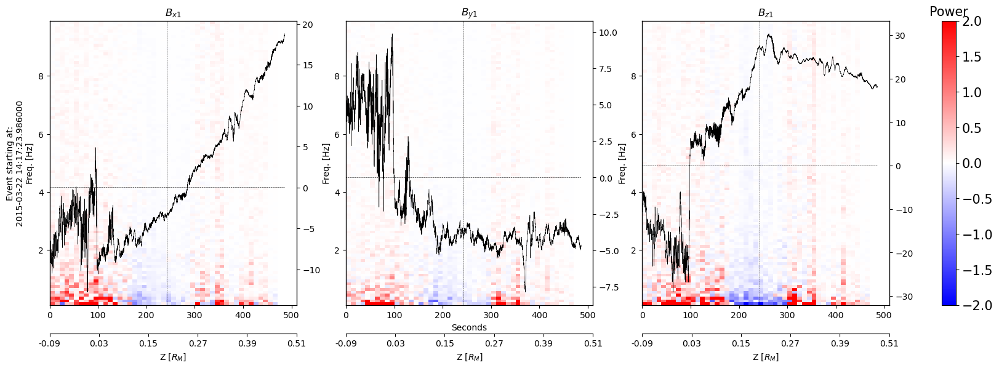

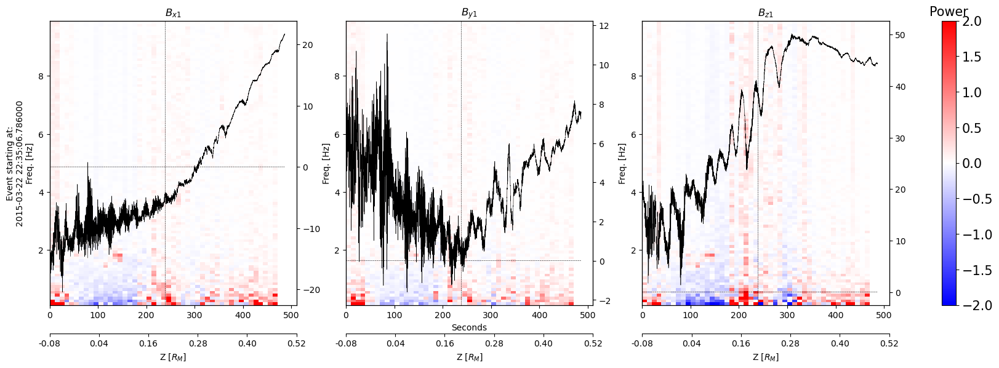

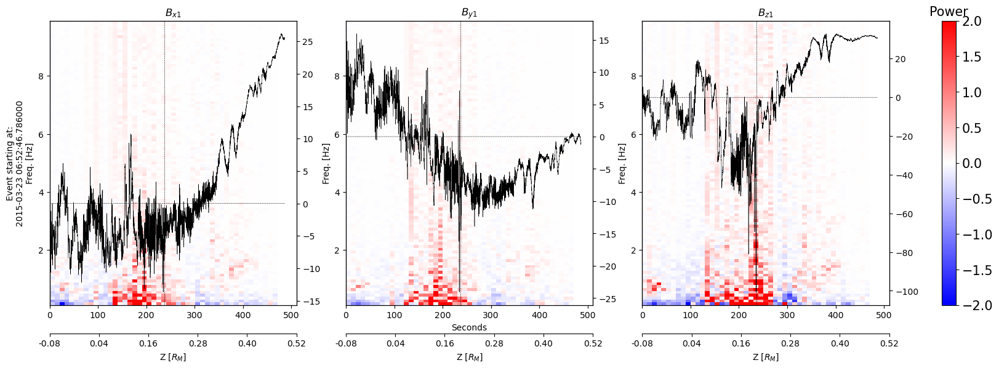

IndexError: list index out of range

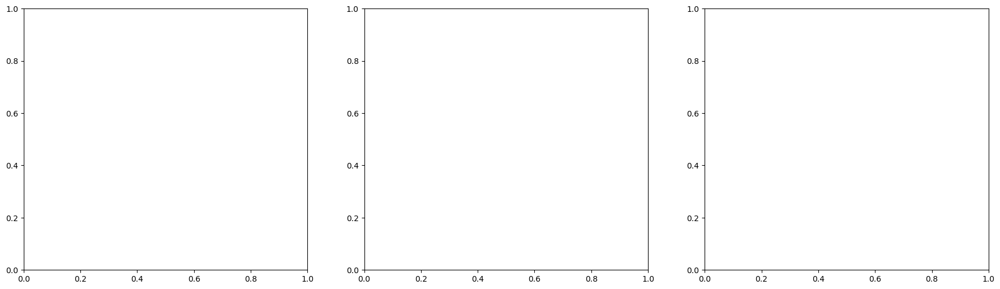

In [200]:
#DRs
event_cs_passes = np.arange(0,67)#[22,27,46,51]

for i in event_cs_passes:
    fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(22,6))
    indices = np.where(df_cs['cs_pass']==i)[0]
    B_x = df_cs["B_x"][indices].to_numpy()
    B_y = df_cs["B_y"][indices].to_numpy()
    B_z = df_cs["B_z"][indices].to_numpy()

    # Plot fourier data
    vmin=-2
    vmax=2
    plotx=ax[0].imshow((Bx_data_ls[i][:min,1:]-avg_bx_data[:,1:]).T,origin='lower', aspect='auto',cmap='bwr',vmin=vmin,vmax=vmax,
          extent=[0,min*tbin,freq[1],freq[-1]])
    ploty=ax[1].imshow((By_data_ls[i][:min,1:]-avg_by_data[:,1:]).T,origin='lower', aspect='auto',cmap='bwr',vmin=vmin,vmax=vmax,
          extent=[0,min*tbin,freq[1],freq[-1]])
    plotz=ax[2].imshow((Bz_data_ls[i][:min,1:]-avg_bz_data[:,1:]).T,origin='lower', aspect='auto',cmap='bwr',vmin=vmin,vmax=vmax,
          extent=[0,min*tbin,freq[1],freq[-1]])

    # Add Z position data
    # Create a twin x-axis that shares the same y-axis
    ax3_ls=[]
    for axi in [0,1,2]:
        # Set the position of the secondary x-axis
        ax3_ls.append(ax[axi].twiny())
        ax3_ls[axi].spines['bottom'].set_position(('axes', -0.1))
        ax3_ls[axi].xaxis.set_ticks_position('bottom')
        ax3_ls[axi].xaxis.set_label_position('bottom')
        
        # Align x-axes by setting the correct limits and ticks
        x = df_cs["Z"][indices]/R_M
        ax3_ls[axi].set_xlim(x.min(), x.max())
        ax3_ls[axi].set_xlabel('Z [$R_M$]')  # Secondary x-axis label
        
        # Set ticks and labels on the secondary axis
        ticks = np.linspace(x.min(), x.max(), num=6)
        ax3_ls[axi].set_xticks(ticks)
        ax3_ls[axi].set_xticklabels(['{:.2f}'.format(val) for val in ticks])

        # Show magnetic equator
        ax3_ls[axi].axvline(x = 0.2,lw=0.4,c='black',linestyle='dashed')

    # Overlay B field
    ax2_ls=[]
    ax2_ls.append(ax[0].twinx())
    ax2_ls.append(ax[1].twinx())
    ax2_ls.append(ax[2].twinx())

    ax2_ls[0].plot(df_cs["TIME_TAG"][indices]-df_cs["TIME_TAG"][indices[0]],B_x-df_cs["B_xdip"][indices].to_numpy(),label='$B_{x1}$',lw=0.4,c='black')
    ax2_ls[1].plot(df_cs["TIME_TAG"][indices]-df_cs["TIME_TAG"][indices[0]],B_y-df_cs["B_ydip"][indices].to_numpy(),label='$B_{x1}$',lw=0.4,c='black')
    ax2_ls[2].plot(df_cs["TIME_TAG"][indices]-df_cs["TIME_TAG"][indices[0]],B_z-df_cs["B_zdip"][indices].to_numpy(),label='$B_{x1}$',lw=0.4,c='black')
    ax2_ls[0].plot(df_cs["TIME_TAG"][indices]-df_cs["TIME_TAG"][indices[0]],B_x*0,label='$B_{x1}$',lw=0.4,c='black',linestyle='dashed')
    ax2_ls[1].plot(df_cs["TIME_TAG"][indices]-df_cs["TIME_TAG"][indices[0]],B_y*0,label='$B_{x1}$',lw=0.4,c='black',linestyle='dashed')
    ax2_ls[2].plot(df_cs["TIME_TAG"][indices]-df_cs["TIME_TAG"][indices[0]],B_z*0,label='$B_{x1}$',lw=0.4,c='black',linestyle='dashed')

    
    # Add colorbar
    cbar = plt.colorbar(plotx, ax=ax[:])
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.set_title('Power',fontsize=15)
    
    # Add labels
    ax[0].set_ylabel(str('Event starting at:\n'+str(df_cs["timestamp"][indices[0]])+'\nFreq. [Hz]'))
    ax[1].set_ylabel(str('\nFreq. [Hz]'))
    ax[2].set_ylabel(str('\nFreq. [Hz]'))
    ax[0].set_title("$B_{x1}$")
    ax[1].set_title("$B_{y1}$")
    ax[2].set_title("$B_{z1}$")
    ax[1].set_xlabel("Seconds")
    
    plt.savefig(str("figs/avg_subtracted_wave_spectra_"+str(i)+".png"), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


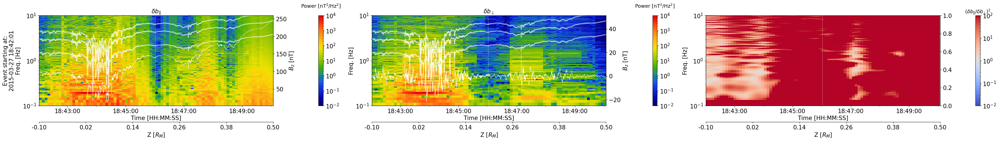

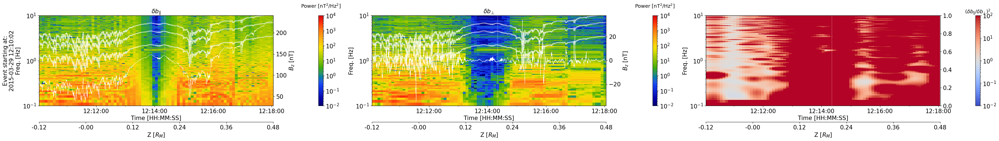

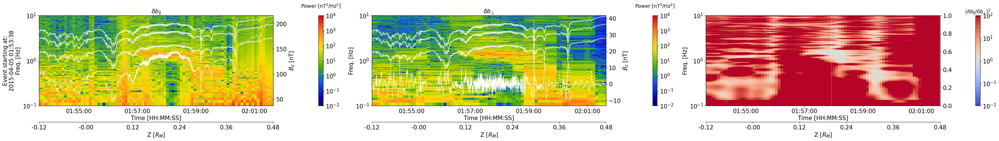

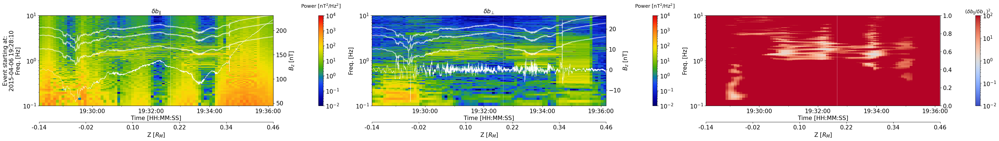

In [108]:
# Show parallel/perpendicular variations

event_cs_passes = [22,27,46,51] #np.arange(0,68)
dt = 0.05
tbin = 60 # Time sampling window for fft [s]
itbin = int(tbin/dt) # Number of indices representing this window
fft_tstep = 5 # Time between ffts [s]
fft_itstep = int(fft_tstep/dt)
smooth_scale = int(10*20) # Interval over which to compute the average background field [dts]

# Declare arrays to save data to for averaging
perp_data = []
para_data = []

for i in event_cs_passes:

    # Set up figure
    fig,ax = plt.subplots(ncols=3,figsize=(36,5),constrained_layout=True)

    # Slice out the data
    indices = np.where(df_cs['cs_pass']==i)[0]
    
    B_x = df_cs["B_x"][indices].to_numpy()
    B_y = df_cs["B_y"][indices].to_numpy()
    B_z = df_cs["B_z"][indices].to_numpy()
    B_mag = np.sqrt(B_x**2+B_y**2+B_z**2)
    
    # Smooth it
    B_x_smooth = uniform_filter1d(B_x,size=smooth_scale) # [T]
    B_y_smooth = uniform_filter1d(B_y,size=smooth_scale)
    B_z_smooth = uniform_filter1d(B_z,size=smooth_scale) #gaussian_filter1d,sigma
    B_mag_smooth = np.sqrt(B_x_smooth**2+B_y_smooth**2+B_z_smooth**2)
    
    # Compute para and perp B fields
    B_para = (B_x*B_x_smooth + B_y*B_y_smooth + B_z*B_z_smooth)/B_mag_smooth
    B_perp = B_mag_smooth - B_para
    

    # Loop over the time binning range
    iter = 0
    for j in range(len(indices))[itbin//2:-itbin//2:fft_itstep]:

        # Compute a fixed average for B_para/perp
        #B_x_avg = np.mean(B_x[j-itbin//2:j+itbin//2])
        #B_y_avg = np.mean(B_y[j-itbin//2:j+itbin//2])
        #B_z_avg = np.mean(B_z[j-itbin//2:j+itbin//2])
        #B_mag_avg = np.sqrt(B_x_avg**2+B_y_avg**2+B_z_avg**2)
        #B_para_ft = (B_x[j-itbin//2:j+itbin//2]*B_x_avg + B_y[j-itbin//2:j+itbin//2]*B_y_avg + B_z[j-itbin//2:j+itbin//2]*B_z_avg)/B_mag_avg
        #B_perp_ft = B_mag_avg - B_para_ft
        
        # Slice out the data
        B_para_ft = B_para[j-itbin//2:j+itbin//2]
        B_perp_ft = B_perp[j-itbin//2:j+itbin//2]

        # Fourier Transform
        dt = df_cs["TIME_TAG"][indices[j-itbin//2:j+itbin//2]].to_numpy()[1] - df_cs["TIME_TAG"][indices[j-itbin//2:j+itbin//2]].to_numpy()[0]
        time = df_cs["timestamp"][indices[j-itbin//2:j+itbin//2]].to_numpy()
        sec = np.linspace(0,dt*len(time),len(time))
        N = len(sec)
        freq = fftfreq(N,dt)[:N//2]
        f_para = np.abs(fft(B_para_ft))**2  #.real
        f_perp = np.abs(fft(B_perp_ft))**2 #.real

        # Save results to arrays
        if iter==0:
            B_para_spectra = np.array(2.0/N * np.abs(f_para[0:N//2])) * freq
            B_perp_spectra = np.array(2.0/N * np.abs(f_perp[0:N//2])) * freq
        else:
            if len(f_para) == itbin: # Sometimes it crashes if we are hitting the end of the timeseries, this should stop it
                B_para_spectra = np.vstack([B_para_spectra,2.0/N * np.abs(f_para[0:N//2]) * freq])
                B_perp_spectra = np.vstack([B_perp_spectra,2.0/N * np.abs(f_perp[0:N//2]) * freq])
        iter+=1

    # Save the spectra for later averaging
    perp_data.append(B_perp_spectra)
    para_data.append(B_para_spectra)
    
    # Plot fourier data
    #cmap = 'nipy_spectral'
    cmap = Colormap('colorcet:cet_r4').to_mpl()
    interpolation = 'none'#'none'
    vmin = 1e-2
    vmax = 1e4
    plot_para = ax[0].imshow(B_para_spectra[:,1:].T,origin='lower',norm=LogNorm(vmin=vmin, vmax=vmax), aspect='auto',interpolation=interpolation,
          extent=[df_cs['timestamp'][indices[0]],df_cs['timestamp'][indices[-1]],freq[1],freq[-1]],cmap=cmap)
    plot_perp = ax[1].imshow(B_perp_spectra[:,1:].T,origin='lower',norm=LogNorm(vmin=vmin, vmax=vmax), aspect='auto',interpolation=interpolation,
          extent=[df_cs['timestamp'][indices[0]],df_cs['timestamp'][indices[-1]],freq[1],freq[-1]],cmap=cmap)
    plot_ratio = ax[2].imshow(gaussian_filter((B_para_spectra[:,1:].T / B_perp_spectra[:,1:].T)**2, sigma = 1.5),origin='lower',
                              norm=LogNorm(vmin=0.01,vmax=100), aspect='auto',interpolation=interpolation,
                              extent=[df_cs['timestamp'][indices[0]],df_cs['timestamp'][indices[-1]],freq[1],freq[-1]],cmap="coolwarm")

    # Compute cyclotron frequencies
    H1_freq = e * B_para*1e-9/(2*np.pi*m_p)
    H2_freq = 2*H1_freq
    H3_freq = 3*H1_freq

    He1_freq = H1_freq/4
    He2_freq = He1_freq*2

    # Plot them
    for axi in ax[0:2]:
        axi.plot(df_cs["timestamp"][indices],H1_freq,label='H-1 gyrofreq',lw=2.5,c='white',alpha=0.5)
        axi.plot(df_cs["timestamp"][indices],H2_freq,label='H-2 gyrofreq',lw=2.5,c='white',alpha=0.5)
        axi.plot(df_cs["timestamp"][indices],H3_freq,label='H-3 gyrofreq',lw=2.5,c='white',alpha=0.5)
        #axi.plot(df_cs["timestamp"][indices],He1_freq,label='H-3 gyrofreq',lw=2.5,c='white',alpha=0.5)
        #axi.plot(df_cs["timestamp"][indices],He2_freq,label='H-3 gyrofreq',lw=2.5,c='white',alpha=0.5)
        
        axi.plot(df_cs["timestamp"][indices],H1_freq,label='H-1 gyrofreq',lw=0.3,c='white',alpha=1)
        axi.plot(df_cs["timestamp"][indices],H2_freq,label='H-2 gyrofreq',lw=0.3,c='white',alpha=1)
        axi.plot(df_cs["timestamp"][indices],H3_freq,label='H-3 gyrofreq',lw=0.3,c='white',alpha=1)
        #axi.plot(df_cs["timestamp"][indices],He1_freq,label='H-3 gyrofreq',lw=0.3,c='white',alpha=1)
        #axi.plot(df_cs["timestamp"][indices],He2_freq,label='H-3 gyrofreq',lw=0.3,c='white',alpha=1)
    
    # Add Z position data
    # Create a twin x-axis that shares the same y-axis
    Zax_ls=[]
    Bzax_ls = []
    for j, axi in enumerate(ax):

        # Show Bz data
        Bzax_ls.append(axi.twinx())
        #Bzax_ls[-1].plot(df_cs["timestamp"][indices],B_z - df_cs["B_zdip"][indices].to_numpy(),color='white',lw = 0.5)
        #Bzax_ls[-1].axhline(y=0,linestyle='dashed',color='white',linewidth=0.5)

        # Set number of ticks and format for primary x (time) axis
        axi.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
        axi.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
        axi.xaxis.set_minor_locator(mdates.MinuteLocator(interval=1))

        # Make frequency a log scale
        axi.set_yscale("log")
        axi.set_ylim(0.1,freq[-1])
        axi.set_yticks([0.1,1,10])
        
        # Set the position of the secondary x-axis
        Zax_ls.append(axi.twiny())
        Zax_ls[-1].spines['bottom'].set_position(('axes', -0.18))
        Zax_ls[-1].xaxis.set_ticks_position('bottom')
        Zax_ls[-1].xaxis.set_label_position('bottom')
        
        # Align x-axes by setting the correct limits and ticks
        x = df_cs["Z"][indices]/R_M
        Zax_ls[-1].set_xlim(x.min(), x.max())
        Zax_ls[-1].set_xlabel('Z [$R_M$]',fontsize=15)  # Secondary x-axis label
        
        # Set ticks and labels on the secondary axis
        ticks = np.linspace(x.min(), x.max(), num=6)
        Zax_ls[-1].set_xticks(ticks)
        Zax_ls[-1].set_xticklabels(['{:.2f}'.format(val) for val in ticks])

        # Show magnetic equator
        Zax_ls[-1].axvline(x = 0.2,lw=0.5,c='white',linestyle='dashed')

        # Set labels
        axi.set_xlabel("Time [HH:MM:SS]",fontsize=15)
        axi.set_ylabel('Freq. [Hz]',fontsize=15)

        # Set tick sizes
        axi.tick_params(axis='x',labelsize=15)
        axi.tick_params(axis='y',labelsize=15)
        Zax_ls[-1].tick_params(axis='x',labelsize=15)
        Bzax_ls[-1].tick_params(axis='y',labelsize=15)

        # Add colorbar
        if j<2:
            cbar = plt.colorbar(plot_para, ax=axi, norm=LogNorm(),pad=0.1)
            cbar.ax.tick_params(labelsize=15)
            cbar.ax.set_title('Power [nT$^2$/Hz$^2$]\n ',fontsize=13)
            cbar.locator = LogLocator()
            cbar.formatter = LogFormatterSciNotation()  
        if j==2:
            cbar = plt.colorbar(plot_ratio, ax=axi, norm=LogNorm(),pad=0.1)
            cbar.ax.tick_params(labelsize=15)
            cbar.ax.set_title('$(\delta b_{∥}/ \delta b_{⊥})^2$',fontsize=13)
            cbar.locator = LogLocator()
            cbar.formatter = LogFormatterSciNotation()  
    
    # Add labels
    ax[0].set_ylabel(str('Event starting at:\n'+str(df_cs["timestamp"][indices[0]].strftime("%Y-%m-%d %H:%M:%S"))+'\nFreq. [Hz]'),fontsize=15)
    ax[0].set_title("$\delta b_{∥}$",fontsize=15)
    ax[1].set_title("$\delta b_{⊥}$",fontsize=15)

    # Show para/perp fields
    Bzax_ls[0].plot(df_cs["timestamp"][indices],B_para,color='white',lw = 0.5)
    Bzax_ls[1].plot(df_cs["timestamp"][indices],B_perp,color='white',lw = 0.5)
    Bzax_ls[0].set_ylabel('$B_{z}$ [nT]',fontsize=15)
    Bzax_ls[1].set_ylabel('$B_{z}$ [nT]',fontsize=15)

    # Save
    plt.savefig(str("spectra/para_perp_spectra_crossing_"+str(i)+".png"), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


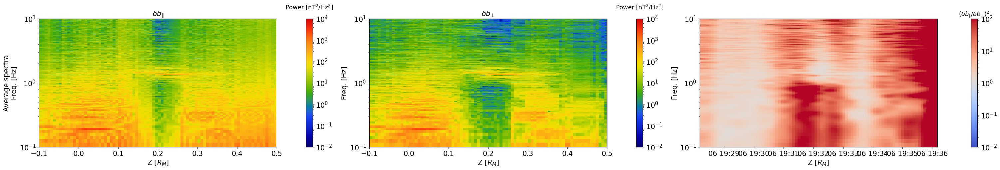

In [17]:
# Show the average spectra for the events just considered
# Work out the maximal size of all the arrays
max_rows = 0
max_cols = 0
for item in para_data:
    if item.shape[0]>max_rows:
        max_rows = item.shape[0]
    if item.shape[1]>max_cols:
        max_cols = item.shape[1]
# First, compute average
para_avg = np.zeros((max_rows, max_cols))
perp_avg = np.zeros((max_rows, max_cols))
for i in range(len(para_data)):
    para_avg[0:para_data[i].shape[0], 0:para_data[i].shape[1]] += para_data[i]
    perp_avg[0:perp_data[i].shape[0], 0:perp_data[i].shape[1]] += perp_data[i]
para_avg = para_avg / (i+1)
perp_avg = perp_avg / (i+1)

# Set up figure
fig,ax = plt.subplots(ncols=3,figsize=(30,5),constrained_layout=True)

# Plot the data
cmap = Colormap('colorcet:cet_r4').to_mpl()
interpolation = 'none'#'none'
vmin = 1e-2
vmax = 1e4
plot_para = ax[0].imshow(para_avg[:-1,1:].T,origin='lower',norm=LogNorm(vmin=vmin, vmax=vmax), aspect='auto',interpolation=interpolation,
      extent=[-0.1,0.5,freq[1],freq[-1]],cmap=cmap)
plot_perp = ax[1].imshow(perp_avg[:-1,1:].T,origin='lower',norm=LogNorm(vmin=vmin, vmax=vmax), aspect='auto',interpolation=interpolation,
      extent=[-0.1,0.5,freq[1],freq[-1]],cmap=cmap)
plot_ratio = ax[2].imshow(gaussian_filter((para_avg[:,1:].T / perp_avg[:,1:].T)**2, sigma = 1.5),origin='lower',
                              norm=LogNorm(vmin=0.01,vmax=100), aspect='auto',interpolation=interpolation,
                              extent=[df_cs['timestamp'][indices[0]],df_cs['timestamp'][indices[-1]],freq[1],freq[-1]],cmap="coolwarm")


for j, axi in enumerate(ax):

    # Make frequency a log scale
    axi.set_yscale("log")
    axi.set_ylim(0.1,freq[-1])
    axi.set_yticks([0.1,1,10])

    # Show magnetic equator
    Zax_ls[-1].axvline(x = 0.2,lw=0.5,c='white',linestyle='dashed')

    # Set labels
    axi.set_xlabel("Z [$R_M$]",fontsize=15)
    axi.set_ylabel('Freq. [Hz]',fontsize=15)

    # Set tick sizes
    axi.tick_params(axis='x',labelsize=15)
    axi.tick_params(axis='y',labelsize=15)

    # Add colorbar
    if j<2:
        cbar = plt.colorbar(plot_para, ax=axi, norm=LogNorm(),pad=0.1)
        cbar.ax.tick_params(labelsize=15)
        cbar.ax.set_title('Power [nT$^2$/Hz$^2$]\n ',fontsize=13)
        cbar.locator = LogLocator()
        cbar.formatter = LogFormatterSciNotation()  
    if j==2:
        cbar = plt.colorbar(plot_ratio, ax=axi, norm=LogNorm(),pad=0.1)
        cbar.ax.tick_params(labelsize=15)
        cbar.ax.set_title('$(\delta b_{∥}/ \delta b_{⊥})^2$',fontsize=13)
        cbar.locator = LogLocator()
        cbar.formatter = LogFormatterSciNotation()  

# Add labels
ax[0].set_ylabel(str('Average spectra\nFreq. [Hz]'),fontsize=15)
ax[0].set_title("$\delta b_{∥}$",fontsize=15)
ax[1].set_title("$\delta b_{⊥}$",fontsize=15)

# Save
plt.savefig(str("spectra/average_spectra.png"), dpi=300, bbox_inches='tight')
plt.show()
plt.close()

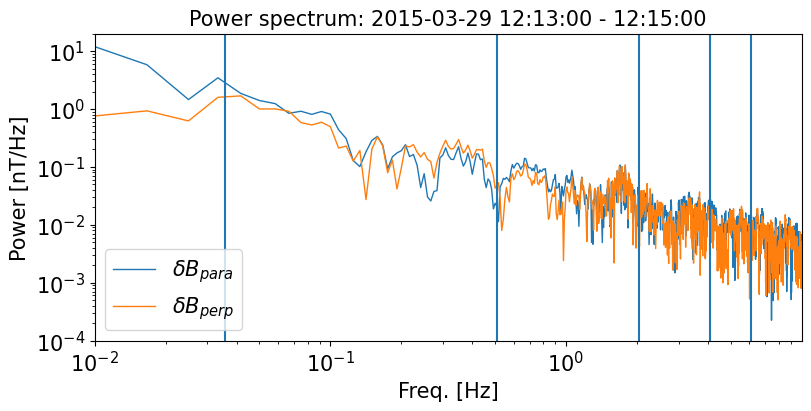

In [8]:
# Show fourier spectra for select time window
event_cs_passes = [22,27]#np.arange(22,30)
smooth_scale = 20*20 # Interval over which to compute the average background field
event_start_time = "2015-03-29 12:13:00"
event_stop_time = "2015-03-29 12:15:00"


# Slice out the data
indices = np.where((df_cs["timestamp"]>event_start_time) & (df_cs["timestamp"]<event_stop_time))[0]

# Set up figure
fig,ax = plt.subplots(figsize=(8,4),constrained_layout=True)

# Compute stuff
B_x = df_cs["B_x"][indices].to_numpy()
B_y = df_cs["B_y"][indices].to_numpy()
B_z = df_cs["B_z"][indices].to_numpy()
B_mag = np.sqrt(B_x**2+B_y**2+B_z**2)

# Smooth it
B_x_smooth = uniform_filter1d(B_x,size=smooth_scale)
B_y_smooth = uniform_filter1d(B_y,size=smooth_scale)
B_z_smooth = uniform_filter1d(B_z,size=smooth_scale)
B_mag_smooth = np.sqrt(B_x_smooth**2+B_y_smooth**2+B_z_smooth**2)

# Compute para and perp B fields
B_para = (B_x*B_x_smooth + B_y*B_y_smooth + B_z*B_z_smooth)/B_mag_smooth
B_perp = B_mag_smooth - B_para

# Fourier Transform
dt = df_cs["TIME_TAG"][indices].to_numpy()[1] - df_cs["TIME_TAG"][indices].to_numpy()[0]
time = df_cs["timestamp"][indices].to_numpy()
sec = np.linspace(0,dt*len(time),len(time))
N = len(sec)
freq = fftfreq(N,dt)[:N//2]
f_para = np.abs(fft(B_para))#.real
f_perp = np.abs(fft(B_perp))#.real

# Show fourier transform
ax.plot(freq,2.0/N * f_para[0:N//2],label='$\delta B_{para}$',lw=1)
ax.plot(freq,2.0/N * f_perp[0:N//2],label='$\delta B_{perp}$',lw=1)

# Show field line resonance freq
h_e = 0.18 # Height / x distance above surface at equator crossing [R_M]
Bze_nt = 140 # Bz at equator crossing [nT]
K_Kprime = 3/5 * h_e # Entropy profile gradient [R_M]
V_fl = 0.5*h_e # Flux tube volume
Ti_kev = 10 # Ion temp, [kev]
beta_avg = 0.1 # field line beta
tau_flr = 73 * np.sqrt(K_Kprime*Bze_nt*V_fl/Ti_kev * (1+5/6*beta_avg))
flr_freq = 1/tau_flr
ax.axvline(flr_freq)

# Show ion cycoltron freq
H_plus = e*np.mean(B_mag)*1e-9/(2*np.pi*amu)
ax.axvline(H_plus)
ax.axvline(H_plus*2)
ax.axvline(H_plus*3)
ax.axvline(H_plus/4)

# Set axes range
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlim(1e-2,freq[-1])
ax.set_ylim(1e-4,2e1)

# Show legend
ax.legend(prop={'size': 15})

# Set labels
ax.tick_params(axis='both',labelsize=15)
ax.set_ylabel("Power [nT/Hz]",fontsize=15)
ax.set_xlabel("Freq. [Hz]",fontsize=15)
ax.set_title(str("Power spectrum: "+event_start_time+" - "+event_stop_time[-8:]),fontsize=15)

plt.savefig(str("spectra/event_spectrum.png"), dpi=300, bbox_inches='tight')

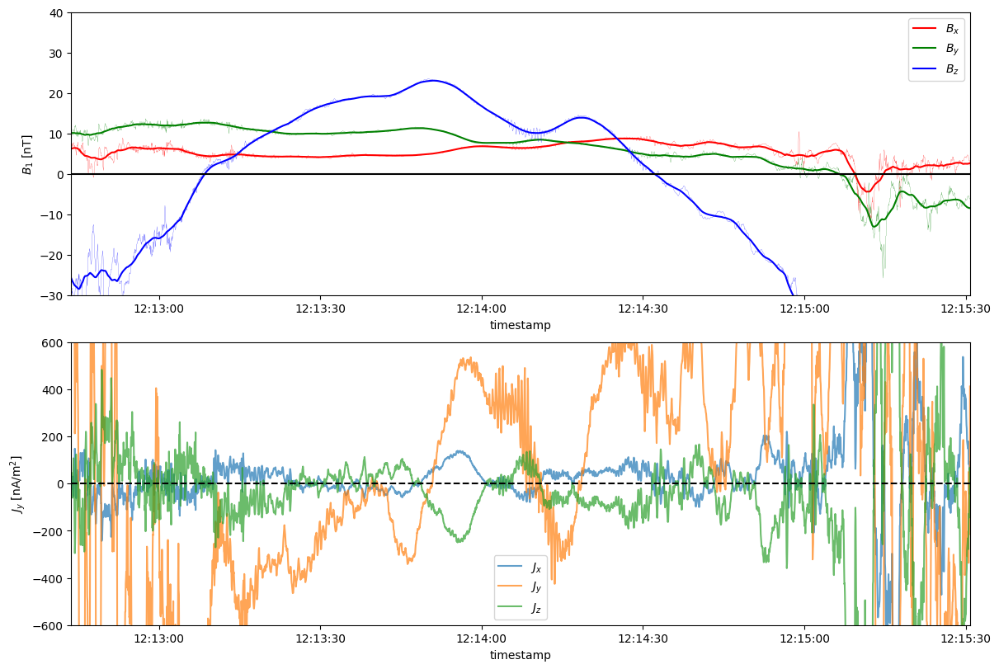

In [558]:
# Compute current density, assuming stationary structure
# Select event:
event_cs_passes = [27]#[22,27,46,51]
smooth_scale = 5*20 #n dts

# Iterate through each 
for cs_pass in event_cs_passes:

    # Set up figure
    fig,axs = plt.subplots(ncols=1,nrows=2,figsize=(12,8),constrained_layout=True)
    ax0=axs[0]
    ax1=axs[1]

    # Slice out the data
    indices = np.where(df_cs['cs_pass']==cs_pass)[0]

    time = df_cs["timestamp"][indices].to_numpy()

    X = df_cs["X"][indices].to_numpy()*1e3 # [m]
    Y = df_cs["Y"][indices].to_numpy()*1e3 # [m]
    Z = df_cs["Z"][indices].to_numpy()*1e3 # [m]

    B_xdip = df_cs["B_xdip"][indices].to_numpy()*1e-9 # [T]
    B_ydip = df_cs["B_ydip"][indices].to_numpy()*1e-9 # [T]
    B_zdip = df_cs["B_zdip"][indices].to_numpy()*1e-9 # [T]
    
    B_x = df_cs["B_x"][indices].to_numpy()*1e-9 #- B_xdip # [T]
    B_y = df_cs["B_y"][indices].to_numpy()*1e-9 #- B_ydip# [T]
    B_z = df_cs["B_z"][indices].to_numpy()*1e-9 #- B_zdip# [T]
    B_mag = np.sqrt(B_x**2+B_y**2+B_z**2) # [T]

    B_x1 = B_x - B_xdip 
    B_y1 = B_y - B_ydip 
    B_z1 = B_z - B_zdip 

    X_smooth = uniform_filter1d(X,size=smooth_scale) # [m]
    Y_smooth = uniform_filter1d(Y,size=smooth_scale)
    Z_smooth = uniform_filter1d(Z,size=smooth_scale)

    B_x_smooth = uniform_filter1d(B_x1,size=smooth_scale) # [T]
    B_y_smooth = uniform_filter1d(B_y1,size=smooth_scale)
    B_z_smooth = uniform_filter1d(B_z1,size=smooth_scale) #gaussian_filter1d,sigma
    B_mag_smooth = np.sqrt(B_x_smooth**2+B_y_smooth**2+B_z_smooth**2)

    # Compute diffs
    dX = np.diff(X)
    dY = np.diff(Y)
    dZ = np.diff(Z)
    dB_x = np.diff(B_x1)
    dB_y = np.diff(B_y1)
    dB_z = np.diff(B_z1)

    # Compute current density
    J_x = (1/mu_0)*(-dB_y/dZ) # +dB_z/dY 
    #J_x[dY==0] = 0
    J_x = np.insert(J_x,-1,J_x[-1]) # repeat last element
    J_y = (1/mu_0)*(dB_x/dZ - dB_z/dX)
    J_y = np.insert(J_y,-1,J_y[-1]) # repeat last element
    J_z = (1/mu_0)*(dB_y/dX) #- dB_x/dY
    #J_z[dY==0] = 0
    J_z = np.insert(J_z,-1,J_z[-1]) # repeat last element
    
    # Computed smoothed currents
    #dX = np.diff(X_smooth)
    #dY = np.diff(Y_smooth)
    #dZ = np.diff(Z_smooth)
    #dB_x = uniform_filter1d(np.diff(B_x_smooth),size=smooth_scale)
    #dB_y = uniform_filter1d(np.diff(B_y_smooth),size=smooth_scale)
    #dB_z = uniform_filter1d(np.diff(B_z_smooth),size=smooth_scale)
    J_x_smooth = uniform_filter1d(J_x, size=smooth_scale)
    J_y_smooth = uniform_filter1d(J_y, size=smooth_scale)
    J_z_smooth = uniform_filter1d(J_z, size=smooth_scale)

    # Compute parallel / perpendicular currents
    J_para = (J_x*B_x + J_y*B_y + J_z*B_z)/B_mag
    J_perp = np.sqrt(J_x**2+J_y**2+J_z**2) - J_para
    J_para_smooth = (J_x_smooth*B_x_smooth + J_y_smooth*B_y_smooth + J_z_smooth*B_z_smooth)/B_mag_smooth
    J_perp_smooth = np.sqrt(J_x_smooth**2+J_y_smooth**2+J_z_smooth**2) - J_para_smooth

    lw = 0.15
    trim = 1*20 # how many dts to cut off ends
    
    ax0.plot(time[trim:-trim],B_x1[trim:-trim]*1e9,c='red',lw=lw)
    #ax0.plot(time[trim:-trim],B_xdip[trim:-trim]*1e9,c='red',linestyle='dashed')
    ax0.plot(time[trim:-trim],B_x_smooth[trim:-trim]*1e9,label="$B_x$",c='red')
    ax0.plot(time[trim:-trim],B_y1[trim:-trim]*1e9,c='green',lw=lw)
    #ax0.plot(time[trim:-trim],B_ydip[trim:-trim]*1e9,c='green',linestyle='dashed')
    ax0.plot(time[trim:-trim],B_y_smooth[trim:-trim]*1e9,c='green',label="$B_y$")
    ax0.plot(time[trim:-trim],B_z1[trim:-trim]*1e9,c='blue',lw=lw)
    #ax0.plot(time[trim:-trim],B_zdip[trim:-trim]*1e9,c='blue',linestyle='dashed')
    ax0.plot(time[trim:-trim],B_z_smooth[trim:-trim]*1e9,c='blue',label="$B_z$")
    ax0.axhline(y=0,color='black')
    #
    #ax1.plot(time,J_y*1e9,c='black',label="J_y",lw=lw)
    #ax1.plot(time[trim:-trim],J_x[trim:-trim]*1e9,lw=lw,color='tab:blue')
    ax1.plot(time[trim:-trim],J_x_smooth[trim:-trim]*1e9,label="$J_x$",alpha=0.7,color='tab:blue')
    ax1.plot(time[trim:-trim],J_y_smooth[trim:-trim]*1e9,label="$J_y$",alpha=0.7,color='tab:orange')
    ax1.plot(time[trim:-trim],J_z_smooth[trim:-trim]*1e9,label="$J_z$",alpha=0.7,color='tab:green')
    #ax1.plot(time[trim:-trim],J_para_smooth[trim:-trim]*1e9,color='black',label="$J_{∥}$")
    ax1.axhline(y=0,c='black',linestyle='dashed')

    ax0.legend()
    ax1.legend()
    ax0.set_xlabel("timestamp")
    ax0.set_ylabel("$B_1$ [nT]")
    #ax0.set_xlim(time[trim],time[-trim])
    #ax0.set_ylim(-60,60)
    ax1.set_xlabel("timestamp")
    ax1.set_ylabel("$J_y$ [nA/m$^2$]")
    #ax1.set_yscale('symlog', linthresh=5e3,linscale=1e10)
    ax0.set_xlim(time[20*60*4],time[-20*60*4])
    ax0.set_ylim(-30,40)
    ax1.set_ylim(-600,600)
    ax1.set_xlim(time[20*60*4],time[-20*60*4])

    # Save
    plt.savefig(str("spectra/currents_cs_pass_"+str(cs_pass)+".png"), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    

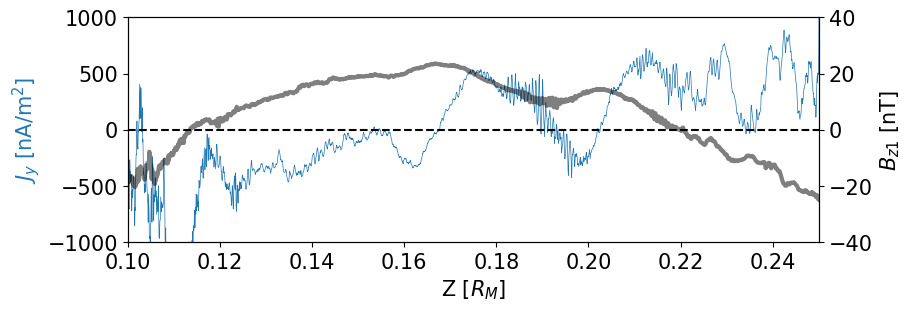

In [564]:
# Harris current sheet fitting
fig,ax1 = plt.subplots(ncols=1,nrows=1,figsize=(9,3),constrained_layout=True) # B
ax2 = ax1.twinx() # Current
#ax2 = ax1.twinx() # Pa

ax1.plot(Z/(R_M*1e3),J_y_smooth*1e9,label="$J_y$",alpha=1,lw=0.5,color='tab:blue')
ax2.plot(Z/(R_M*1e3),(B_z1)*1e9,label="$B_{z1}$",color='black',lw=3,alpha=0.5)

ax1.axhline(y=0,color='black',linestyle='dashed')
# Fit harris sheet to Jy:
# Set region to find CS center and guess at width
z_cs = 0.18 #[R_M]
search_width = 0.02#[R_M]

# Declare a mask for this area
search_mask = (Z/(R_M*1e3) > z_cs - search_width) & (Z/(R_M*1e3) < z_cs + search_width)
# Show fit region
#ax2.axvspan(Z[search_mask][0]/(R_M*1e3), Z[search_mask][-1]/(R_M*1e3), color='black',alpha=0.02) 

# Fit to sheet
def J_y_harris(z, A, width, z0): 
    # Z in R_M, A in nA/m^2, widt in R_M, Z0 in R_M
    return A * (np.cosh((z-z0)/width))**(-2)
popt, pcov = curve_fit(J_y_harris, Z[search_mask]/(R_M*1e3), J_y_smooth[search_mask]*1e9)

# Show fit harris sheet
#ax2.plot(Z[search_mask]/(R_M*1e3), J_y_harris(Z[search_mask]/(R_M*1e3), *popt), color='tab:blue',alpha = 0.8, lw = 2)

# Print pressure max
B_0 = (popt[0]*mu_0 * (popt[1]*R_M*1e3))*1e-9 #[nT]
delta_p = (popt[0]*1e-9)**2 * (popt[1]*(R_M*1e3))**2*mu_0/2

# Fix axes
ax2.set_xlim(0.1,0.25)
ax1.set_ylim(-1000,1000)
ax2.set_ylim(-40,40)

# Set font size
ax1.tick_params(axis='both',labelsize=15)
ax2.tick_params(axis='both',labelsize=15)
ax1.set_xlabel("Z [$R_M$]",fontsize=15)
ax1.set_ylabel("$J_y$ [nA/m$^2$]",fontsize=15,color='tab:blue')
ax2.set_ylabel("$B_{z1}$ [nT]",fontsize=15)

fig.savefig(str('DR_'+str(DR_event)+'_Hy.png'),bbox_inches='tight', dpi=300)
plt.show()

In [407]:
# SAVE TRAJECTORY FOR DATA MODEL COMPARISON
dir = "/Users/atcushen/Documents/MercuryModelling/runs/nightside_v5_run3/alldata/"    
pickle.dump(df_cs, open(str(dir+"_MAG_df_cs"), 'wb') )

In [73]:
# Compute current sheet altitudes
events = np.unique(df_cs["cs_pass"])#[22,27,46,51] #np.arange(0,66)
avg = 0
count = 0

for event in events:
    indices = np.where(df_cs['cs_pass']==event)[0]

    midpoint = indices[len(indices)//2]

    alt = np.sqrt(df_cs['X'][midpoint]**2+df_cs['Y'][midpoint]**2+df_cs['Z'][midpoint]**2)
    #print(df_cs['X'][midpoint]/R_M,df_cs['Y'][midpoint]/R_M,df_cs['Z'][midpoint]/R_M)

    avg+=alt
    count+=1

avg = avg/count - R_M

print("total crossings considered:",count)
print("Avg. altitude of CS crossing:", avg/R_M)

total crossings considered: 67
Avg. altitude of CS crossing: 0.21993030360186658


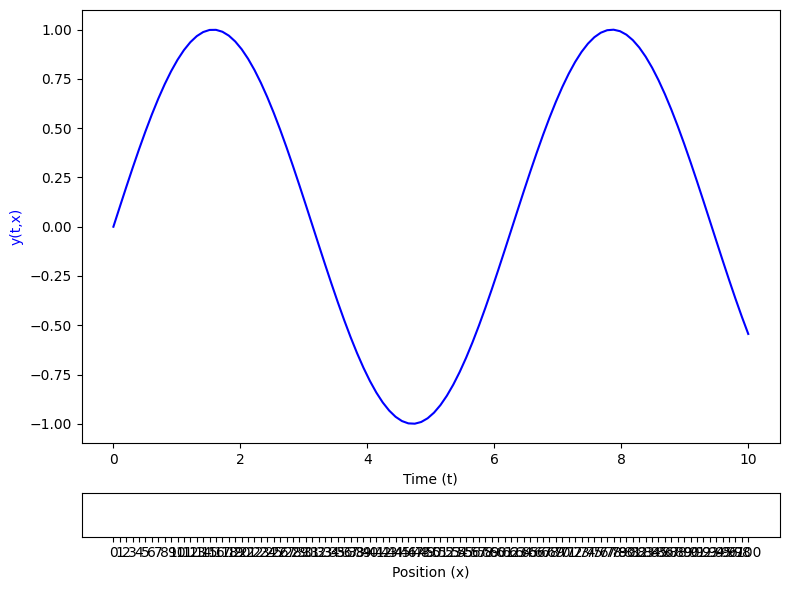

In [155]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Example data
t = np.linspace(0, 10, 100)  # Time data
x = np.linspace(0, 100, 100)  # Position data
y = np.sin(t)  # Example function, replace with your y(t, x)

# Create the main plot
fig, ax1 = plt.subplots(figsize=(8, 6))

# Plot y vs t
ax1.plot(t, y, 'b-', label='y(t,x)')
ax1.set_xlabel('Time (t)')
ax1.set_ylabel('y(t,x)', color='b')

# Create a divider for the existing axes instance
divider = make_axes_locatable(ax1)

# Append a new axes below the existing one for the x-position
ax2 = divider.append_axes("bottom", size="10%", pad=0.5)

# Link the x-limits of ax2 to ax1
ax2.set_xlim(ax1.get_xlim())

# Set the new x-axis to represent position
ax2.set_xlabel('Position (x)')

# Set the ticks and labels
tick_positions = t  # Use the same positions as t, or adjust as needed
tick_labels = [f'{int(pos)}' for pos in x]  # Format x positions
ax2.set_xticks(tick_positions)
ax2.set_xticklabels(tick_labels)

# Remove y-axis ticks and labels for ax2
ax2.yaxis.set_ticks([])
ax2.yaxis.set_ticklabels([])

# Optionally, adjust layout for clarity
plt.tight_layout()

# Show the plot
plt.show()

In [26]:
avg-0.17*R_M

122.63486535862393